In [102]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
tej = pd.read_csv('tej.csv', skipinitialspace=True)
tcri = pd.read_csv('tcri.csv')
tej.columns = tej.columns.str.strip()

In [103]:
tej.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21767 entries, 0 to 21766
Data columns (total 54 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   公司                 21767 non-null  object 
 1   年/月                21767 non-null  object 
 2   季別                 21767 non-null  int64  
 3   合併(Y/N)            21767 non-null  object 
 4   月份                 21767 non-null  int64  
 5   幣別                 21767 non-null  object 
 6   現金及約當現金            21767 non-null  object 
 7   流動資產               21767 non-null  object 
 8   資產總額               21767 non-null  object 
 9   流動負債               21767 non-null  object 
 10  負債總額               21767 non-null  object 
 11  普通股股本              21767 non-null  object 
 12  股本                 21767 non-null  object 
 13  資本公積合計             21767 non-null  object 
 14  保留盈餘               21767 non-null  object 
 15  股東權益總額             21767 non-null  object 
 16  營業收入淨額             217

In [104]:
tcri.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14142 entries, 0 to 14141
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   coid    14142 non-null  int64  
 1   mdate   14142 non-null  object 
 2   tcri    14142 non-null  object 
 3   scr     14126 non-null  float64
 4   xcdt    226 non-null    object 
dtypes: float64(1), int64(1), object(3)
memory usage: 552.6+ KB


In [105]:
tcri['mdate'] = pd.to_datetime(tcri['mdate']).dt.year
tcri

,coid,mdate,tcri,scr,xcdt
0,1103,2014,6,400.00,NaN
1,1103,2015,6,432.00,NaN
2,1103,2016,6,371.00,NaN
3,1103,2017,6,330.00,NaN
4,1103,2018,6,331.00,NaN
...,...,...,...,...,...
14137,9962,2020,6,376.00,NaN
14138,9962,2021,6,418.00,NaN
14139,9962,2022,6,599.00,NaN
14140,9962,2023,6,494.00,NaN


### 合併

In [108]:
tej['公司編號'] = tej['公司'].str.extract('(\d+)').astype(int)
tej['年份'] = tej['年/月'].str.split('/').str[0].astype(int)
tej['月份'] = tej['年/月'].str.split('/').str[1].astype(int)
tej_december = tej[tej['月份'] == 12].copy()

tcri['coid'] = tcri['coid'].astype(int)
tcri['mdate'] = tcri['mdate'].astype(int)

# 合併
merged_data = tej_december.merge(
    tcri[['coid', 'mdate', 'tcri']], 
    left_on=['公司編號', '年份'], 
    right_on=['coid', 'mdate'], 
    how='left'
)

<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:1: SyntaxWarning: invalid escape sequence '\d'
C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\4288742798.py:1: SyntaxWarning: invalid escape sequence '\d'
  tej['公司編號'] = tej['公司'].str.extract('(\d+)').astype(int)


In [109]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11014 entries, 0 to 11013
Data columns (total 59 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   公司                 11014 non-null  object 
 1   年/月                11014 non-null  object 
 2   季別                 11014 non-null  int64  
 3   合併(Y/N)            11014 non-null  object 
 4   月份                 11014 non-null  int32  
 5   幣別                 11014 non-null  object 
 6   現金及約當現金            11014 non-null  object 
 7   流動資產               11014 non-null  object 
 8   資產總額               11014 non-null  object 
 9   流動負債               11014 non-null  object 
 10  負債總額               11014 non-null  object 
 11  普通股股本              11014 non-null  object 
 12  股本                 11014 non-null  object 
 13  資本公積合計             11014 non-null  object 
 14  保留盈餘               11014 non-null  object 
 15  股東權益總額             11014 non-null  object 
 16  營業收入淨額             110

In [113]:
merged_data

,公司,年/月,季別,合併(Y/N),月份,幣別,現金及約當現金,流動資產,資產總額,流動負債,...,或有負債/淨值,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率,公司編號,年份,coid,mdate,tcri
0,1101 台泥,2024/12,4,Y,12,NTD,"77,764,504","173,380,580","593,413,647","86,373,382",...,0,22.1,29.46,29.51,66.89,1101,2024,NaN,NaN,NaN
1,1101 台泥,2018/12,4,Y,12,NTD,"48,507,889","110,380,695","344,085,118","64,503,844",...,0,53.09,57.54,20.33,79.58,1101,2018,NaN,NaN,NaN
2,1101 台泥,2016/12,4,Y,12,NTD,"28,179,758","77,884,012","266,988,696","55,104,919",...,0.34,35.3,31.19,15.8,84.2,1101,2016,NaN,NaN,NaN
3,1101 台泥,2015/12,4,Y,12,NTD,"38,977,360","90,593,376","293,066,355","68,083,832",...,0.34,26.2,23.47,14.98,85.02,1101,2015,NaN,NaN,NaN
4,1101 台泥,2022/12,4,Y,12,NTD,"88,842,494","175,624,058","460,808,961","75,209,411",...,0,1.58,9.03,27.55,65.98,1101,2022,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11009,9958 世紀鋼,2016/12,4,Y,12,NTD,"466,056","3,825,398","6,410,651","1,696,644",...,0,8.67,5.81,23.9,76.1,9958,2016,9958.00,2016.00,7
11010,9958 世紀鋼,2014/12,4,Y,12,NTD,"83,546","3,909,149","6,169,744","1,223,401",...,0,7.32,4.56,71.82,28.18,9958,2014,9958.00,2014.00,7
11011,9958 世紀鋼,2022/12,4,Y,12,NTD,"1,312,925","11,725,747","29,360,142","8,642,269",...,0,3.98,7.12,68.43,31.57,9958,2022,9958.00,2022.00,5
11012,9958 世紀鋼,2024/12,4,Y,12,NTD,"6,574,329","19,298,266","41,319,667","5,990,814",...,0,115.66,114.21,41.59,58.41,9958,2024,9958.00,2024.00,5


### change object(D->10 C->11)

In [114]:
columns_to_skip = merged_data.columns[:5].tolist()

object_columns = merged_data.iloc[:, 5:].select_dtypes(include=['object']).columns.tolist()

merged_data['tcri'] = merged_data['tcri'].replace({
    'D': 10,
    'C': 11
})

def simple_convert(df, columns):
    df_converted = df.copy()
    
    for col in columns:

        df_converted[col] = df_converted[col].astype(str).str.replace(',', '').str.replace(' ', '')
        df_converted[col] = pd.to_numeric(df_converted[col], errors='coerce')
        original_non_null = df[col].notna().sum()
        new_non_null = df_converted[col].notna().sum()
        conversion_rate = new_non_null / original_non_null * 100 if original_non_null > 0 else 0
    
    return df_converted
merged_data = simple_convert(merged_data, object_columns)

In [115]:
pd.set_option('display.float_format', '{:.2f}'.format)
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11014 entries, 0 to 11013
Data columns (total 59 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   公司                 11014 non-null  object 
 1   年/月                11014 non-null  object 
 2   季別                 11014 non-null  int64  
 3   合併(Y/N)            11014 non-null  object 
 4   月份                 11014 non-null  int32  
 5   幣別                 0 non-null      float64
 6   現金及約當現金            11013 non-null  float64
 7   流動資產               10673 non-null  float64
 8   資產總額               11014 non-null  int64  
 9   流動負債               10673 non-null  float64
 10  負債總額               11014 non-null  int64  
 11  普通股股本              11014 non-null  int64  
 12  股本                 11014 non-null  int64  
 13  資本公積合計             11014 non-null  int64  
 14  保留盈餘               11014 non-null  int64  
 15  股東權益總額             11014 non-null  int64  
 16  營業收入淨額             109

In [121]:
merged_data[merged_data['tcri'] == 10]

,公司,年/月,季別,合併(Y/N),月份,幣別,現金及約當現金,流動資產,資產總額,流動負債,...,或有負債/淨值,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率,公司編號,年份,coid,mdate,tcri
112,1213 大飲,2023/12,4,Y,12,NaN,1125.00,32646.00,819325,554815.00,...,0.00,-25.06,-20.93,NaN,0.00,1213,2023,1213.00,2023.00,10.00
645,1418 東華,2017/12,4,Y,12,NaN,40125.00,312558.00,1581782,1169539.00,...,0.00,-51.07,-55.92,NaN,0.00,1418,2017,1418.00,2017.00,10.00
649,1418 東華,2019/12,4,Y,12,NaN,205371.00,416111.00,2456023,291753.00,...,0.00,-33.86,-37.68,NaN,0.00,1418,2019,1418.00,2019.00,10.00
650,1418 東華,2020/12,4,Y,12,NaN,56186.00,177008.00,2232986,121582.00,...,0.00,-48.08,-38.93,NaN,0.00,1418,2020,1418.00,2020.00,10.00
652,1418 東華,2018/12,4,Y,12,NaN,239665.00,361499.00,2668543,61586.00,...,0.00,-35.58,-38.32,NaN,0.00,1418,2018,1418.00,2018.00,10.00
653,1418 東華,2016/12,4,Y,12,NaN,45288.00,464794.00,1772056,1126152.00,...,0.00,-12.78,-13.42,NaN,0.00,1418,2016,1418.00,2016.00,10.00
654,1418 東華,2021/12,4,Y,12,NaN,352852.00,378103.00,3555900,15259.00,...,0.00,-43.22,-28.09,NaN,0.00,1418,2021,1418.00,2021.00,10.00
853,1449 佳和,2014/12,4,Y,12,NaN,143612.00,2136258.00,5117915,1752513.00,...,3.85,-30.69,2.13,100.00,0.00,1449,2014,1449.00,2014.00,10.00
2383,2025 千興,2015/12,4,Y,12,NaN,126734.00,1120481.00,2573705,1410185.00,...,0.00,-9.90,-12.65,NaN,0.00,2025,2015,2025.00,2015.00,10.00
2384,2025 千興,2019/12,4,N,12,NaN,155627.00,888845.00,1920233,727909.00,...,0.00,-7.01,-6.32,NaN,0.00,2025,2019,2025.00,2019.00,10.00


### Delete no tcri

In [122]:
merged_data_clean = merged_data.dropna(subset=['tcri'])
#merged_data_clean = merged_data
merged_data_clean

,公司,年/月,季別,合併(Y/N),月份,幣別,現金及約當現金,流動資產,資產總額,流動負債,...,或有負債/淨值,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率,公司編號,年份,coid,mdate,tcri
22,1103 嘉泥,2022/12,4,Y,12,NaN,4463396.00,10395347.00,36454234,3431484.00,...,1.44,-5.10,-1.57,NaN,-128.35,1103,2022,1103.00,2022.00,6.00
23,1103 嘉泥,2016/12,4,Y,12,NaN,2341044.00,9443483.00,26128917,1981486.00,...,2.57,-5.90,1.02,-522.59,622.59,1103,2016,1103.00,2016.00,6.00
24,1103 嘉泥,2018/12,4,Y,12,NaN,1969663.00,11150914.00,31985629,3195396.00,...,2.02,-1.34,5.52,-10.29,110.29,1103,2018,1103.00,2018.00,6.00
25,1103 嘉泥,2019/12,4,Y,12,NaN,2066897.00,10657604.00,38720634,3700460.00,...,1.62,-5.61,12.72,40.52,59.48,1103,2019,1103.00,2019.00,6.00
26,1103 嘉泥,2020/12,4,Y,12,NaN,3375981.00,11726520.00,40646227,3042465.00,...,1.44,10.62,27.18,38.81,61.19,1103,2020,1103.00,2020.00,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11009,9958 世紀鋼,2016/12,4,Y,12,NaN,466056.00,3825398.00,6410651,1696644.00,...,0.00,8.67,5.81,23.90,76.10,9958,2016,9958.00,2016.00,7.00
11010,9958 世紀鋼,2014/12,4,Y,12,NaN,83546.00,3909149.00,6169744,1223401.00,...,0.00,7.32,4.56,71.82,28.18,9958,2014,9958.00,2014.00,7.00
11011,9958 世紀鋼,2022/12,4,Y,12,NaN,1312925.00,11725747.00,29360142,8642269.00,...,0.00,3.98,7.12,68.43,31.57,9958,2022,9958.00,2022.00,5.00
11012,9958 世紀鋼,2024/12,4,Y,12,NaN,6574329.00,19298266.00,41319667,5990814.00,...,0.00,115.66,114.21,41.59,58.41,9958,2024,9958.00,2024.00,5.00


### delete mdate coid first 5 column

In [123]:
columns_to_drop = ['mdate', 'coid']
existing_columns_to_drop = [col for col in columns_to_drop if col in merged_data_clean.columns]
merged_data_clean = merged_data_clean.drop(columns=existing_columns_to_drop)

In [124]:
columns_to_drop = merged_data_clean.columns[:6].tolist()

merged_data_final = merged_data_clean.drop(columns=columns_to_drop)

company_col = '公司編號' if '公司編號' in merged_data_final.columns else 'coid'
year_col = '年份' if '年份' in merged_data_final.columns else 'mdate'

other_columns = [col for col in merged_data_final.columns if col not in [company_col, year_col]]
new_column_order = [company_col, year_col] + other_columns

merged_data_final = merged_data_final[new_column_order]

for i, col in enumerate(merged_data_final.columns):
    print(f"  {i+1:2d}. {col}")

   1. 公司編號
   2. 年份
   3. 現金及約當現金
   4. 流動資產
   5. 資產總額
   6. 流動負債
   7. 負債總額
   8. 普通股股本
   9. 股本
  10. 資本公積合計
  11. 保留盈餘
  12. 股東權益總額
  13. 營業收入淨額
  14. 營業成本
  15. 營業毛利
  16. 營業費用
  17. 營運資金
  18. 研究發展費
  19. 預期信用減損（損失）利益－營業費用
  20. 營業利益
  21. 財務成本
  22. 稅前淨利
  23. 稅前息前淨利
  24. 來自營運之現金流量
  25. 投資活動之現金流量
  26. 籌資活動之現金流量
  27. Tobins Q
  28. 財務槓桿度
  29. 營運槓桿度
  30. 利息保障倍數
  31. ROA－綜合損益
  32. ROE－綜合損益
  33. 現金流量允當比
  34. 現金再投資比
  35. 流動比率
  36. 速動比率
  37. 利息支出率
  38. 利息支出率(B)
  39. 總負債/總淨值
  40. 負債比率
  41. 淨值/資產
  42. 長期資金適合率(A)
  43. 長短期借款
  44. 淨負債
  45. 借款依存度
  46. 或有負債/淨值
  47. 營業利益 /實收資本比
  48. 稅前純益 /實收資本
  49. 內部保留比率
  50. 股利支付率
  51. tcri


In [125]:
merged_data_final

,公司編號,年份,現金及約當現金,流動資產,資產總額,流動負債,負債總額,普通股股本,股本,資本公積合計,...,長期資金適合率(A),長短期借款,淨負債,借款依存度,或有負債/淨值,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率,tcri
22,1103,2022,4463396.00,10395347.00,36454234,3431484.00,14454807,7747805,7747805,1238426,...,607.19,10173996.00,356009.00,46.25,1.44,-5.10,-1.57,NaN,-128.35,6.00
23,1103,2016,2341044.00,9443483.00,26128917,1981486.00,10315659,7747805,7747805,617579,...,1115.35,7902023.00,2775186.00,49.97,2.57,-5.90,1.02,-522.59,622.59,6.00
24,1103,2018,1969663.00,11150914.00,31985629,3195396.00,11065810,7747805,7747805,703931,...,778.94,7735152.00,1847995.00,36.98,2.02,-1.34,5.52,-10.29,110.29,6.00
25,1103,2019,2066897.00,10657604.00,38720634,3700460.00,15044409,7747805,7747805,847377,...,484.60,10049179.00,312847.00,42.44,1.62,-5.61,12.72,40.52,59.48,6.00
26,1103,2020,3375981.00,11726520.00,40646227,3042465.00,15628878,7747805,7747805,960402,...,545.39,11000781.00,-245316.00,43.97,1.44,10.62,27.18,38.81,61.19,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11009,9958,2016,466056.00,3825398.00,6410651,1696644.00,3847156,1855581,1855581,69141,...,214.48,2917938.00,2451882.00,113.83,0.00,8.67,5.81,23.90,76.10,7.00
11010,9958,2014,83546.00,3909149.00,6169744,1223401.00,3951835,1819197,1819197,69707,...,237.13,3084643.00,3000819.00,139.08,0.00,7.32,4.56,71.82,28.18,7.00
11011,9958,2022,1312925.00,11725747.00,29360142,8642269.00,19119083,2323964,2323964,3038789,...,140.95,10414674.00,7224739.00,101.70,0.00,3.98,7.12,68.43,31.57,5.00
11012,9958,2024,6574329.00,19298266.00,41319667,5990814.00,18853036,2568967,2568967,6521497,...,190.35,11340464.00,2496445.00,50.48,0.00,115.66,114.21,41.59,58.41,5.00


In [126]:
merged_data_final = merged_data_final.sort_values(['公司編號', '年份'])
merged_data_final

,公司編號,年份,現金及約當現金,流動資產,資產總額,流動負債,負債總額,普通股股本,股本,資本公積合計,...,長期資金適合率(A),長短期借款,淨負債,借款依存度,或有負債/淨值,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率,tcri
30,1103,2014,3163688.00,12878015.00,33666479,3366245.00,14384421,7768285,7768285,570096,...,919.64,11511699.00,2968412.00,59.70,0.00,-3.33,0.12,-1325.99,1425.99,6.00
27,1103,2015,1829306.00,10683575.00,27383042,1526371.00,13336696,7768285,7768285,605975,...,1034.26,10968921.00,5061597.00,78.09,3.07,5.26,2.51,65.02,34.98,6.00
23,1103,2016,2341044.00,9443483.00,26128917,1981486.00,10315659,7747805,7747805,617579,...,1115.35,7902023.00,2775186.00,49.97,2.57,-5.90,1.02,-522.59,622.59,6.00
31,1103,2017,1803189.00,9106166.00,28317986,2317056.00,9057146,7747805,7747805,642168,...,857.07,7029533.00,2175513.00,36.50,2.22,-2.96,13.96,56.73,43.27,6.00
24,1103,2018,1969663.00,11150914.00,31985629,3195396.00,11065810,7747805,7747805,703931,...,778.94,7735152.00,1847995.00,36.98,2.02,-1.34,5.52,-10.29,110.29,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11005,9958,2020,1516780.00,6700626.00,17341360,4083299.00,8335875,2181725,2299898,2904329,...,167.08,2595912.00,150636.00,28.83,0.00,51.58,49.47,10.04,89.96,5.00
11013,9958,2021,1488247.00,10826420.00,26868051,7242838.00,16786460,2312789,2312789,2948844,...,178.70,9154078.00,6797863.00,90.80,0.00,75.60,82.64,44.86,55.14,5.00
11011,9958,2022,1312925.00,11725747.00,29360142,8642269.00,19119083,2323964,2323964,3038789,...,140.95,10414674.00,7224739.00,101.70,0.00,3.98,7.12,68.43,31.57,5.00
11007,9958,2023,2000598.00,14366181.00,35499125,8416971.00,21821723,2359661,2383471,3904711,...,148.95,14354659.00,10096761.00,104.95,0.00,82.90,71.24,28.52,71.48,5.00


In [127]:
merged_data_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6624 entries, 30 to 11012
Data columns (total 51 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   公司編號               6624 non-null   int32  
 1   年份                 6624 non-null   int32  
 2   現金及約當現金            6624 non-null   float64
 3   流動資產               6624 non-null   float64
 4   資產總額               6624 non-null   int64  
 5   流動負債               6624 non-null   float64
 6   負債總額               6624 non-null   int64  
 7   普通股股本              6624 non-null   int64  
 8   股本                 6624 non-null   int64  
 9   資本公積合計             6624 non-null   int64  
 10  保留盈餘               6624 non-null   int64  
 11  股東權益總額             6624 non-null   int64  
 12  營業收入淨額             6624 non-null   float64
 13  營業成本               6624 non-null   float64
 14  營業毛利               6624 non-null   float64
 15  營業費用               6624 non-null   float64
 16  營運資金               6624 non

In [128]:
merged_data_final.describe().T

,count,mean,std,min,25%,50%,75%,max
公司編號,6624.00,3592.26,2199.89,1103.00,2014.00,2633.00,4942.00,9958.00
年份,6624.00,2019.06,3.12,2014.00,2016.00,2019.00,2022.00,2024.00
現金及約當現金,6624.00,2030568.19,6681041.89,1125.00,319313.75,700943.50,1517210.50,149427959.00
流動資產,6624.00,8676515.57,29273748.10,15260.00,1446379.25,2779874.00,6561823.75,683292033.00
資產總額,6624.00,18772394.16,71548731.98,17267.00,2763590.00,5434440.50,12428527.25,1657801534.00
流動負債,6624.00,5895339.38,28374650.79,776.00,654168.00,1491492.00,3770967.75,793421493.00
負債總額,6624.00,11550074.48,62372827.08,4946.00,944547.25,2295347.00,5883270.00,1607622209.00
普通股股本,6624.00,3387310.89,7638767.97,142719.00,870909.50,1489517.50,3004308.50,105596201.00
股本,6624.00,3399694.15,7709701.07,157600.00,875460.00,1490550.00,3005579.00,105596201.00
資本公積合計,6624.00,1190792.65,5304743.16,-207088.00,59144.75,305537.50,878949.75,105919710.00


In [130]:
merged_data_final.to_csv('merge_data.csv', index=False, encoding='utf-8-sig')

### Check Missing

In [138]:
print("missing:")
print(merged_data_final.isnull().sum())
print(f"\nmissing rate: {merged_data_final.isnull().sum().sum() / merged_data_final.size:.2%}")

missing:
公司編號                    0
年份                      0
現金及約當現金                 0
流動資產                    0
資產總額                    0
流動負債                    0
負債總額                    0
普通股股本                   0
股本                      0
資本公積合計                  0
保留盈餘                    0
股東權益總額                  0
營業收入淨額                  0
營業成本                    0
營業毛利                    0
營業費用                    0
營運資金                    0
研究發展費                 232
預期信用減損（損失）利益－營業費用    2437
營業利益                    0
財務成本                    0
稅前淨利                    0
稅前息前淨利                  0
來自營運之現金流量               0
投資活動之現金流量               0
籌資活動之現金流量               0
Tobins Q                0
財務槓桿度                 845
營運槓桿度                 956
利息保障倍數                191
ROA－綜合損益                1
ROE－綜合損益                1
現金流量允當比               107
現金再投資比                 36
流動比率                    0
速動比率                    0
利息支出率                   0
利息支出率(B)                0
總負債

In [139]:
print((merged_data_final.isnull().sum() / len(merged_data_final)).apply(lambda x: f"{x:.2%}"))

公司編號                  0.00%
年份                    0.00%
現金及約當現金               0.00%
流動資產                  0.00%
資產總額                  0.00%
流動負債                  0.00%
負債總額                  0.00%
普通股股本                 0.00%
股本                    0.00%
資本公積合計                0.00%
保留盈餘                  0.00%
股東權益總額                0.00%
營業收入淨額                0.00%
營業成本                  0.00%
營業毛利                  0.00%
營業費用                  0.00%
營運資金                  0.00%
研究發展費                 3.50%
預期信用減損（損失）利益－營業費用    36.79%
營業利益                  0.00%
財務成本                  0.00%
稅前淨利                  0.00%
稅前息前淨利                0.00%
來自營運之現金流量             0.00%
投資活動之現金流量             0.00%
籌資活動之現金流量             0.00%
Tobins Q              0.00%
財務槓桿度                12.76%
營運槓桿度                14.43%
利息保障倍數                2.88%
ROA－綜合損益              0.02%
ROE－綜合損益              0.02%
現金流量允當比               1.62%
現金再投資比                0.54%
流動比率                  0.00%
速動比率                

=== Missing Values Analysis ===
         Variable  Missing Count  Missing Percentage
預期信用減損（損失）利益－營業費用           2437               22.13
           內部保留比率           1455               13.21
            營運槓桿度            956                8.68
            財務槓桿度            845                7.67
            研究發展費            232                2.11
           利息保障倍數            191                1.73
          現金流量允當比            107                0.97
           現金再投資比             36                0.33
          或有負債/淨值              2                0.02
         ROA－綜合損益              1                0.01
         ROE－綜合損益              1                0.01

Target variable (tcri) missing: 0 (0.00%)


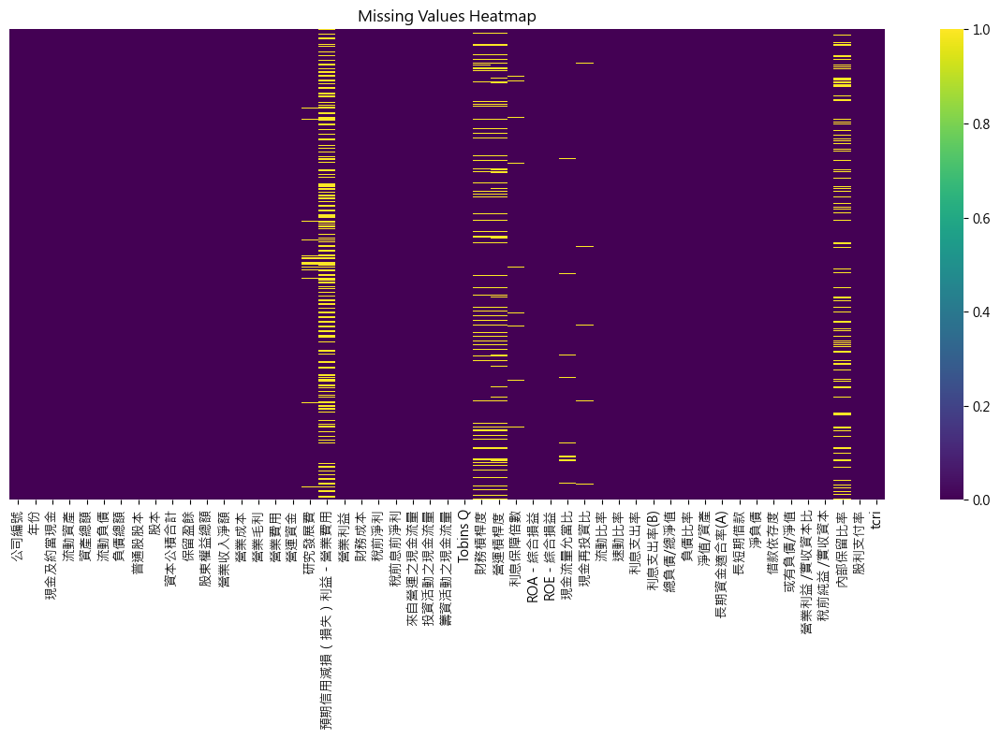

In [180]:
import seaborn as sns
import matplotlib
matplotlib.rc('font', family='Microsoft JhengHei')
# Missing values analysis
print("=== Missing Values Analysis ===")
missing_data = merged_data_final.isnull().sum()
missing_percentage = (merged_data_final.isnull().sum() / len(merged_data)) * 100

missing_df = pd.DataFrame({
    'Variable': missing_data.index,
    'Missing Count': missing_data.values,
    'Missing Percentage': missing_percentage.values
})

# show missing values
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values('Missing Count', ascending=False)
print(missing_df.to_string(index=False))

# Target variable missing values
target_missing = merged_data_final['tcri'].isnull().sum()
print(f"\nTarget variable (tcri) missing: {target_missing} ({target_missing/len(merged_data)*100:.2f}%)")

# Visualize missing values
plt.figure(figsize=(12, 8))
sns.heatmap(merged_data_final.isnull(), cbar=True, yticklabels=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.tight_layout()
plt.savefig('missing_heat.png', transparent=True, bbox_inches='tight', dpi=300)
plt.show()

=== 缺失值表格 - 兩欄布局（按缺失值排序） ===


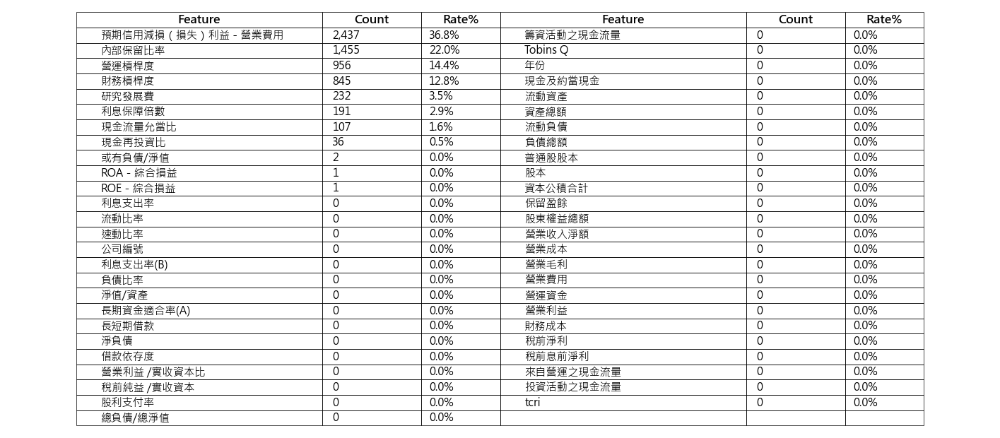

排序版缺失值表格已保存為 'missing_values_sorted_two_columns.png'


In [178]:
# 缺失值表格 - 兩欄布局，按缺失值從大到小排序
print("=== 缺失值表格 - 兩欄布局（按缺失值排序） ===")

# 計算缺失值統計
missing_count = merged_data_final.isnull().sum()
missing_percentage = (merged_data_final.isnull().sum() / len(merged_data_final)) * 100

# 創建缺失值表格並按缺失值數量排序
missing_df = pd.DataFrame({
    'Feature': merged_data_final.columns,
    'Missing_Count': missing_count,
    'Missing_Rate (%)': missing_percentage
})

# 按缺失值數量從大到小排序
missing_df_sorted = missing_df.sort_values('Missing_Count', ascending=False)

# 將特徵分成兩欄
total_features = len(missing_df_sorted)
split_index = (total_features + 1) // 2

# 左欄特徵（前一半）
left_features = missing_df_sorted.iloc[:split_index].copy()
# 右欄特徵（後一半）
right_features = missing_df_sorted.iloc[split_index:].copy()

# 確保兩欄長度一致
max_length = max(len(left_features), len(right_features))
while len(left_features) < max_length:
    left_features = pd.concat([left_features, pd.DataFrame([{'Feature': '', 'Missing_Count': '', 'Missing_Rate (%)': ''}])], ignore_index=True)
while len(right_features) < max_length:
    right_features = pd.concat([right_features, pd.DataFrame([{'Feature': '', 'Missing_Count': '', 'Missing_Rate (%)': ''}])], ignore_index=True)

# 創建合併的表格數據
cell_text = []
for i in range(max_length):
    left_row = left_features.iloc[i]
    right_row = right_features.iloc[i]
    cell_text.append([
        left_row['Feature'],
        f"{left_row['Missing_Count']:,}" if left_row['Missing_Count'] != '' else '',
        f"{left_row['Missing_Rate (%)']:.1f}%" if left_row['Missing_Rate (%)'] != '' else '',
        right_row['Feature'],
        f"{right_row['Missing_Count']:,}" if right_row['Missing_Count'] != '' else '',
        f"{right_row['Missing_Rate (%)']:.1f}%" if right_row['Missing_Rate (%)'] != '' else ''
    ])

# 設定圖表大小
plt.figure(figsize=(18, max(6, max_length * 0.3)))

# 創建兩欄表格 - 加上邊線
table = plt.table(cellText=cell_text,
                 colLabels=['Feature', 'Count', 'Rate%', 'Feature', 'Count', 'Rate%'],
                 loc='center',
                 cellLoc='left',
                 colWidths=[0.25, 0.1, 0.08, 0.25, 0.1, 0.08],
                 edges='closed')

# 設定表格樣式
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 1.3)

# 設定邊線和透明背景
for key, cell in table.get_celld().items():
    cell.set_facecolor('none')
    cell.set_edgecolor('black')
    cell.set_linewidth(0.5)
    if key[0] == 0:  # 標題行
        cell.set_text_props(weight='bold', size=12)
    else:
        cell.set_text_props(size=11)

plt.axis('off')
fig = plt.gcf()
fig.patch.set_alpha(0.0)
ax = plt.gca()
ax.set_facecolor('none')

# 保存去背圖片
plt.savefig('missing_values_sorted_two_columns.png', 
            transparent=True, 
            bbox_inches='tight', 
            dpi=300, 
            pad_inches=0.1,
            facecolor='none',
            edgecolor='none')

plt.show()
print("排序版缺失值表格已保存為 'missing_values_sorted_two_columns.png'")

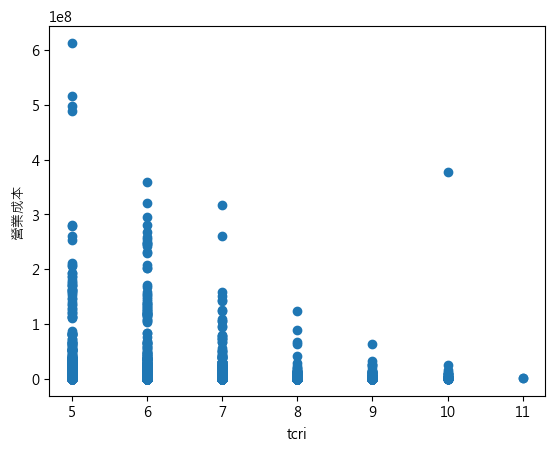

In [135]:
x = merged_data_final['tcri']
y = merged_data_final['營業成本']
plt.scatter(x, y)       
plt.xlabel('tcri')
plt.ylabel('營業成本')
plt.savefig('=test.png', transparent=True, bbox_inches='tight', dpi=300)
plt.show()

In [146]:
merged_data_final2 = merged_data_final.dropna(subset=['tcri'])
merged_data_final2

<Figure size 640x480 with 0 Axes>

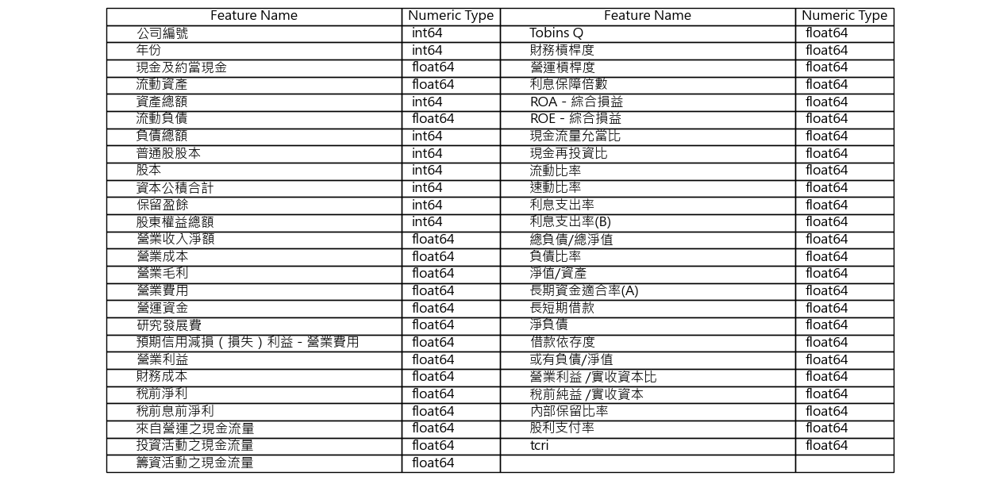

In [179]:
# 按照原始特徵順序排列，分成兩欄顯示（確保去背）
dtype_df = pd.DataFrame({
    'Feature': merged_data_final.columns,
    'Data_Type': merged_data_final.dtypes.astype(str)
})

# 提取主要的數值種類
def extract_numeric_type(dtype_str):
    if 'float' in dtype_str:
        return 'float64'
    elif 'int' in dtype_str:
        return 'int64'
    elif 'object' in dtype_str:
        return 'object'
    elif 'bool' in dtype_str:
        return 'bool'
    else:
        return dtype_str

dtype_df['Numeric_Type'] = dtype_df['Data_Type'].apply(extract_numeric_type)

# 將特徵分成兩欄
total_features = len(dtype_df)
split_index = (total_features + 1) // 2

# 左欄特徵
left_features = dtype_df.iloc[:split_index].copy()
# 右欄特徵
right_features = dtype_df.iloc[split_index:].copy()

# 確保兩欄長度一致
max_length = max(len(left_features), len(right_features))
while len(left_features) < max_length:
    left_features = pd.concat([left_features, pd.DataFrame([{'Feature': '', 'Numeric_Type': ''}])], ignore_index=True)
while len(right_features) < max_length:
    right_features = pd.concat([right_features, pd.DataFrame([{'Feature': '', 'Numeric_Type': ''}])], ignore_index=True)

# 創建合併的表格數據
cell_text = []
for i in range(max_length):
    left_row = left_features.iloc[i]
    right_row = right_features.iloc[i]
    cell_text.append([
        left_row['Feature'],
        left_row['Numeric_Type'],
        right_row['Feature'], 
        right_row['Numeric_Type']
    ])

# 設定圖表大小
plt.figure(figsize=(16, max(6, max_length * 0.25)))

# 創建兩欄表格
table = plt.table(cellText=cell_text,
                 colLabels=['Feature Name', 'Numeric Type', 'Feature Name', 'Numeric Type'],
                 loc='center',
                 cellLoc='left',
                 colWidths=[0.3, 0.1, 0.3, 0.1]
                 )

# 設定表格樣式
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 1.3)

# 設定欄位顏色 - 使用透明或淺色
for i in range(4):
    if i < 2:
        table[(0, i)].set_facecolor('none')  # 左欄標題
    else:
        table[(0, i)].set_facecolor('none')  # 右欄標題

# 關鍵：完全移除背景
plt.axis('off')

# 設定完全透明的背景
fig = plt.gcf()
fig.patch.set_alpha(0.0)  # 圖形背景完全透明
ax = plt.gca()
ax.set_facecolor('none')   # 座標軸區域完全透明

# 設定表格單元格背景為透明（可選）
for key, cell in table.get_celld().items():
    if key[0] > 0:  # 除了標題行的所有單元格
        cell.set_facecolor('none')

# 保存去背圖片 - 確保使用正確的透明設定
plt.savefig('feature_data_types.png', 
            transparent=True, 
            bbox_inches='tight', 
            dpi=300, 
            pad_inches=0.1,
            facecolor='none',   # 確保保存時背景透明
            edgecolor='none')   # 確保邊緣透明

### 移除特殊字

In [142]:
def clean_numeric(value):
    if pd.isna(value) or value == '--':
        return np.nan
    if isinstance(value, str):
        value = value.replace(',', '').replace(' ', '')
        try:
            return float(value)
        except:
            return np.nan
    return value

numeric_columns = merged_data_final.select_dtypes(include=[object]).columns
for col in numeric_columns:
    merged_data_final[col] = merged_data_final[col].apply(clean_numeric)

merged_data_final.shape

(6624, 51)

### 計算相關性

In [143]:
correlation_matrix = merged_data_final.select_dtypes(include=[np.number]).corr()

high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = abs(correlation_matrix.iloc[i, j])
        if corr_value > 0.5:  # cor
            high_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                corr_value
            ))

high_corr_pairs.sort(key=lambda x: x[2], reverse=True)

for pair in high_corr_pairs[:30]:  # show 30
    print(f"{pair[0]} vs {pair[1]}: {pair[2]:.3f}")

負債比率 vs 淨值/資產: 1.000
普通股股本 vs 股本: 0.998
內部保留比率 vs 股利支付率: 0.997
稅前淨利 vs 稅前息前淨利: 0.996
營業收入淨額 vs 營業成本: 0.988
資產總額 vs 負債總額: 0.973
營業利益 vs 稅前息前淨利: 0.948
總負債/總淨值 vs 借款依存度: 0.945
營業利益 vs 稅前淨利: 0.945
流動資產 vs 流動負債: 0.941
營業毛利 vs 營業利益: 0.911
營業毛利 vs 稅前息前淨利: 0.898
長短期借款 vs 淨負債: 0.891
財務成本 vs 長短期借款: 0.886
營業毛利 vs 稅前淨利: 0.878
ROA－綜合損益 vs ROE－綜合損益: 0.877
營業利益 /實收資本比 vs 稅前純益 /實收資本: 0.876
普通股股本 vs 股東權益總額: 0.873
股本 vs 股東權益總額: 0.867
營業毛利 vs 來自營運之現金流量: 0.842
營業收入淨額 vs 營業費用: 0.822
資本公積合計 vs 股東權益總額: 0.816
營業費用 vs 研究發展費: 0.811
營業成本 vs 營業費用: 0.801
保留盈餘 vs 股東權益總額: 0.787
現金及約當現金 vs 股東權益總額: 0.784
營業利益 vs 來自營運之現金流量: 0.781
現金及約當現金 vs 營業收入淨額: 0.764
現金及約當現金 vs 資產總額: 0.759
資本公積合計 vs 研究發展費: 0.759


### 熱力圖

C:\Users\jack9\python\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\3504265363.py:13: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.savefig('merged_heat.png', transparent=True, bbox_inches='tight', dpi=300)
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


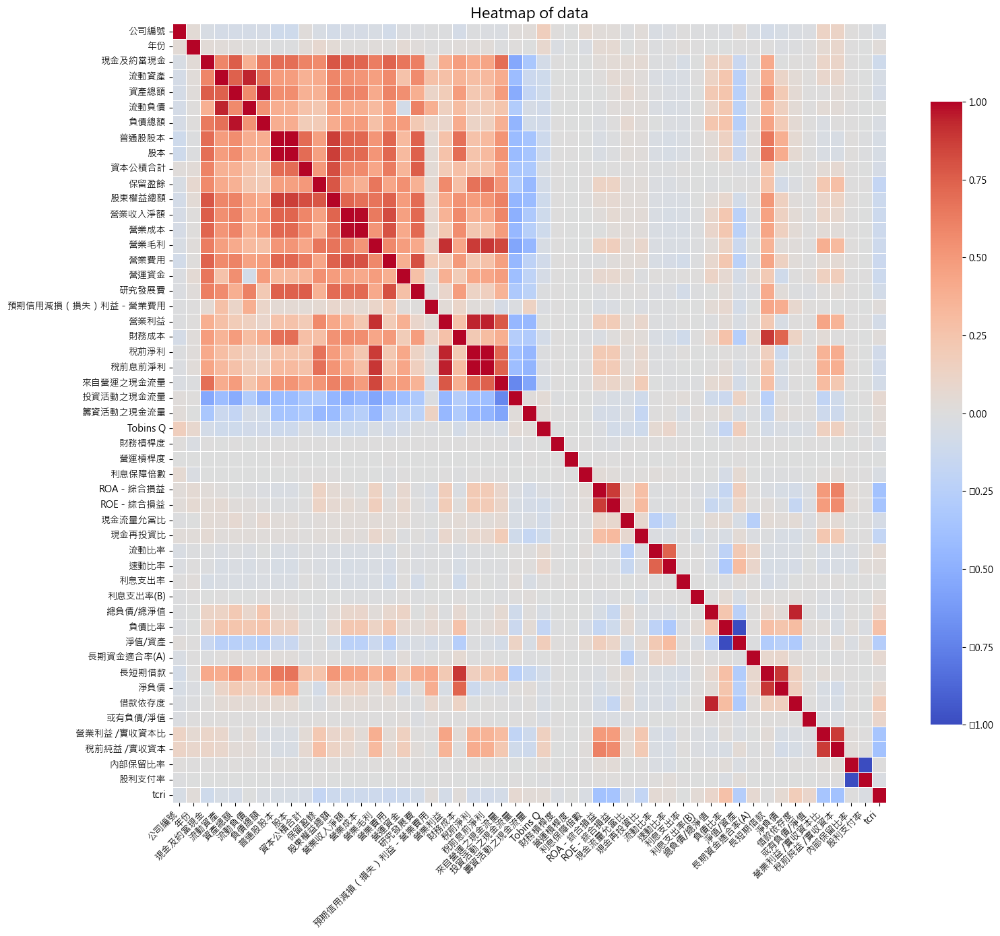

In [181]:
import seaborn as sns
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, 
           annot=False, 
           cmap='coolwarm', 
           center=0,
           linewidths=0.5,
           cbar_kws={"shrink": 0.8})
plt.title('Heatmap of data', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('merged_heat.png', transparent=True, bbox_inches='tight', dpi=300)
plt.show()

### 相關性 絕對值

In [56]:
feature_importance = correlation_matrix.abs().mean().sort_values(ascending=False)

for i, (feature, score) in enumerate(feature_importance.items()):
    print(f"{i+1:2d}. {feature}: {score:.3f}")

 1. 股東權益總額: 0.325
 2. 營業收入淨額: 0.316
 3. 現金及約當現金: 0.315
 4. 營業毛利: 0.311
 5. 普通股股本: 0.301
 6. 股本: 0.301
 7. 營業費用: 0.298
 8. 來自營運之現金流量: 0.291
 9. 營業成本: 0.290
10. 資產總額: 0.287
11. 流動資產: 0.272
12. 財務成本: 0.263
13. 保留盈餘: 0.259
14. 長短期借款: 0.258
15. 稅前息前淨利: 0.249
16. 研究發展費: 0.238
17. 負債總額: 0.237
18. 稅前淨利: 0.234
19. 投資活動之現金流量: 0.229
20. 營業利益: 0.229
21. 資本公積合計: 0.225
22. 營運資金: 0.225
23. 流動負債: 0.214
24. 總負債/總淨值: 0.176
25. 負債比率: 0.168
26. 淨值/資產: 0.168
27. 籌資活動之現金流量: 0.167
28. 稅前純益 /實收資本: 0.152
29. 營業利益 /實收資本比: 0.150
30. 借款依存度: 0.149
31. 淨負債: 0.143
32. ROA－綜合損益: 0.120
33. tcri: 0.120
34. ROE－綜合損益: 0.120
35. Tobins Q: 0.088
36. 預期信用減損（損失）利益－營業費用: 0.087
37. 速動比率: 0.080
38. 現金再投資比: 0.076
39. 流動比率: 0.070
40. 公司編號: 0.064
41. 現金流量允當比: 0.061
42. 內部保留比率: 0.049
43. 股利支付率: 0.045
44. 長期資金適合率(A): 0.044
45. 年份: 0.042
46. 利息支出率: 0.039
47. 或有負債/淨值: 0.032
48. 利息支出率(B): 0.031
49. 利息保障倍數: 0.031
50. 財務槓桿度: 0.023
51. 營運槓桿度: 0.022


<Figure size 1600x1600 with 0 Axes>

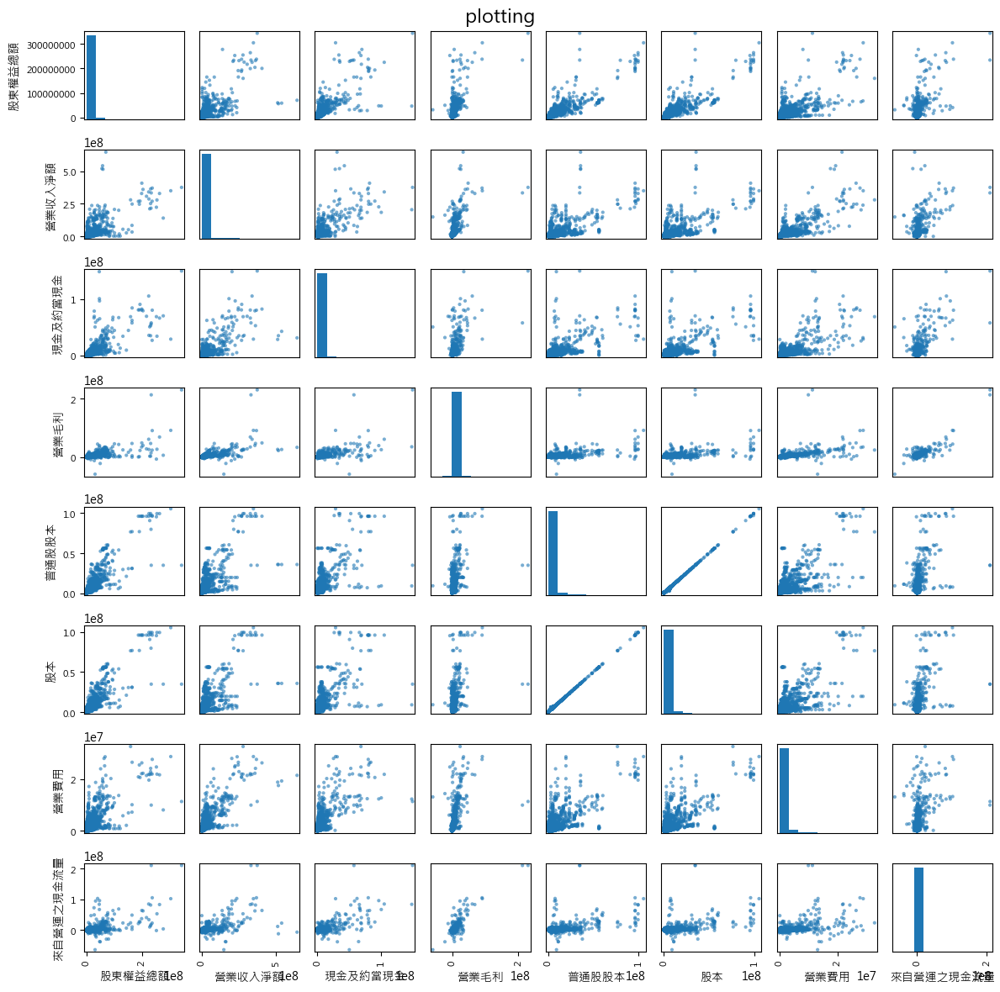

In [57]:
top_features = feature_importance.head(8).index.tolist()
if len(top_features) >= 3:
    from pandas.plotting import scatter_matrix
    
    plt.figure(figsize=(16, 16))
    scatter_matrix(merged_data_final[top_features], 
                  alpha=0.6, 
                  figsize=(12, 12), 
                  diagonal='hist')
    plt.suptitle('plotting', fontsize=16)
    plt.tight_layout()
    plt.show()

普通股股本 vs 股本: 1.000
稅前淨利 vs 稅前息前淨利: 0.996
營業收入淨額 vs 營業成本: 0.987
資產總額 vs 負債總額: 0.973
營業利益 vs 稅前息前淨利: 0.947
營業利益 vs 稅前淨利: 0.945
流動資產 vs 流動負債: 0.941
營業毛利 vs 營業利益: 0.911
營業毛利 vs 稅前息前淨利: 0.898
ROA－綜合損益 vs ROE－綜合損益: 0.894
長短期借款 vs 淨負債: 0.881
營業毛利 vs 稅前淨利: 0.878
財務成本 vs 長短期借款: 0.876
營業利益 /實收資本比 vs 稅前純益 /實收資本: 0.875
普通股股本 vs 股東權益總額: 0.872
股本 vs 股東權益總額: 0.872
營業毛利 vs 來自營運之現金流量: 0.842
營業收入淨額 vs 營業費用: 0.820
資本公積合計 vs 股東權益總額: 0.812
營業費用 vs 研究發展費: 0.808
營業成本 vs 營業費用: 0.798
保留盈餘 vs 股東權益總額: 0.796
營業利益 vs 來自營運之現金流量: 0.783
現金及約當現金 vs 股東權益總額: 0.780
現金及約當現金 vs 資產總額: 0.760
現金及約當現金 vs 營業收入淨額: 0.759
資本公積合計 vs 研究發展費: 0.751
稅前息前淨利 vs 來自營運之現金流量: 0.745
流動資產 vs 資產總額: 0.744
股東權益總額 vs 營業費用: 0.739


C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\3376977765.py:31: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


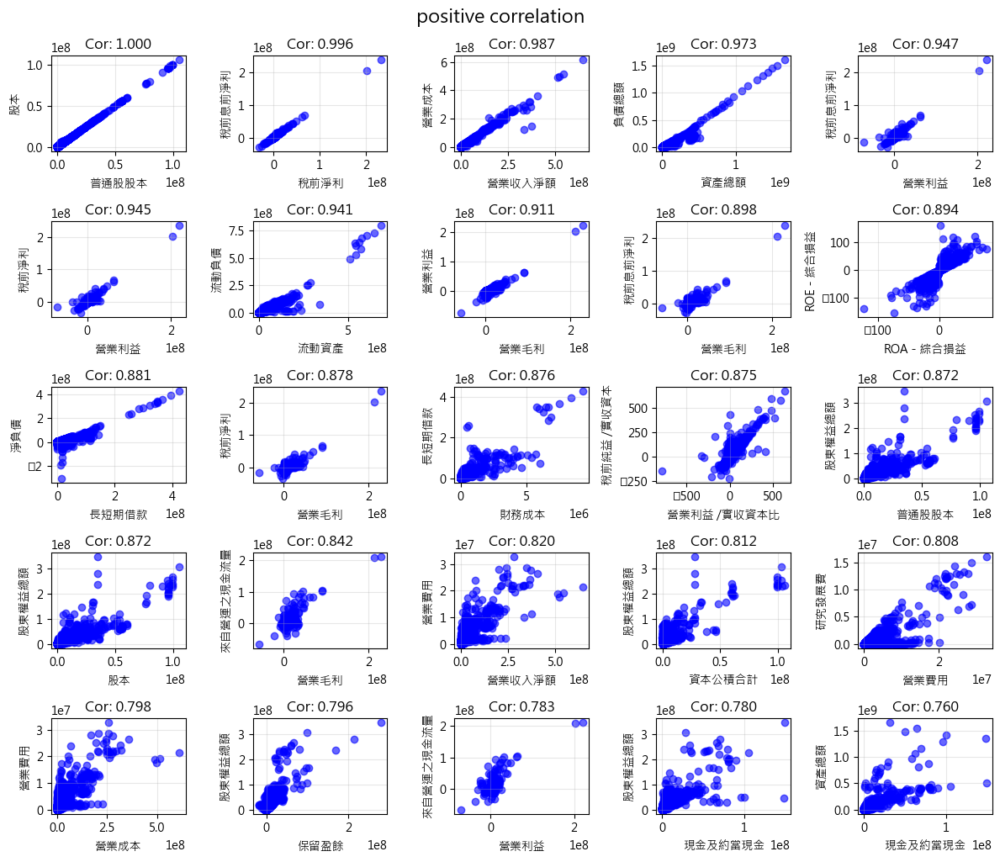

In [58]:
positive_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if corr_value > 0.3:  # cor>0.5
            positive_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                corr_value
            ))

positive_corr_pairs.sort(key=lambda x: x[2], reverse=True)# 從最高到最低

for pair in positive_corr_pairs[:30]:  # show 30
    print(f"{pair[0]} vs {pair[1]}: {pair[2]:.3f}")

if positive_corr_pairs:
    top_positive_pairs = positive_corr_pairs[:25]
    
    fig, axes = plt.subplots(5, 5, figsize=(12, 10))
    axes = axes.ravel()
    
    for idx, (feature1, feature2, corr_value) in enumerate(top_positive_pairs):
        if idx < 25:  # 25
            axes[idx].scatter(merged_data_final[feature1], merged_data_final[feature2], alpha=0.6, color='blue')
            axes[idx].set_xlabel(feature1)
            axes[idx].set_ylabel(feature2)
            axes[idx].set_title(f'Cor: {corr_value:.3f}')
            axes[idx].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle('positive correlation', fontsize=16, y=1.02)
    plt.show()

正相關特徵對 (相關係數 > 0.3):
普通股股本 vs 股本: 0.998
稅前淨利 vs 稅前息前淨利: 0.996
營業收入淨額 vs 營業成本: 0.988
資產總額 vs 負債總額: 0.973
營業利益 vs 稅前息前淨利: 0.948
總負債/總淨值 vs 借款依存度: 0.945
營業利益 vs 稅前淨利: 0.945
流動資產 vs 流動負債: 0.941
營業毛利 vs 營業利益: 0.911
營業毛利 vs 稅前息前淨利: 0.898
長短期借款 vs 淨負債: 0.891
財務成本 vs 長短期借款: 0.886
營業毛利 vs 稅前淨利: 0.878
ROA－綜合損益 vs ROE－綜合損益: 0.877
營業利益 /實收資本比 vs 稅前純益 /實收資本: 0.876
普通股股本 vs 股東權益總額: 0.873
股本 vs 股東權益總額: 0.867
營業毛利 vs 來自營運之現金流量: 0.842
營業收入淨額 vs 營業費用: 0.822
資本公積合計 vs 股東權益總額: 0.816
營業費用 vs 研究發展費: 0.811
營業成本 vs 營業費用: 0.801
保留盈餘 vs 股東權益總額: 0.787
現金及約當現金 vs 股東權益總額: 0.784
營業利益 vs 來自營運之現金流量: 0.781
現金及約當現金 vs 營業收入淨額: 0.764
現金及約當現金 vs 資產總額: 0.759
資本公積合計 vs 研究發展費: 0.759
流動資產 vs 資產總額: 0.745
股本 vs 研究發展費: 0.744


ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 6624 and the array at index 1 has size 6392

C:\Users\jack9\python\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


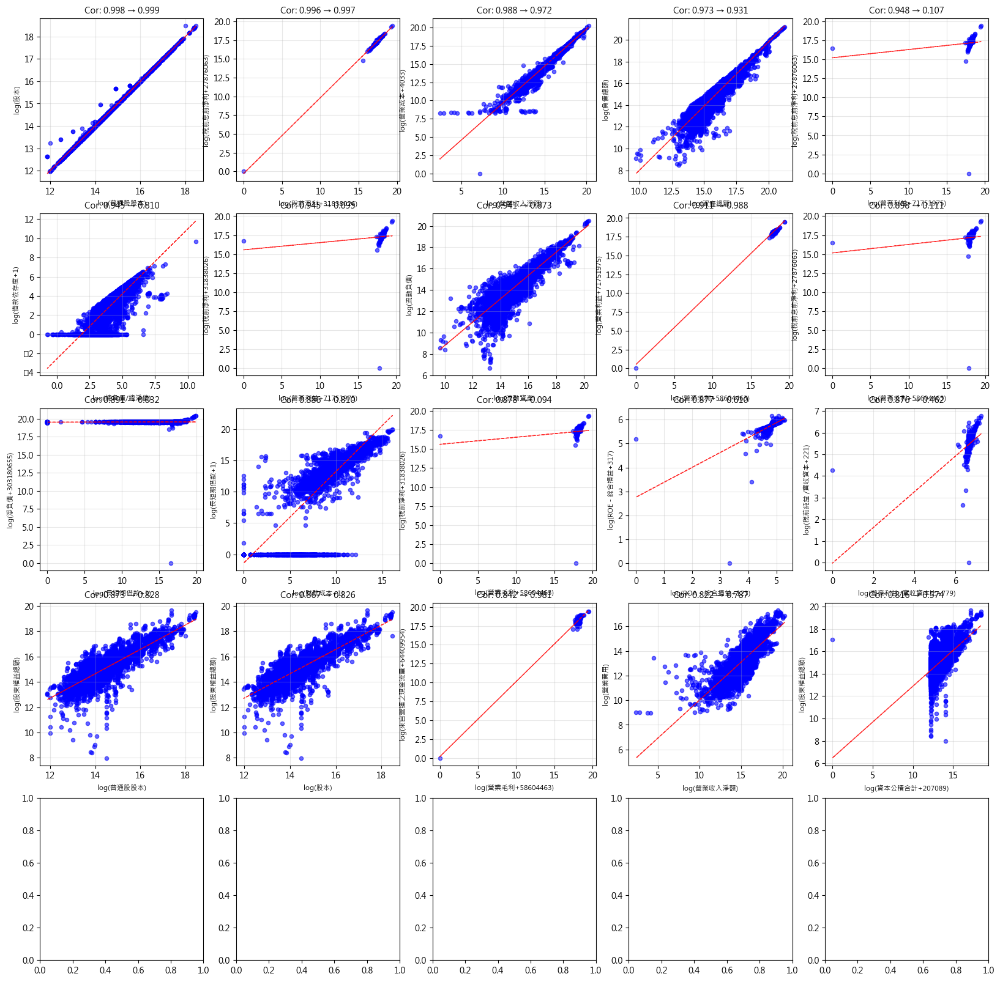

In [182]:
# 對數轉換後繪製正相關散點圖
positive_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if corr_value > 0.3:  # cor>0.3
            positive_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                corr_value
            ))

positive_corr_pairs.sort(key=lambda x: x[2], reverse=True)  # 從最高到最低

print("正相關特徵對 (相關係數 > 0.3):")
for pair in positive_corr_pairs[:30]:  # show 30
    print(f"{pair[0]} vs {pair[1]}: {pair[2]:.3f}")

if positive_corr_pairs:
    top_positive_pairs = positive_corr_pairs[:25]
    
    fig, axes = plt.subplots(5, 5, figsize=(20, 20))
    axes = axes.ravel()
    
    for idx, (feature1, feature2, corr_value) in enumerate(top_positive_pairs):
        if idx < 25:  # 25個子圖
            # 對兩個特徵都進行對數轉換
            data1 = merged_data_final[feature1].dropna()
            data2 = merged_data_final[feature2].dropna()
            
            # 對特徵1進行對數轉換
            if data1.min() > 0:
                log_data1 = np.log(data1)
                xlabel = f'log({feature1})'
            else:
                shift1 = abs(data1.min()) + 1
                log_data1 = np.log(data1 + shift1)
                xlabel = f'log({feature1}+{shift1:.0f})'
            
            # 對特徵2進行對數轉換
            if data2.min() > 0:
                log_data2 = np.log(data2)
                ylabel = f'log({feature2})'
            else:
                shift2 = abs(data2.min()) + 1
                log_data2 = np.log(data2 + shift2)
                ylabel = f'log({feature2}+{shift2:.0f})'
            
            # 計算對數轉換後的相關係數
            log_corr = np.corrcoef(log_data1, log_data2)[0,1]
            
            # 繪製散點圖
            axes[idx].scatter(log_data1, log_data2, alpha=0.6, color='blue', s=20)
            axes[idx].set_xlabel(xlabel, fontsize=8)
            axes[idx].set_ylabel(ylabel, fontsize=8)
            axes[idx].set_title(f'Cor: {corr_value:.3f} → {log_corr:.3f}', fontsize=10)
            axes[idx].grid(True, alpha=0.3)
            
            # 添加趨勢線
            try:
                z = np.polyfit(log_data1, log_data2, 1)
                p = np.poly1d(z)
                axes[idx].plot(log_data1, p(log_data1), "r--", alpha=0.8, linewidth=1)
            except:
                pass
    
    # 隱藏多餘的子圖
    for idx in range(len(top_positive_pairs), 25):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    plt.suptitle('Positive Correlation Pairs (After Log Transformation)', fontsize=16, y=1.02)
    plt.show()

=== 所有數值特徵箱形圖 ===


C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\1853873510.py:46: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


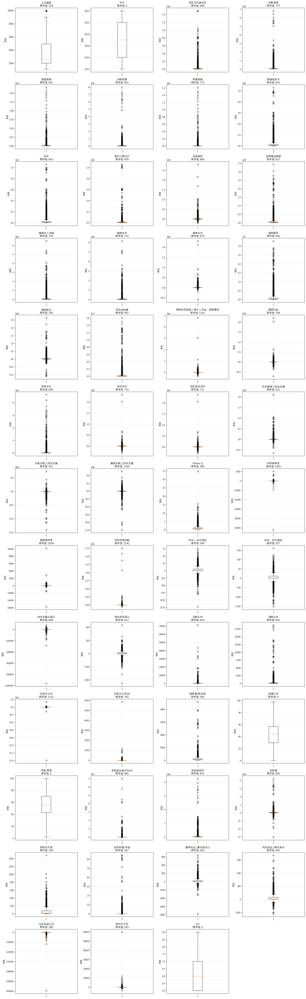

總共繪製了 51 個數值特徵的箱形圖


In [63]:
# 繪製所有數值特徵的箱形圖
print("=== 所有數值特徵箱形圖 ===")

# 獲取所有數值特徵
numeric_columns = merged_data_final.select_dtypes(include=[np.number]).columns.tolist()

# 設定子圖布局
n_cols = 4
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

# 創建圖表
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))

# 如果只有一行，確保axes是列表形式
if n_rows == 1:
    axes = [axes] if n_cols == 1 else axes

# 扁平化axes陣列以便迭代
axes_flat = axes.flatten() if n_rows > 1 else axes

for i, col in enumerate(numeric_columns):
    if i < len(axes_flat):
        # 繪製箱形圖
        data = merged_data_final[col].dropna()
        
        # 計算異常值數量
        Q1 = data.quantile(0.25)
        Q3 = data.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outlier_count = ((data < lower_bound) | (data > upper_bound)).sum()
        
        # 繪製箱形圖
        axes_flat[i].boxplot(data)
        axes_flat[i].set_title(f'{col}\n異常值: {outlier_count}')
        axes_flat[i].set_ylabel('數值')
        
        # 添加網格
        axes_flat[i].grid(True, alpha=0.3)

# 隱藏多餘的子圖
for i in range(len(numeric_columns), len(axes_flat)):
    axes_flat[i].set_visible(False)

plt.tight_layout()
plt.show()

print(f"總共繪製了 {len(numeric_columns)} 個數值特徵的箱形圖")

=== 所有特徵對數轉換後的分組箱形圖 ===
總特徵數量: 50

繪製第 1 批特徵 (20 個)...


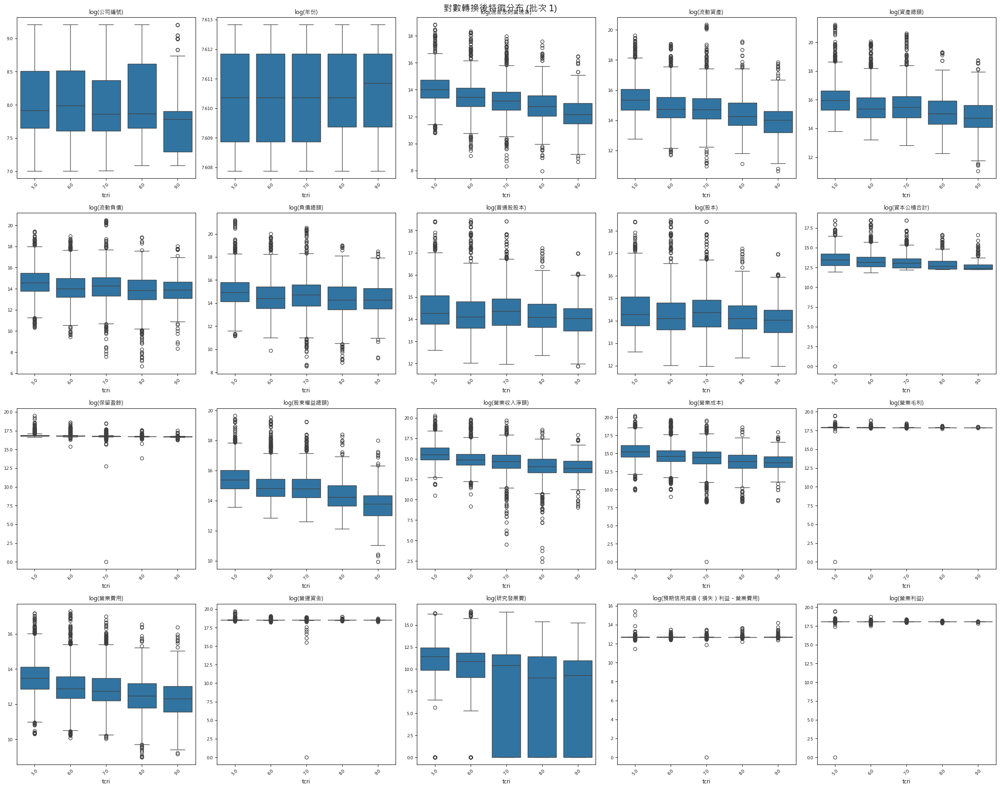


繪製第 2 批特徵 (20 個)...


C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\1588563379.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


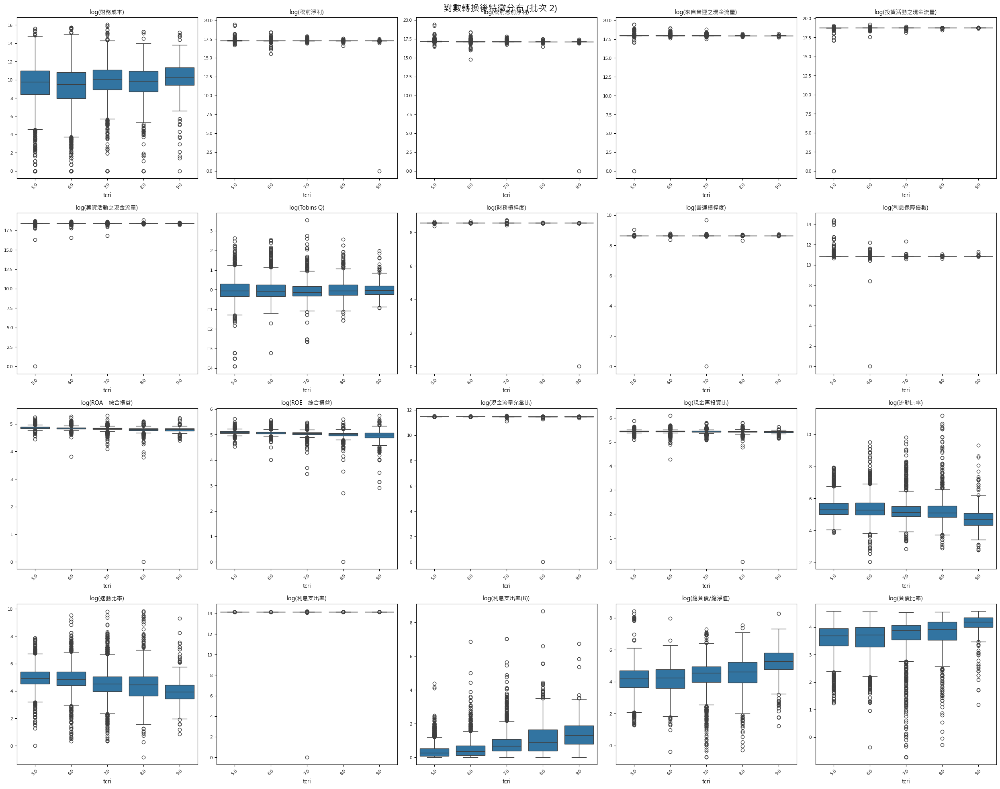


繪製第 3 批特徵 (10 個)...


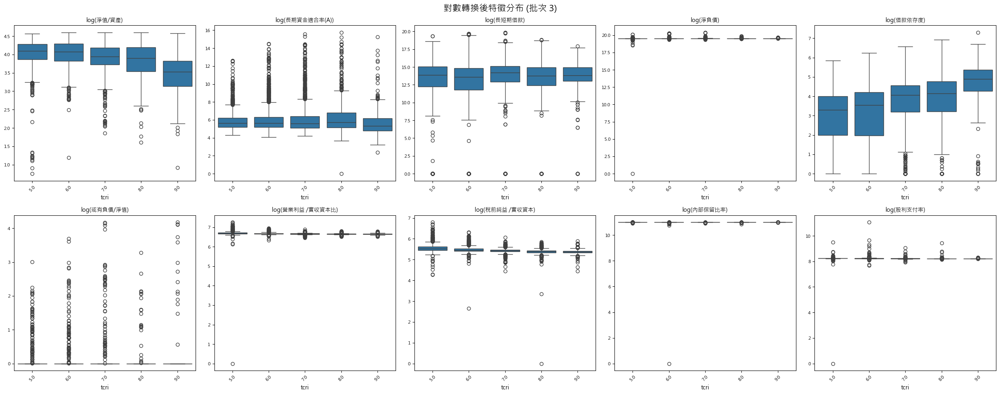

In [67]:
# 對所有50個特徵取log後畫圖
print("=== 所有特徵對數轉換後的分組箱形圖 ===")

if 'tcri' in merged_data_final.columns:
    # 獲取所有數值特徵（排除tcri）
    numeric_columns = [col for col in merged_data_final.select_dtypes(include=[np.number]).columns.tolist() if col != 'tcri']
    
    print(f"總特徵數量: {len(numeric_columns)}")
    
    # 創建對數轉換後的數據
    log_data = merged_data_final[numeric_columns + ['tcri']].copy()
    
    # 對每個特徵應用適當的對數轉換
    for col in numeric_columns:
        data = log_data[col].dropna()
        if len(data) > 0:
            min_val = data.min()
            if min_val > 0:
                # 所有值為正，直接取log
                log_data[f'log_{col}'] = np.log(data)
            elif min_val == 0:
                # 包含0，使用log(1+x)
                log_data[f'log_{col}'] = np.log1p(data)
            else:
                # 包含負值，平移後取log
                shift = abs(min_val) + 1
                log_data[f'log_{col}'] = np.log(data + shift)
        else:
            log_data[f'log_{col}'] = np.nan
    
    # 分批次繪製所有特徵
    log_columns = [f'log_{col}' for col in numeric_columns]
    batch_size = 20  # 每批顯示20個特徵
    
    for batch_num in range(0, len(log_columns), batch_size):
        batch_features = log_columns[batch_num:batch_num + batch_size]
        original_names = numeric_columns[batch_num:batch_num + batch_size]
        
        print(f"\n繪製第 {batch_num//batch_size + 1} 批特徵 ({len(batch_features)} 個)...")
        
        n_cols = 5
        n_rows = (len(batch_features) + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5*n_rows))
        axes_flat = axes.flatten() if n_rows > 1 else axes
        
        for i, (log_col, orig_col) in enumerate(zip(batch_features, original_names)):
            if i < len(axes_flat):
                sns.boxplot(data=log_data, x='tcri', y=log_col, ax=axes_flat[i])
                axes_flat[i].set_title(f'log({orig_col})', fontsize=10)
                axes_flat[i].set_xlabel('tcri')
                axes_flat[i].set_ylabel('')
                axes_flat[i].tick_params(axis='x', rotation=45)
                axes_flat[i].tick_params(axis='both', labelsize=8)
        
        # 隱藏多餘的子圖
        for i in range(len(batch_features), len(axes_flat)):
            axes_flat[i].set_visible(False)
        
        plt.suptitle(f'對數轉換後特徵分布 (批次 {batch_num//batch_size + 1})', fontsize=16)
        plt.tight_layout()
        plt.show()

=== 所有數值特徵直方圖 ===
總特徵數量: 51

繪製第 1 批特徵 (20 個)...


C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\865233298.py:53: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


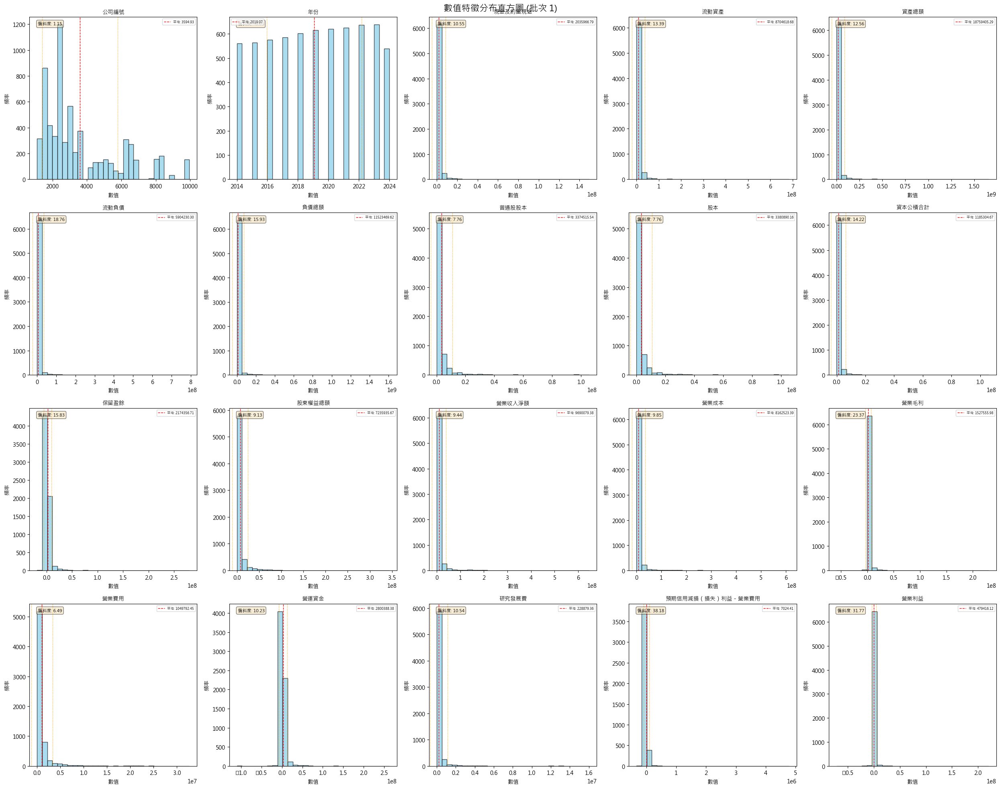


繪製第 2 批特徵 (20 個)...


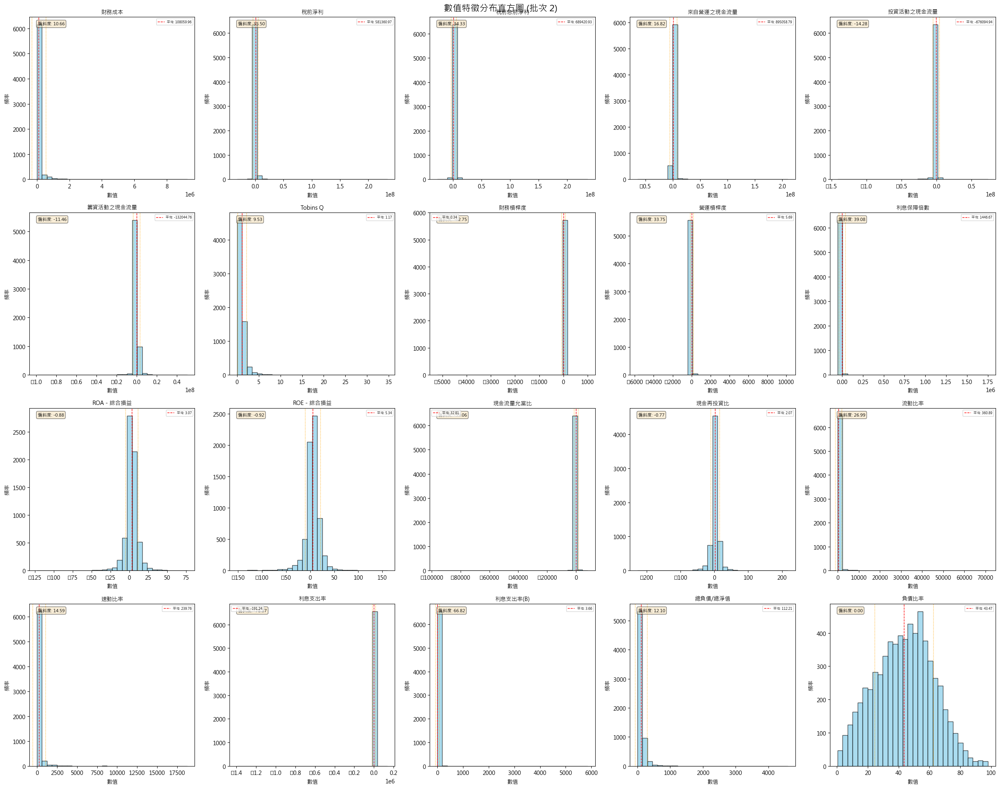


繪製第 3 批特徵 (11 個)...


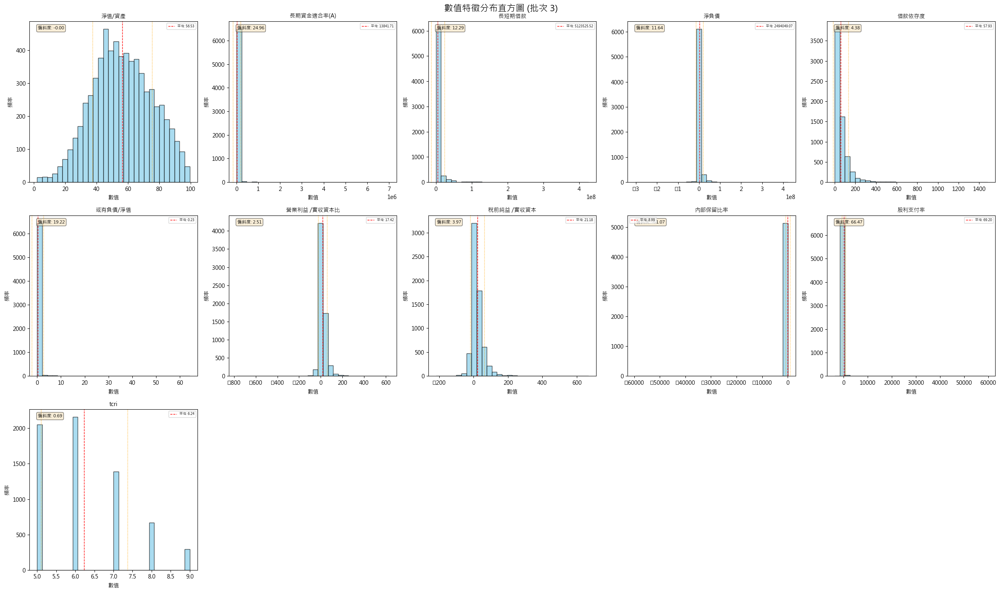

In [68]:
# 繪製所有數值特徵的直方圖
print("=== 所有數值特徵直方圖 ===")

# 獲取所有數值特徵
numeric_columns = merged_data_final.select_dtypes(include=[np.number]).columns.tolist()

print(f"總特徵數量: {len(numeric_columns)}")

# 分批次繪製所有特徵
batch_size = 20  # 每批顯示20個特徵

for batch_num in range(0, len(numeric_columns), batch_size):
    batch_features = numeric_columns[batch_num:batch_num + batch_size]
    
    print(f"\n繪製第 {batch_num//batch_size + 1} 批特徵 ({len(batch_features)} 個)...")
    
    n_cols = 5
    n_rows = (len(batch_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5*n_rows))
    axes_flat = axes.flatten() if n_rows > 1 else axes
    
    for i, col in enumerate(batch_features):
        if i < len(axes_flat):
            data = merged_data_final[col].dropna()
            
            if len(data) > 0:
                # 繪製直方圖
                axes_flat[i].hist(data, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
                axes_flat[i].set_title(f'{col}', fontsize=10)
                axes_flat[i].set_xlabel('數值')
                axes_flat[i].set_ylabel('頻率')
                
                # 添加統計資訊
                mean_val = data.mean()
                std_val = data.std()
                skew_val = data.skew()
                
                axes_flat[i].axvline(mean_val, color='red', linestyle='--', linewidth=1, label=f'平均: {mean_val:.2f}')
                axes_flat[i].axvline(mean_val + std_val, color='orange', linestyle=':', linewidth=1)
                axes_flat[i].axvline(mean_val - std_val, color='orange', linestyle=':', linewidth=1)
                
                axes_flat[i].legend(fontsize=6)
                axes_flat[i].text(0.05, 0.95, f'偏斜度: {skew_val:.2f}', 
                                 transform=axes_flat[i].transAxes, fontsize=8,
                                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # 隱藏多餘的子圖
    for i in range(len(batch_features), len(axes_flat)):
        axes_flat[i].set_visible(False)
    
    plt.suptitle(f'數值特徵分布直方圖 (批次 {batch_num//batch_size + 1})', fontsize=16)
    plt.tight_layout()
    plt.show()

=== 所有特徵對數轉換後直方圖 ===
總特徵數量: 51

繪製第 1 批對數轉換特徵 (20 個)...


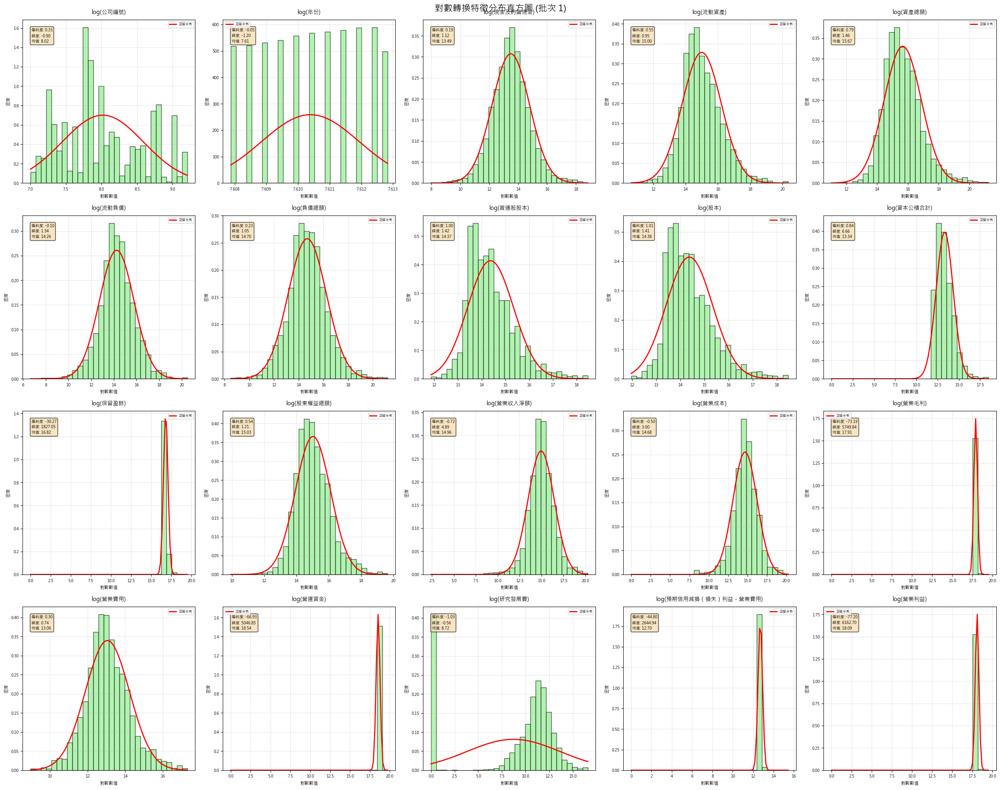


繪製第 2 批對數轉換特徵 (20 個)...


C:\Users\jack9\AppData\Local\Temp\ipykernel_21596\3428357234.py:88: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


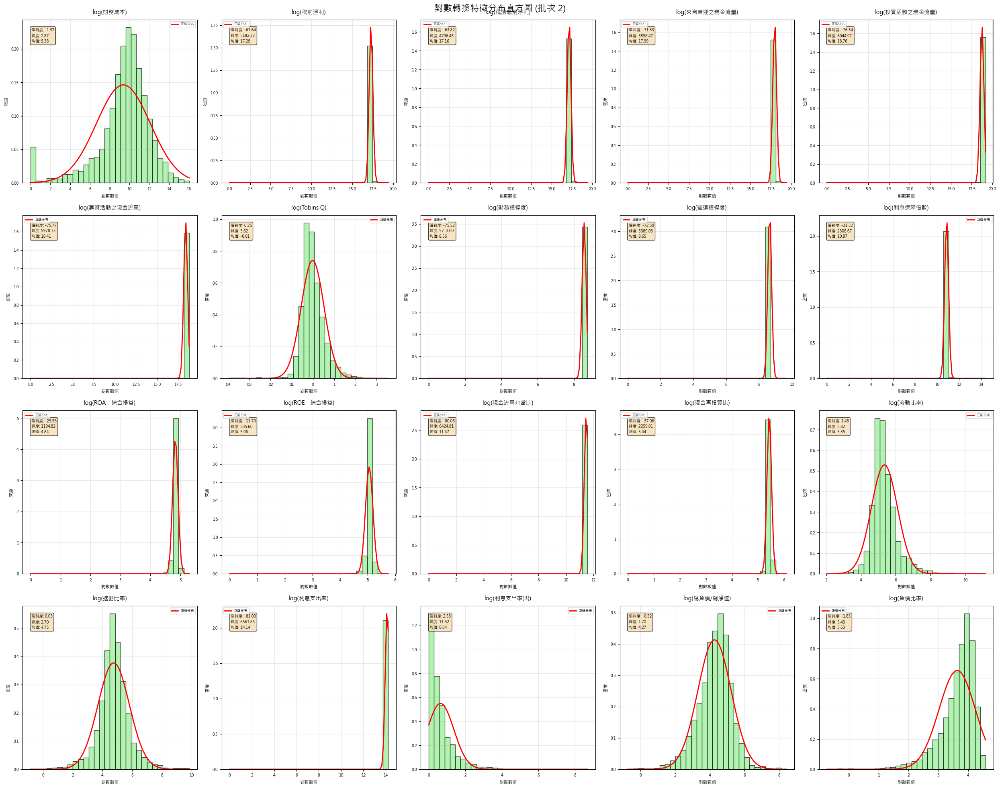


繪製第 3 批對數轉換特徵 (11 個)...


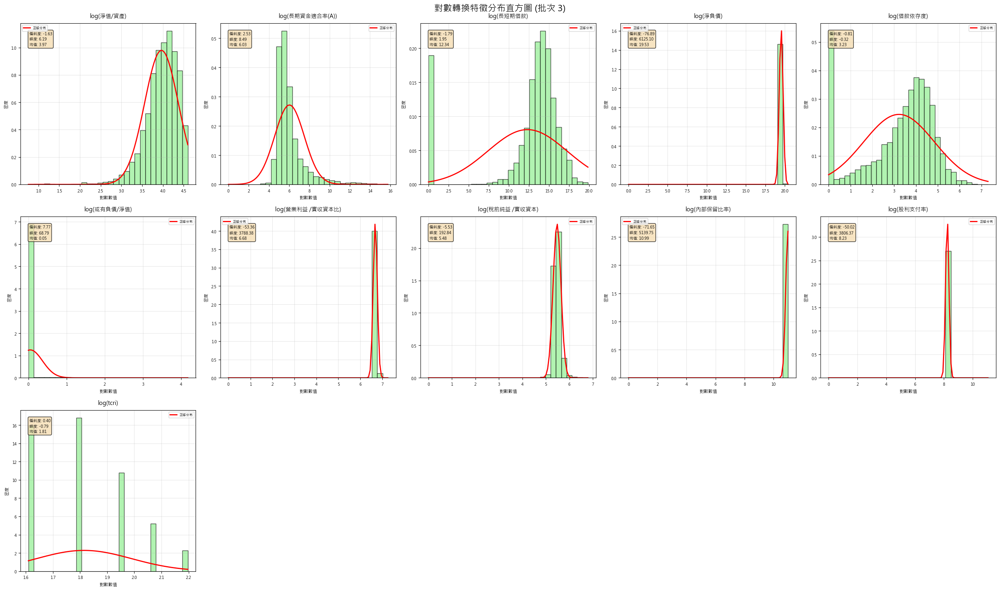

In [70]:
# 所有數據取log後繪製直方圖
print("=== 所有特徵對數轉換後直方圖 ===")

# 獲取所有數值特徵
numeric_columns = merged_data_final.select_dtypes(include=[np.number]).columns.tolist()
print(f"總特徵數量: {len(numeric_columns)}")

# 創建對數轉換數據
log_data = merged_data_final[numeric_columns].copy()

# 應用對數轉換
for col in numeric_columns:
    data = log_data[col].dropna()
    if len(data) > 0:
        min_val = data.min()
        if min_val > 0:
            # 所有值為正，直接取log
            log_data[f'log_{col}'] = np.log(data)
            transform_type = "log(x)"
        elif min_val == 0:
            # 包含0，使用log(1+x)
            log_data[f'log_{col}'] = np.log1p(data)
            transform_type = "log(1+x)"
        else:
            # 包含負值，平移後取log
            shift = abs(min_val) + 1
            log_data[f'log_{col}'] = np.log(data + shift)
            transform_type = f"log(x+{shift:.1f})"
    else:
        log_data[f'log_{col}'] = np.nan
        transform_type = "無數據"

log_columns = [f'log_{col}' for col in numeric_columns]

# 分批次繪製所有對數轉換特徵的直方圖
batch_size = 20  # 每批顯示20個特徵

for batch_num in range(0, len(log_columns), batch_size):
    batch_features = log_columns[batch_num:batch_num + batch_size]
    original_names = numeric_columns[batch_num:batch_num + batch_size]
    
    print(f"\n繪製第 {batch_num//batch_size + 1} 批對數轉換特徵 ({len(batch_features)} 個)...")
    
    n_cols = 5
    n_rows = (len(batch_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5*n_rows))
    axes_flat = axes.flatten() if n_rows > 1 else axes
    
    for i, (log_col, orig_col) in enumerate(zip(batch_features, original_names)):
        if i < len(axes_flat):
            data = log_data[log_col].dropna()
            
            if len(data) > 0:
                # 繪製直方圖
                n, bins, patches = axes_flat[i].hist(data, bins=30, alpha=0.7, color='lightgreen', 
                                                   edgecolor='black', density=True)
                
                # 添加正態分布曲線對比
                from scipy.stats import norm
                mu, sigma = data.mean(), data.std()
                x = np.linspace(data.min(), data.max(), 100)
                y = norm.pdf(x, mu, sigma)
                axes_flat[i].plot(x, y, 'r-', linewidth=2, label='正態分布')
                
                axes_flat[i].set_title(f'log({orig_col})', fontsize=10, pad=10)
                axes_flat[i].set_xlabel('對數數值', fontsize=8)
                axes_flat[i].set_ylabel('密度', fontsize=8)
                
                # 添加統計資訊
                skew_val = data.skew()
                kurt_val = data.kurtosis()
                
                stats_text = f'偏斜度: {skew_val:.2f}\n峰度: {kurt_val:.2f}\n均值: {mu:.2f}'
                axes_flat[i].text(0.05, 0.95, stats_text, transform=axes_flat[i].transAxes, 
                                 fontsize=7, verticalalignment='top',
                                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
                
                axes_flat[i].legend(fontsize=6)
                axes_flat[i].tick_params(axis='both', which='major', labelsize=7)
                axes_flat[i].grid(True, alpha=0.3)
    
    # 隱藏多餘的子圖
    for i in range(len(batch_features), len(axes_flat)):
        axes_flat[i].set_visible(False)
    
    plt.suptitle(f'對數轉換特徵分布直方圖 (批次 {batch_num//batch_size + 1})', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

### Categorical (NOT YET)


3. CATEGORICAL VARIABLES FREQUENCY

公司 Frequency Distribution:
Total unique values: 1030
公司
1101 台泥        11
4106 雃博        11
3669 圓展        11
3673 TPK-KY    11
3679 新至陞       11
3686 達能        11
3694 海華        11
3701 大眾控       11
3702 大聯大       11
3703 欣陸        11
Name: count, dtype: int64

年/月 Frequency Distribution:
Total unique values: 11
年/月
2024/12    1029
2022/12    1029
2023/12    1029
2021/12    1028
2020/12    1023
2019/12    1013
2018/12     998
2017/12     986
2016/12     975
2015/12     959
Name: count, dtype: int64


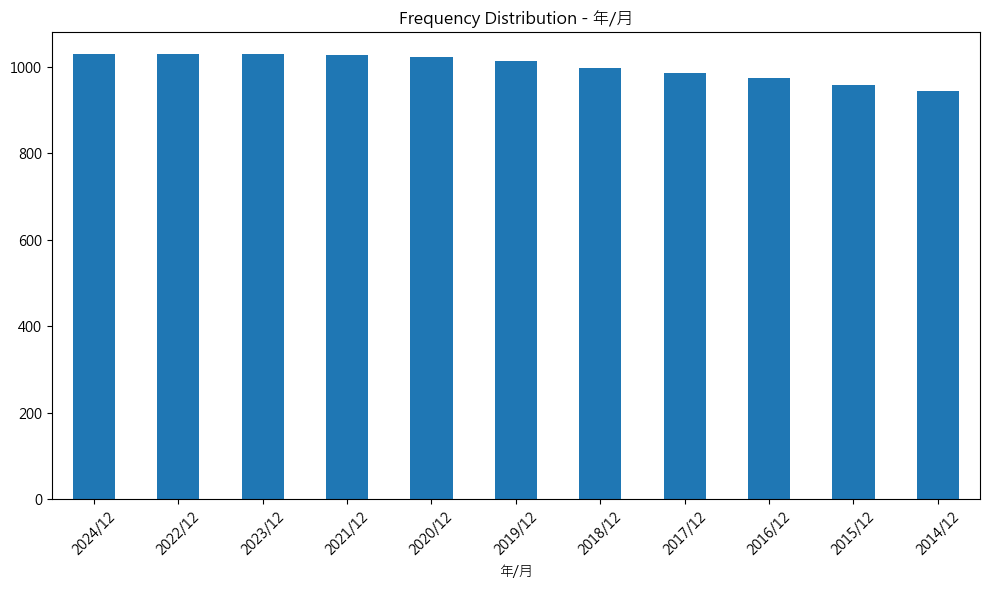


合併(Y/N) Frequency Distribution:
Total unique values: 2
合併(Y/N)
Y    10378
N      636
Name: count, dtype: int64


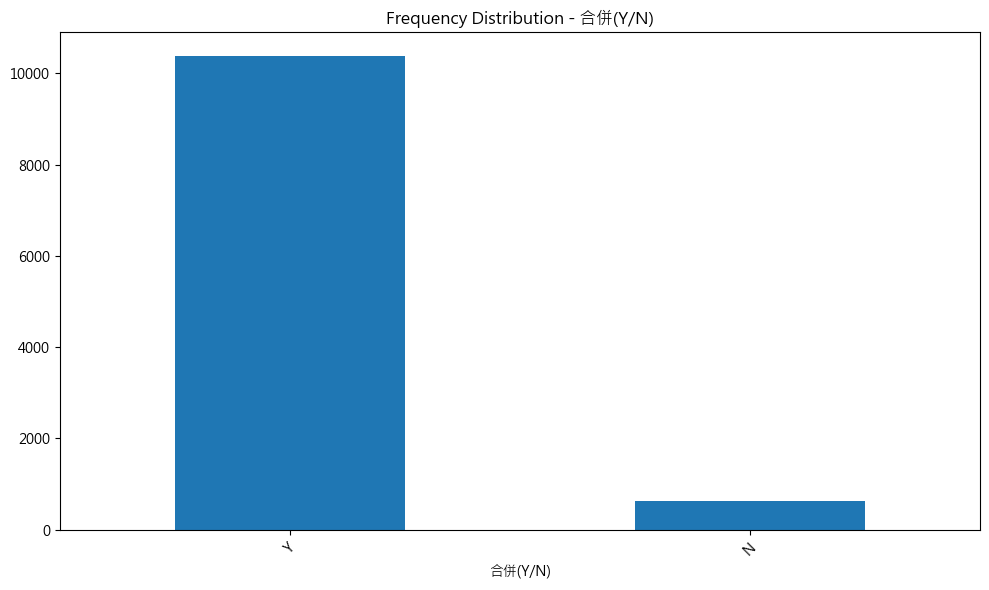


幣別 Frequency Distribution:
Total unique values: 1
幣別
NTD    11014
Name: count, dtype: int64


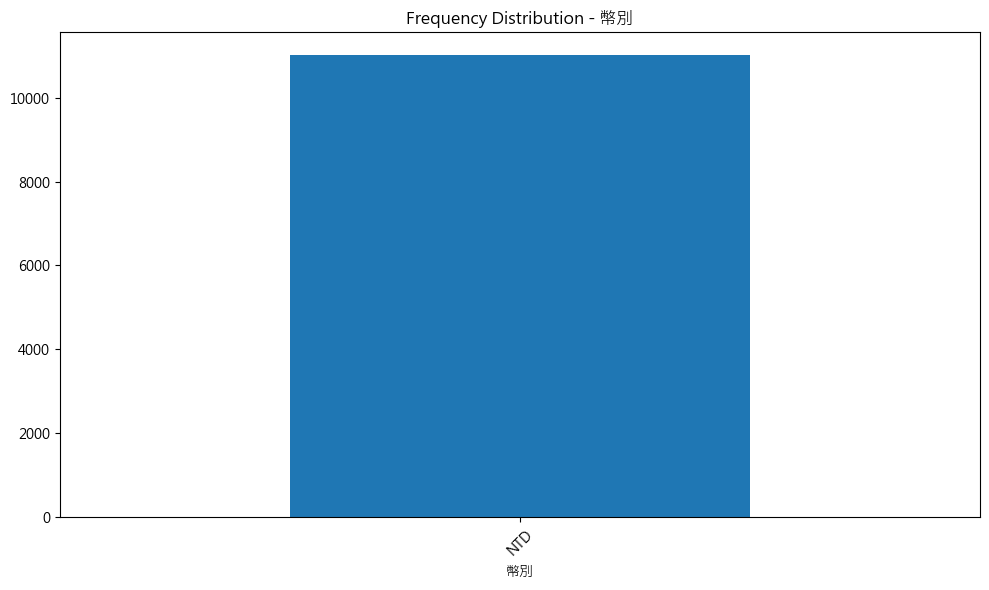


  現金及約當現金 Frequency Distribution:
Total unique values: 11000
  現金及約當現金
101,579      2
239,601      2
616,436      2
520,648      2
373,909      2
1,468,956    2
573,450      2
491,638      2
255,482      2
994,321      2
Name: count, dtype: int64

流動資產 Frequency Distribution:
Total unique values: 10672
流動資產
-            341
2,531,015      2
1,938,505      2
1,779,939      1
1,466,895      1
2,306,995      1
2,357,299      1
2,027,262      1
1,962,845      1
2,115,234      1
Name: count, dtype: int64

資產總額 Frequency Distribution:
Total unique values: 11014
資產總額
593,413,647    1
6,916,866      1
3,030,217      1
1,563,707      1
7,581,853      1
5,744,361      1
8,038,168      1
7,910,882      1
4,394,531      1
7,173,226      1
Name: count, dtype: int64

流動負債 Frequency Distribution:
Total unique values: 10668
流動負債
-            341
3,221,457      2
2,655,411      2
238,654        2
1,096,038      2
1,077,121      2
760,497        2
989,039        1
1,370,297      1
632,369        1
Name

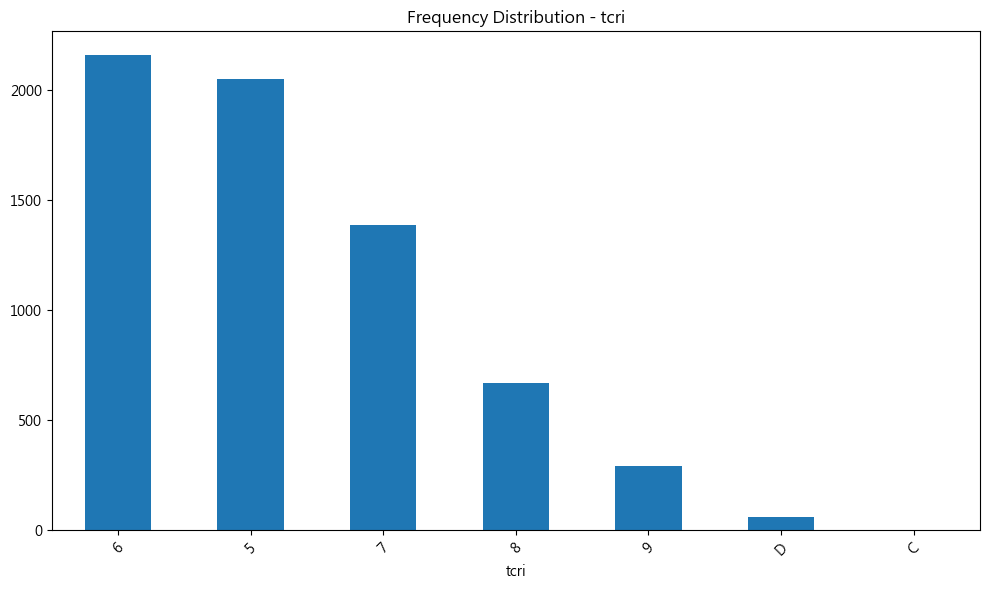

In [11]:
print("\n" + "="*50)
print("3. CATEGORICAL VARIABLES FREQUENCY")
print("="*50)

categorical_vars = merged_data.select_dtypes(include=['object']).columns.tolist()

if categorical_vars:
    for col in categorical_vars:
        print(f"\n{col} Frequency Distribution:")
        freq = merged_data[col].value_counts()
        print(f"Total unique values: {len(freq)}")
        print(freq.head(10))  
        
        if len(freq) <= 20:  
            plt.figure(figsize=(10, 6))
            freq.plot(kind='bar')
            plt.title(f'Frequency Distribution - {col}')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
else:
    print("No categorical variables found in the dataset.")


3. CATEGORICAL VARIABLES FREQUENCY - COMPLETE VISUALIZATION
Found 51 categorical variables:
['公司', '年/月', '合併(Y/N)', '幣別', '  現金及約當現金', '流動資產', '資產總額', '流動負債', '負債總額', '    普通股股本', '  股本', '  資本公積合計', '  保留盈餘', '股東權益總額', '營業收入淨額', '營業成本', '營業毛利', '營業費用', '營運資金', '  研究發展費', '  預期信用減損（損失）利益－營業費用', '營業利益', '財務成本', '稅前淨利', '稅前息前淨利', '來自營運之現金流量', '投資活動之現金流量', '籌資活動之現金流量', 'Tobins Q', '財務槓桿度', '營運槓桿度', '利息保障倍數', 'ROA－綜合損益', 'ROE－綜合損益', '現金流量允當比', '現金再投資比', '流動比率', '速動比率', '利息支出率', '利息支出率(B)', '總負債/總淨值', '長期資金適合率(A)', '長短期借款', '淨負債', '借款依存度', '或有負債/淨值', '營業利益 /實收資本比', '稅前純益 /實收資本', '內部保留比率', '股利支付率', 'tcri']

Variable 1: 公司
Total unique values: 1030
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
公司
1101 台泥        11
4106 雃博        11
3669 圓展        11
3673 TPK-KY    11
3679 新至陞       11
3686 達能        11
3694 海華        11
3701 大眾控       11
3702 大聯大       11
3703 欣陸        11
3704 合勤控       11
3705 永信        11
3706 神達        11
4104 佳醫        11
4108 懷特        1

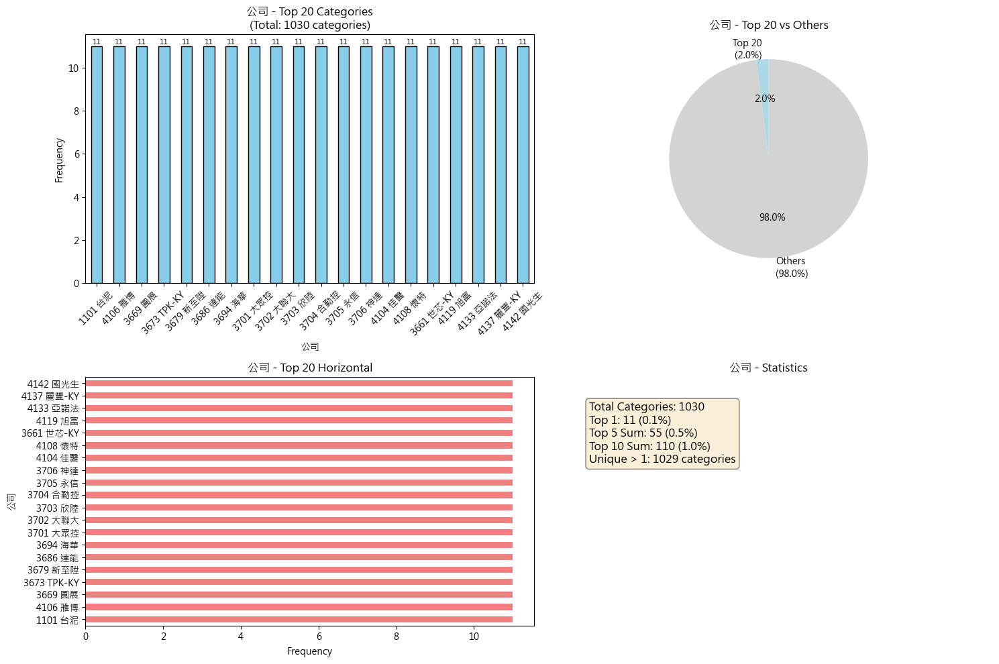


Detailed Statistics for 公司:
  Most frequent value: '1101 台泥' (count: 11, 0.1%)
  Least frequent value: '3716 中化控股' (count: 1, 0.0%)
  Top 5 values cover: 0.5% of data
  Categories with count = 1: 1

Variable 2: 年/月
Total unique values: 11
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
年/月
2024/12    1029
2022/12    1029
2023/12    1029
2021/12    1028
2020/12    1023
2019/12    1013
2018/12     998
2017/12     986
2016/12     975
2015/12     959
2014/12     945
Name: count, dtype: int64


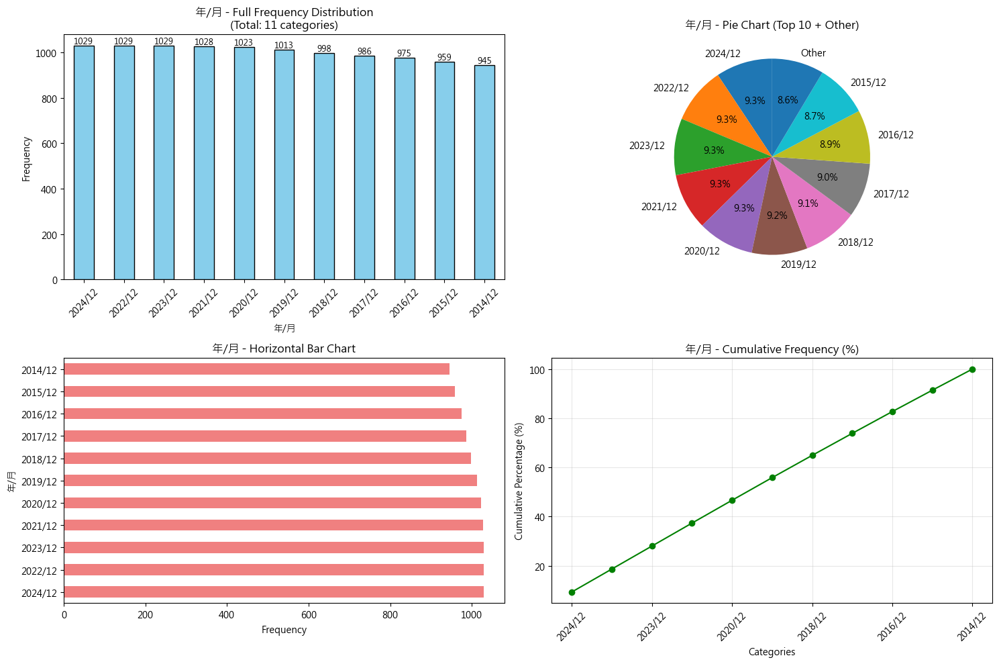


Detailed Statistics for 年/月:
  Most frequent value: '2024/12' (count: 1029, 9.3%)
  Least frequent value: '2014/12' (count: 945, 8.6%)
  Top 5 values cover: 46.6% of data
  Categories with count = 1: 0

Variable 3: 合併(Y/N)
Total unique values: 2
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
合併(Y/N)
Y    10378
N      636
Name: count, dtype: int64


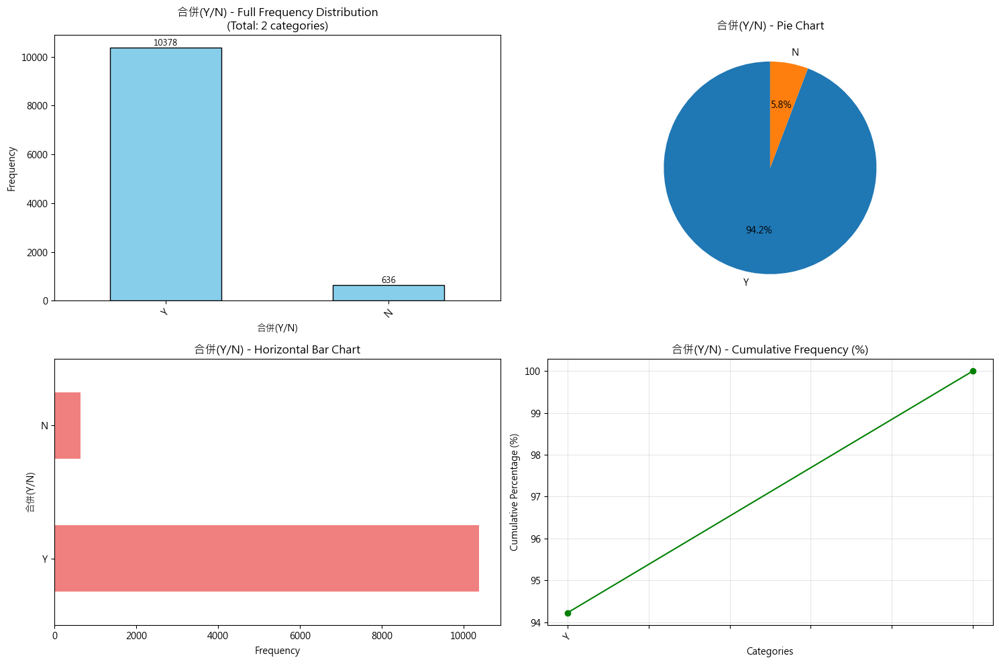


Detailed Statistics for 合併(Y/N):
  Most frequent value: 'Y' (count: 10378, 94.2%)
  Least frequent value: 'N' (count: 636, 5.8%)
  Top 5 values cover: 100.0% of data
  Categories with count = 1: 0

Variable 4: 幣別
Total unique values: 1
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
幣別
NTD    11014
Name: count, dtype: int64


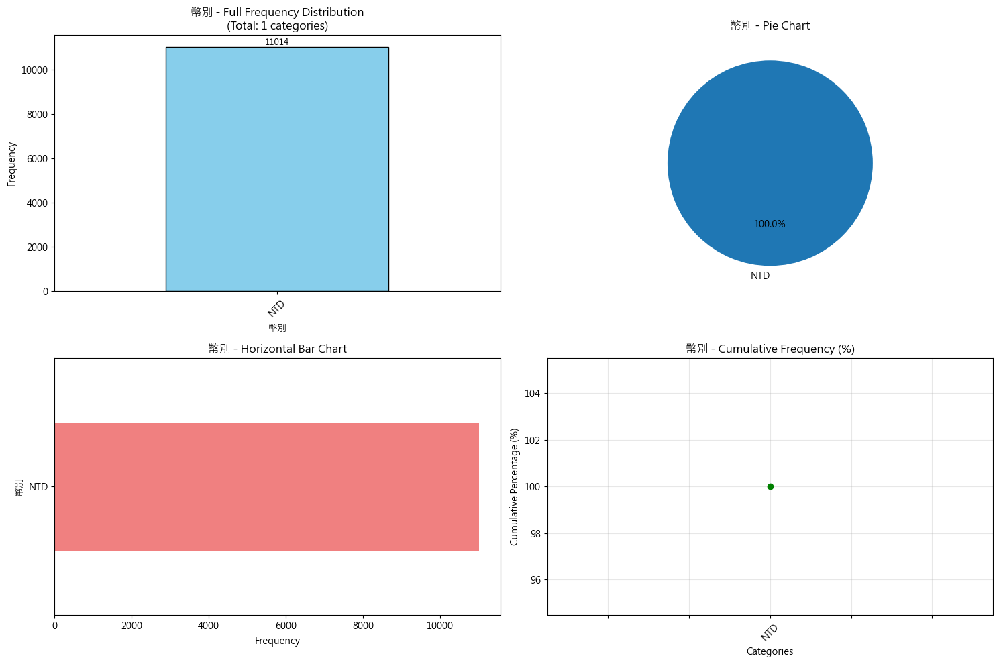


Detailed Statistics for 幣別:
  Most frequent value: 'NTD' (count: 11014, 100.0%)
  Least frequent value: 'NTD' (count: 11014, 100.0%)
  Top 5 values cover: 100.0% of data
  Categories with count = 1: 0

Variable 5:   現金及約當現金
Total unique values: 11000
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  現金及約當現金
101,579      2
239,601      2
616,436      2
520,648      2
373,909      2
1,468,956    2
573,450      2
491,638      2
255,482      2
994,321      2
126,354      2
816,356      2
251,893      2
1,194,354    2
776,394      1
Name: count, dtype: int64


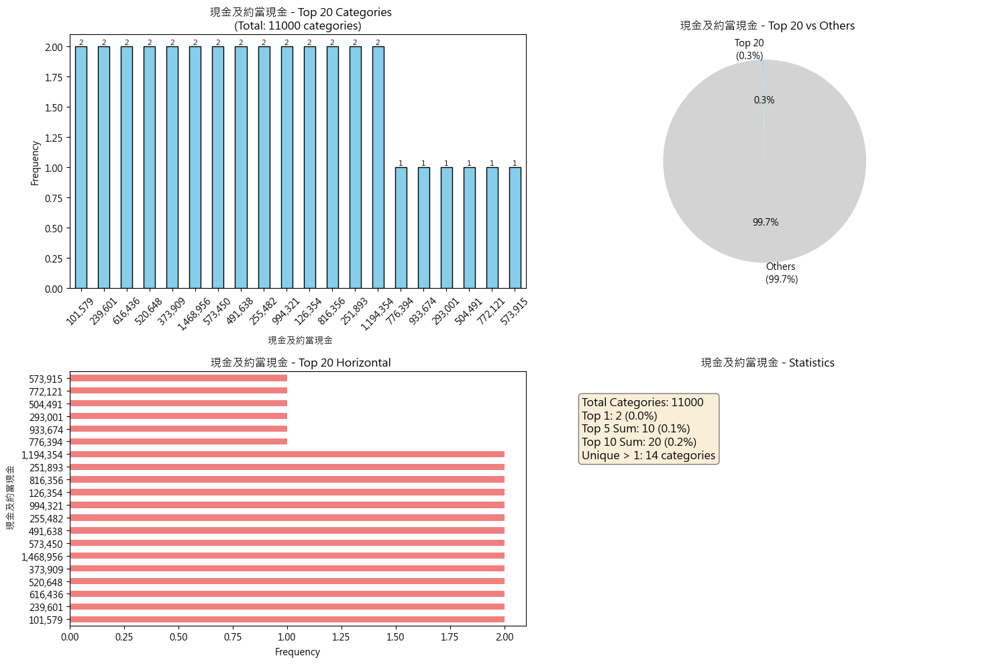


Detailed Statistics for   現金及約當現金:
  Most frequent value: '101,579' (count: 2, 0.0%)
  Least frequent value: '1,488,247' (count: 1, 0.0%)
  Top 5 values cover: 0.1% of data
  Categories with count = 1: 10986

Variable 6: 流動資產
Total unique values: 10672
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
流動資產
-            341
2,531,015      2
1,938,505      2
1,779,939      1
1,466,895      1
2,306,995      1
2,357,299      1
2,027,262      1
1,962,845      1
2,115,234      1
2,721,843      1
2,063,196      1
1,189,953      1
2,169,205      1
2,231,499      1
Name: count, dtype: int64


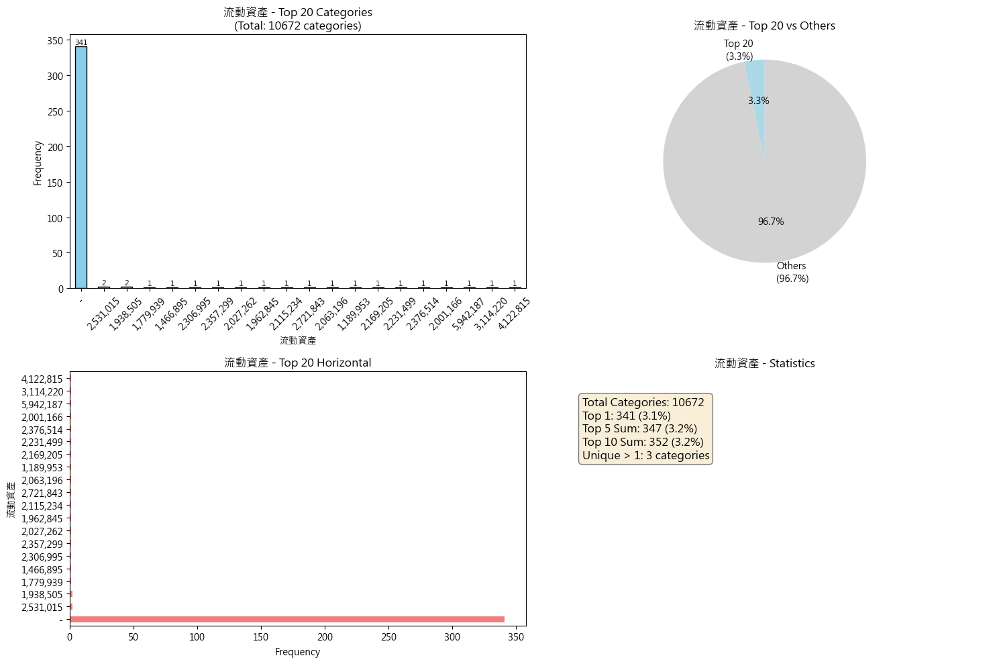


Detailed Statistics for 流動資產:
  Most frequent value: '-' (count: 341, 3.1%)
  Least frequent value: '10,826,420' (count: 1, 0.0%)
  Top 5 values cover: 3.2% of data
  Categories with count = 1: 10669

Variable 7: 資產總額
Total unique values: 11014
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
資產總額
593,413,647    1
6,916,866      1
3,030,217      1
1,563,707      1
7,581,853      1
5,744,361      1
8,038,168      1
7,910,882      1
4,394,531      1
7,173,226      1
5,218,530      1
1,697,185      1
6,084,282      1
8,108,233      1
7,890,838      1
Name: count, dtype: int64


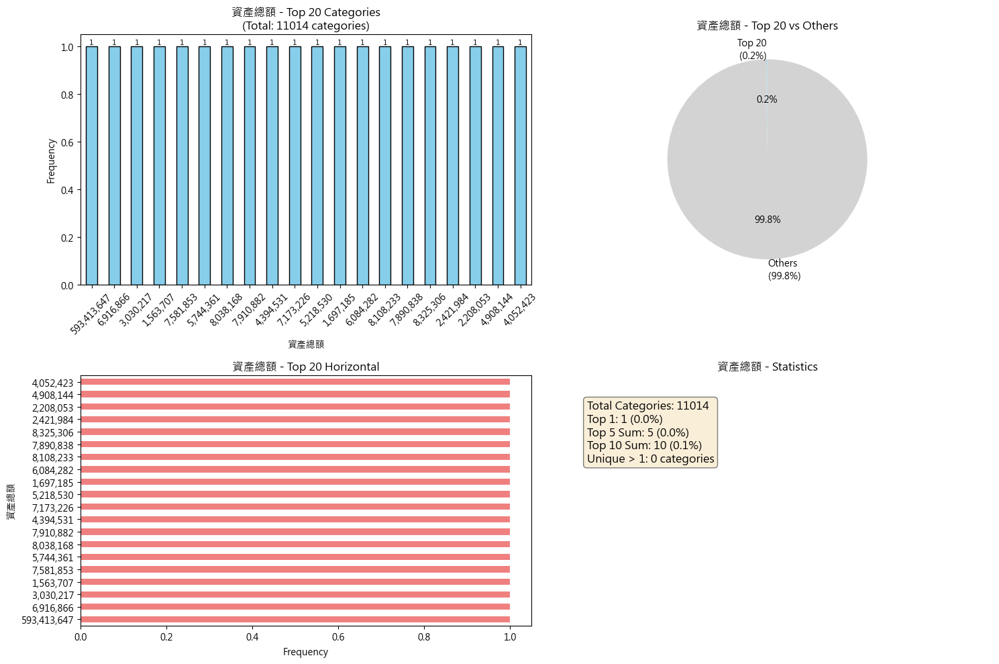


Detailed Statistics for 資產總額:
  Most frequent value: '593,413,647' (count: 1, 0.0%)
  Least frequent value: '26,868,051' (count: 1, 0.0%)
  Top 5 values cover: 0.0% of data
  Categories with count = 1: 11014

Variable 8: 流動負債
Total unique values: 10668
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
流動負債
-            341
3,221,457      2
2,655,411      2
238,654        2
1,096,038      2
1,077,121      2
760,497        2
989,039        1
1,370,297      1
632,369        1
617,467        1
1,249,345      1
825,469        1
834,549        1
1,237,671      1
Name: count, dtype: int64


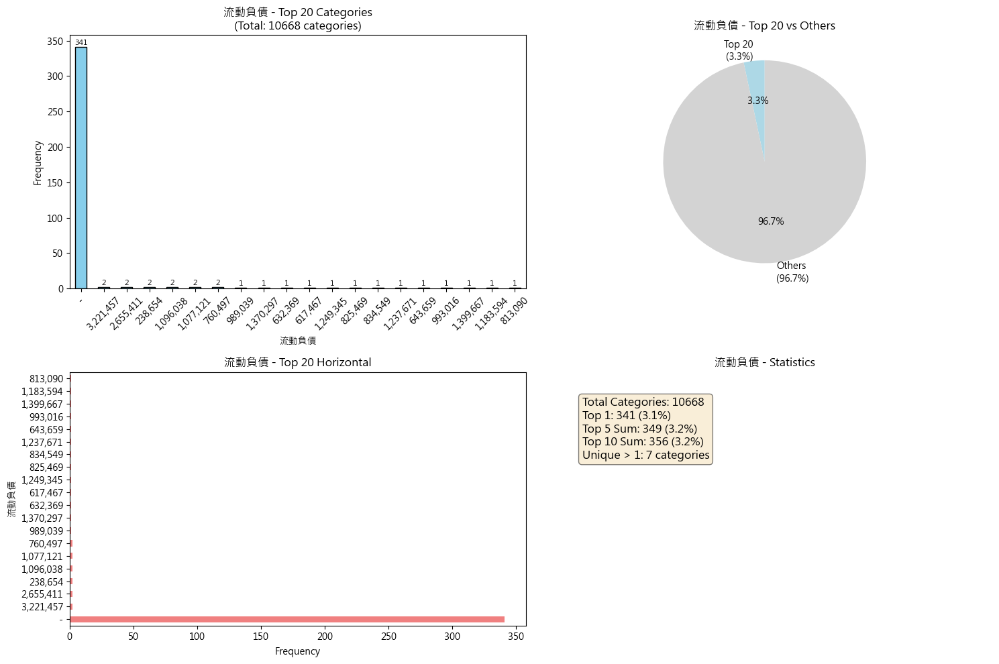


Detailed Statistics for 流動負債:
  Most frequent value: '-' (count: 341, 3.1%)
  Least frequent value: '7,242,838' (count: 1, 0.0%)
  Top 5 values cover: 3.2% of data
  Categories with count = 1: 10661

Variable 9: 負債總額
Total unique values: 11014
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
負債總額
285,505,383    1
3,226,145      1
1,754,934      1
896,165        1
3,269,453      1
2,499,897      1
3,592,340      1
3,618,446      1
2,017,898      1
3,213,605      1
2,638,965      1
897,249        1
2,766,119      1
3,634,030      1
3,498,787      1
Name: count, dtype: int64


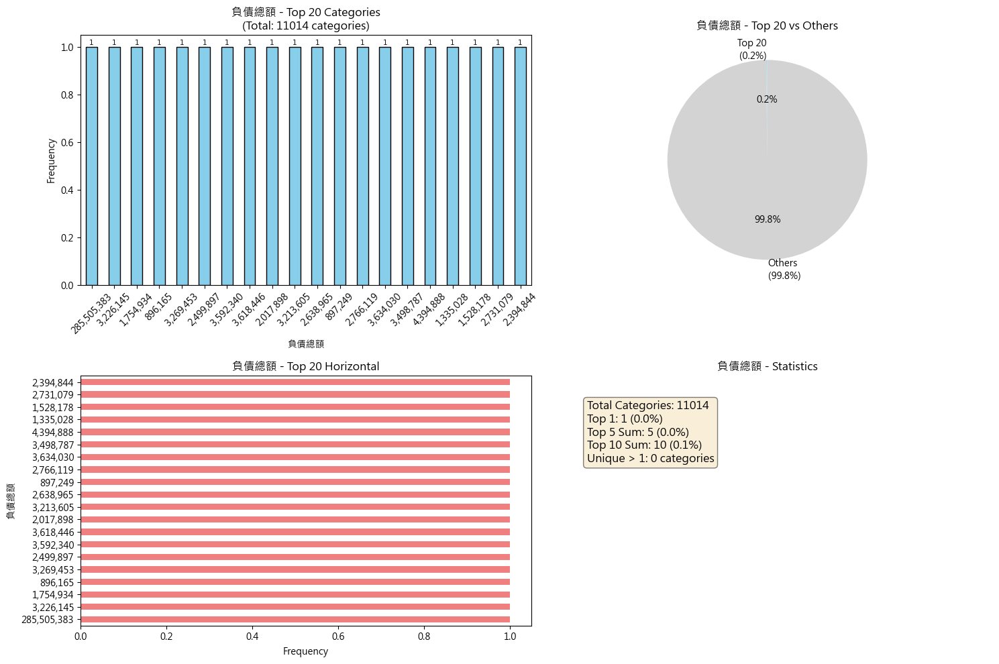


Detailed Statistics for 負債總額:
  Most frequent value: '285,505,383' (count: 1, 0.0%)
  Least frequent value: '16,786,460' (count: 1, 0.0%)
  Top 5 values cover: 0.0% of data
  Categories with count = 1: 11014

Variable 10:     普通股股本
Total unique values: 4908
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
    普通股股本
600,000      42
2,000,000    33
1,500,000    31
1,000,000    27
300,000      23
726,000      22
800,000      21
630,000      21
700,000      18
675,000      16
2,200,000    14
1,800,000    12
1,050,000    12
1,980,000    12
1,020,000    12
Name: count, dtype: int64


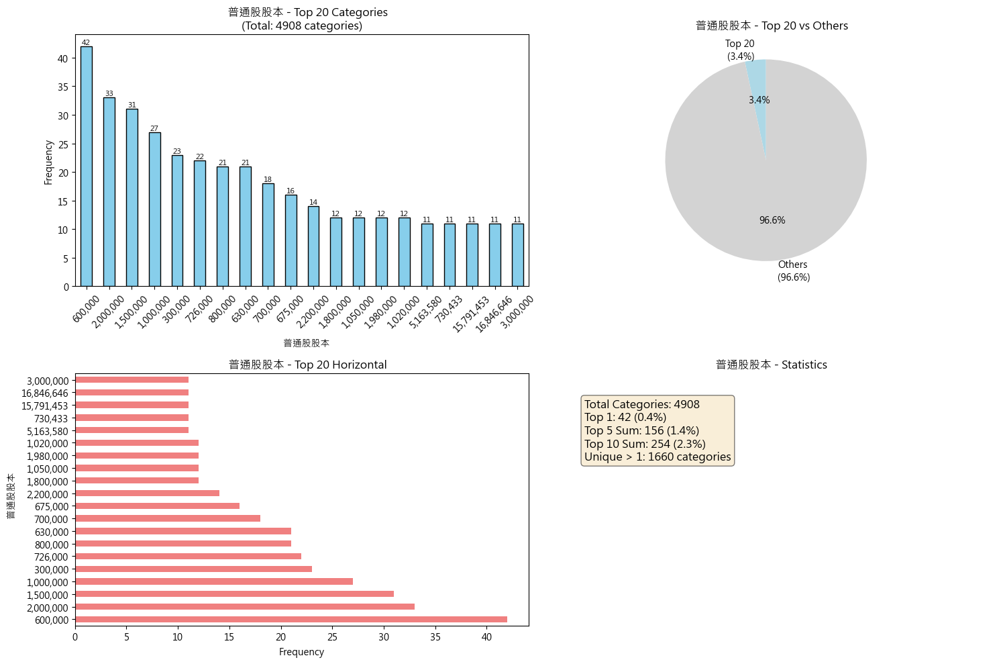


Detailed Statistics for     普通股股本:
  Most frequent value: '600,000' (count: 42, 0.4%)
  Least frequent value: '2,312,789' (count: 1, 0.0%)
  Top 5 values cover: 1.4% of data
  Categories with count = 1: 3248

Variable 11:   股本
Total unique values: 4945
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  股本
600,000      42
2,000,000    33
1,500,000    31
1,000,000    27
300,000      24
726,000      22
630,000      21
800,000      21
700,000      18
2,200,000    14
675,000      14
1,980,000    12
1,800,000    12
1,050,000    12
1,020,000    12
Name: count, dtype: int64


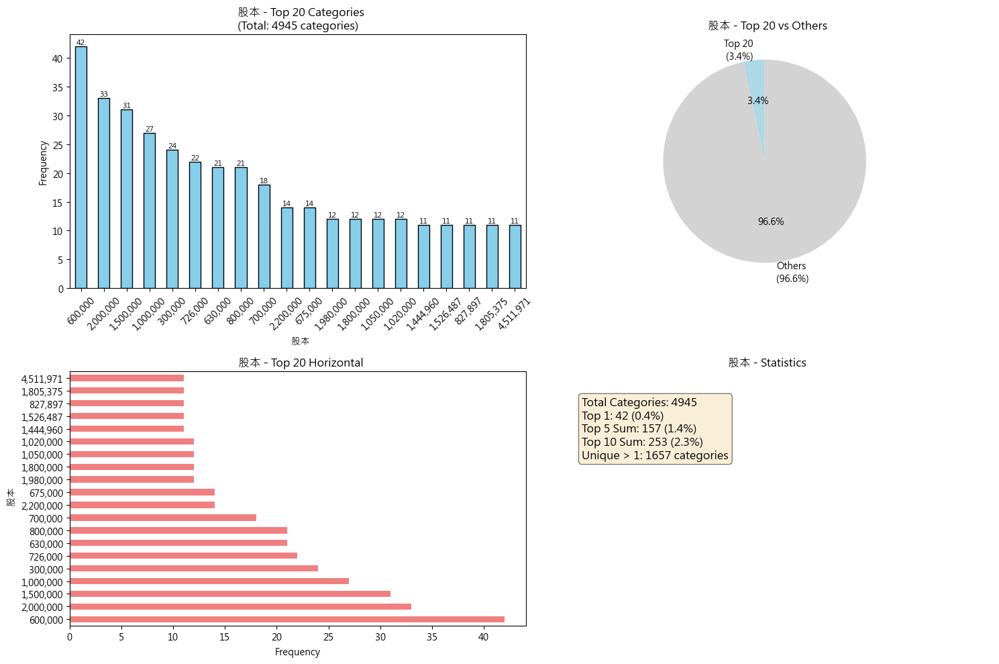


Detailed Statistics for   股本:
  Most frequent value: '600,000' (count: 42, 0.4%)
  Least frequent value: '2,312,789' (count: 1, 0.0%)
  Top 5 values cover: 1.4% of data
  Categories with count = 1: 3288

Variable 12:   資本公積合計
Total unique values: 7685
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  資本公積合計
0          454
9           13
1,251       13
21,938      12
2,169       11
62,361      11
41          11
11          11
531,823     11
42,859      11
127,463     11
53,290      11
107,011     11
975,330     11
2,480       11
Name: count, dtype: int64


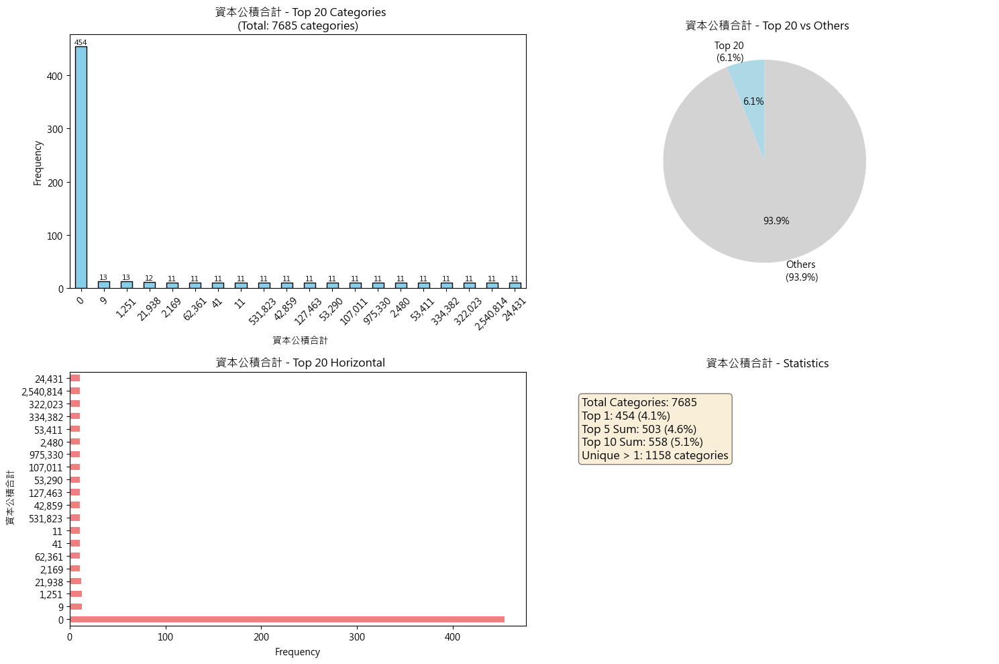


Detailed Statistics for   資本公積合計:
  Most frequent value: '0' (count: 454, 4.1%)
  Least frequent value: '2,948,844' (count: 1, 0.0%)
  Top 5 values cover: 4.6% of data
  Categories with count = 1: 6527

Variable 13:   保留盈餘
Total unique values: 11003
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  保留盈餘
-112,944     2
459,367      2
106,751      2
14,603       2
362,838      2
416,580      2
660,460      2
5,160        2
672,830      2
526,851      2
1,407,965    2
220,714      1
202,754      1
400,679      1
812,222      1
Name: count, dtype: int64


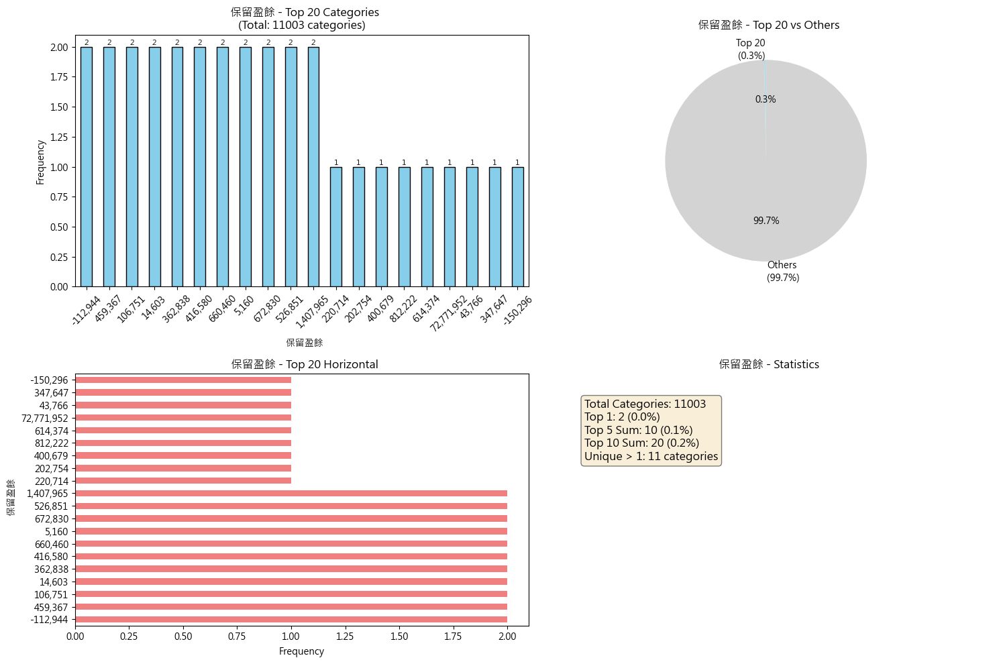


Detailed Statistics for   保留盈餘:
  Most frequent value: '-112,944' (count: 2, 0.0%)
  Least frequent value: '2,136,285' (count: 1, 0.0%)
  Top 5 values cover: 0.1% of data
  Categories with count = 1: 10992

Variable 14: 股東權益總額
Total unique values: 11012
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
股東權益總額
1,275,283      2
7,703,151      2
307,908,264    1
1,123,433      1
1,267,237      1
667,542        1
4,312,400      1
3,244,464      1
4,445,828      1
4,292,436      1
2,376,633      1
3,959,621      1
3,690,721      1
2,579,565      1
3,318,163      1
Name: count, dtype: int64


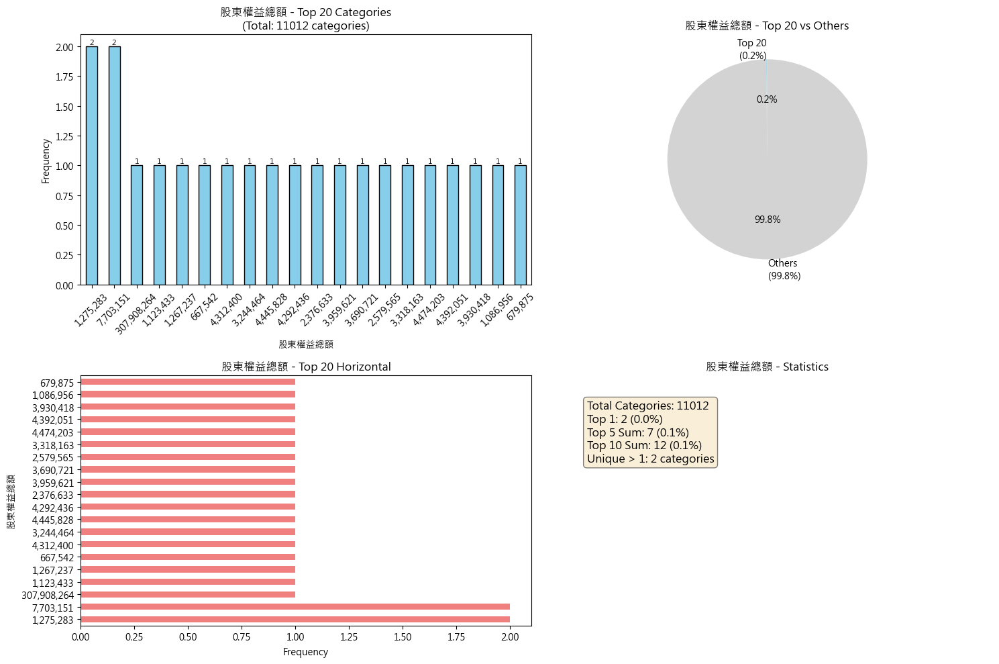


Detailed Statistics for 股東權益總額:
  Most frequent value: '1,275,283' (count: 2, 0.0%)
  Least frequent value: '10,081,591' (count: 1, 0.0%)
  Top 5 values cover: 0.1% of data
  Categories with count = 1: 11010

Variable 15: 營業收入淨額
Total unique values: 10972
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業收入淨額
-            20
0            18
6,441,828     2
877,438       2
117,867       2
3,243,968     2
7,231,688     2
1,524,348     2
1,760,939     1
1,816,136     1
1,374,470     1
1,181,042     1
1,257,464     1
1,244,747     1
1,654,088     1
Name: count, dtype: int64


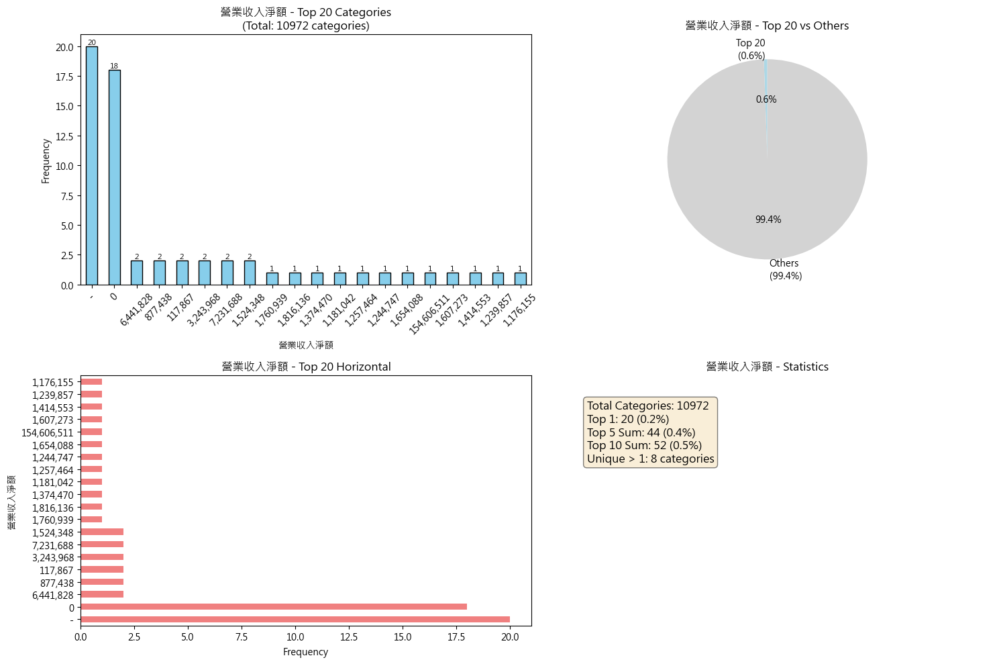


Detailed Statistics for 營業收入淨額:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '9,935,452' (count: 1, 0.0%)
  Top 5 values cover: 0.4% of data
  Categories with count = 1: 10964

Variable 16: 營業成本
Total unique values: 10693
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業成本
-              295
0               25
2,685,343        2
5,218,643        2
1,360,551        2
443,615          1
350,876          1
245,186          1
292,221          1
260,547          1
1,094,559        1
1,554,283        1
121,878,486      1
425,587          1
1,501,768        1
Name: count, dtype: int64


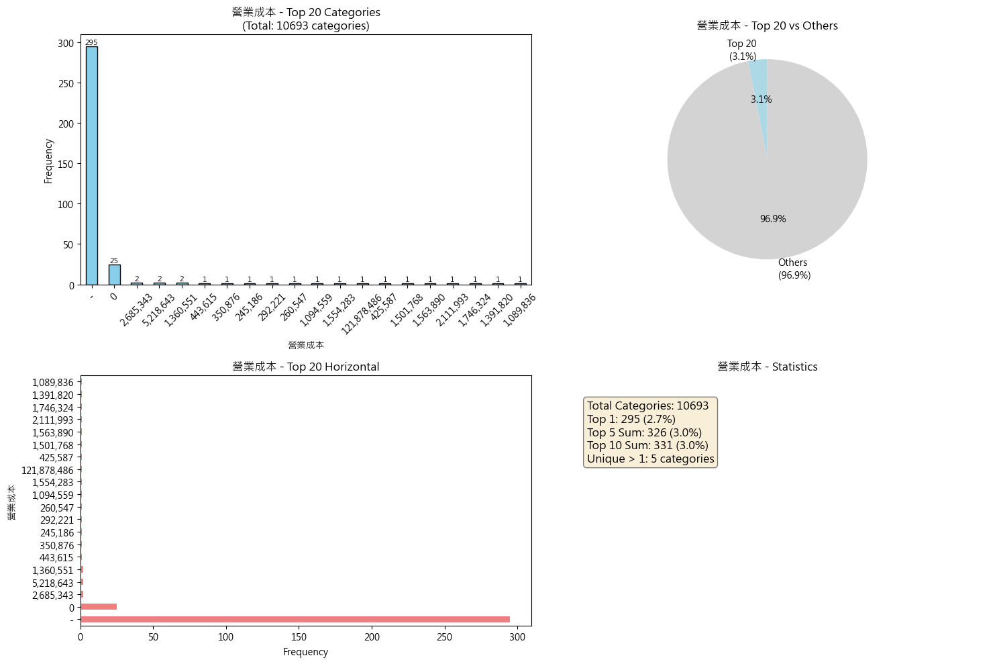


Detailed Statistics for 營業成本:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '7,795,126' (count: 1, 0.0%)
  Top 5 values cover: 3.0% of data
  Categories with count = 1: 10688

Variable 17: 營業毛利
Total unique values: 10683
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業毛利
-            295
0             18
1,742,768      2
181,048        2
-36            2
1,240,054      2
372,794        2
602,099        2
750,870        2
1,485,914      2
716,067        2
246,494        2
74,996         2
288,437        2
78,664         2
Name: count, dtype: int64


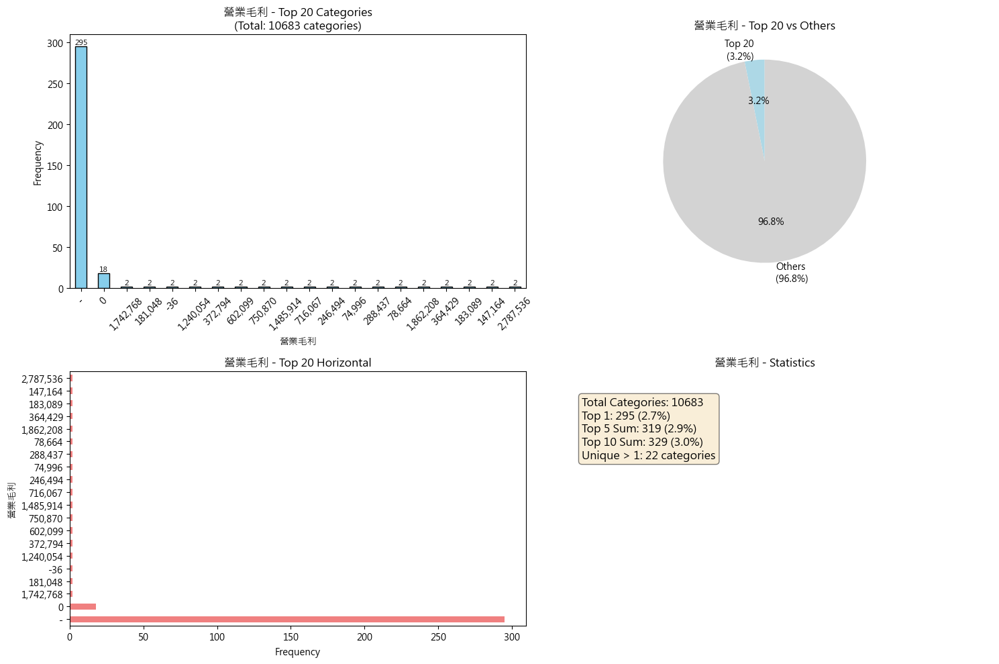


Detailed Statistics for 營業毛利:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '2,140,326' (count: 1, 0.0%)
  Top 5 values cover: 2.9% of data
  Categories with count = 1: 10661

Variable 18: 營業費用
Total unique values: 10966
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業費用
-          20
290,543     2
389,712     2
269,746     2
336,504     2
169,099     2
218,264     2
476,116     2
283,998     2
323,065     2
190,911     2
256,422     2
476,499     2
97,239      2
455,949     2
Name: count, dtype: int64


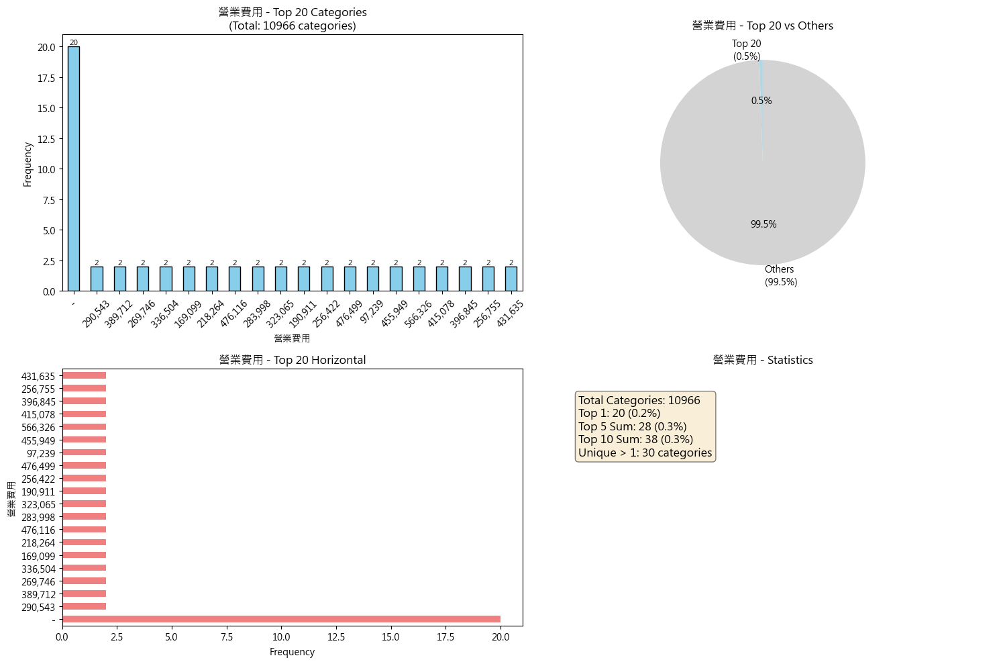


Detailed Statistics for 營業費用:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '391,768' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10936

Variable 19: 營運資金
Total unique values: 10665
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營運資金
-             344
1,033,731       2
1,078,389       2
160,936         2
961,712         2
2,430,319       2
1,356,295       2
87,007,198      1
630,066         1
557,584         1
427,220         1
530,594         1
641,426         1
1,317,956       1
1,522,750       1
Name: count, dtype: int64


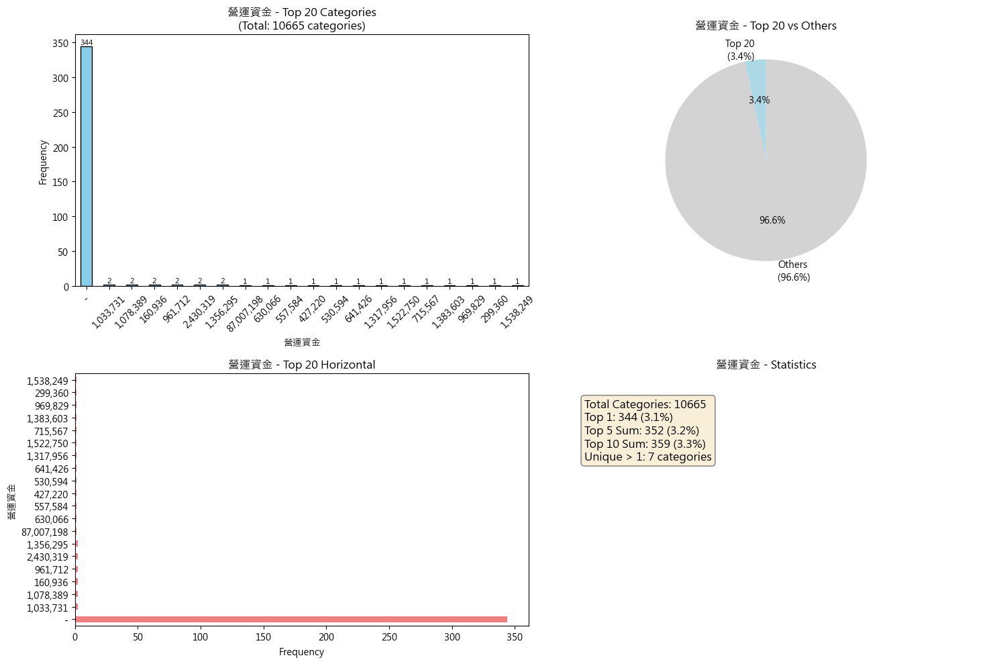


Detailed Statistics for 營運資金:
  Most frequent value: '-' (count: 344, 3.1%)
  Least frequent value: '3,583,582' (count: 1, 0.0%)
  Top 5 values cover: 3.2% of data
  Categories with count = 1: 10658

Variable 20:   研究發展費
Total unique values: 8057
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  研究發展費
0          2214
-           637
9,369         3
4,514         3
100,017       2
85,589        2
19,990        2
18,477        2
54,787        2
6,415         2
86,281        2
72,213        2
125,021       2
18,976        2
48,648        2
Name: count, dtype: int64


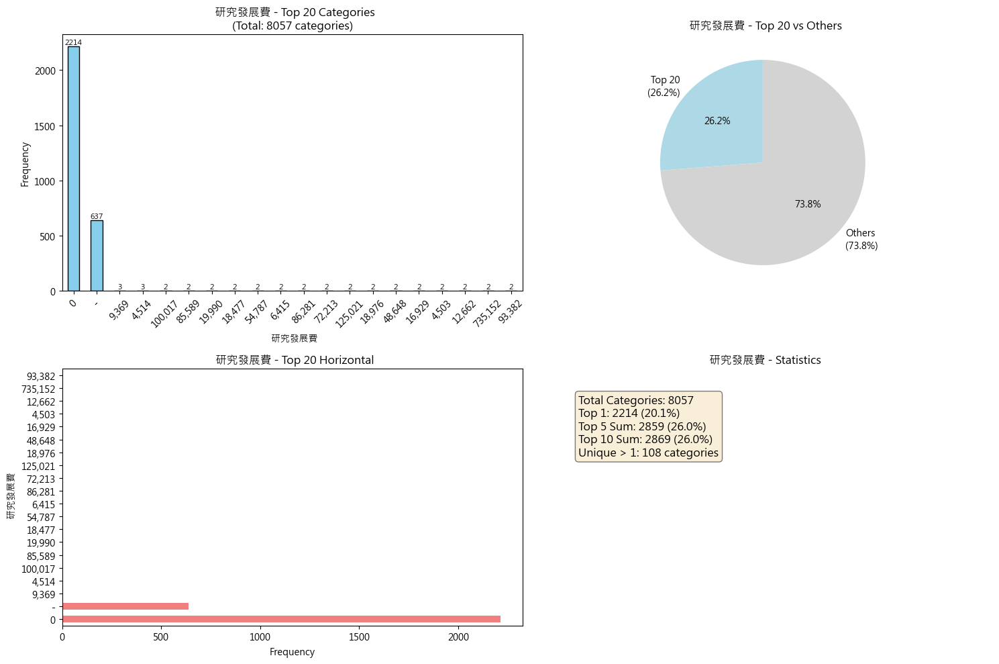


Detailed Statistics for   研究發展費:
  Most frequent value: '0' (count: 2214, 20.1%)
  Least frequent value: '2,735' (count: 1, 0.0%)
  Top 5 values cover: 26.0% of data
  Categories with count = 1: 7949

Variable 21:   預期信用減損（損失）利益－營業費用
Total unique values: 4272
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  預期信用減損（損失）利益－營業費用
-      4202
0      1976
6         6
-5        6
3         6
-12       6
-15       6
2         6
-19       6
-97       6
55        5
-6        5
5         5
-30       5
-23       5
Name: count, dtype: int64


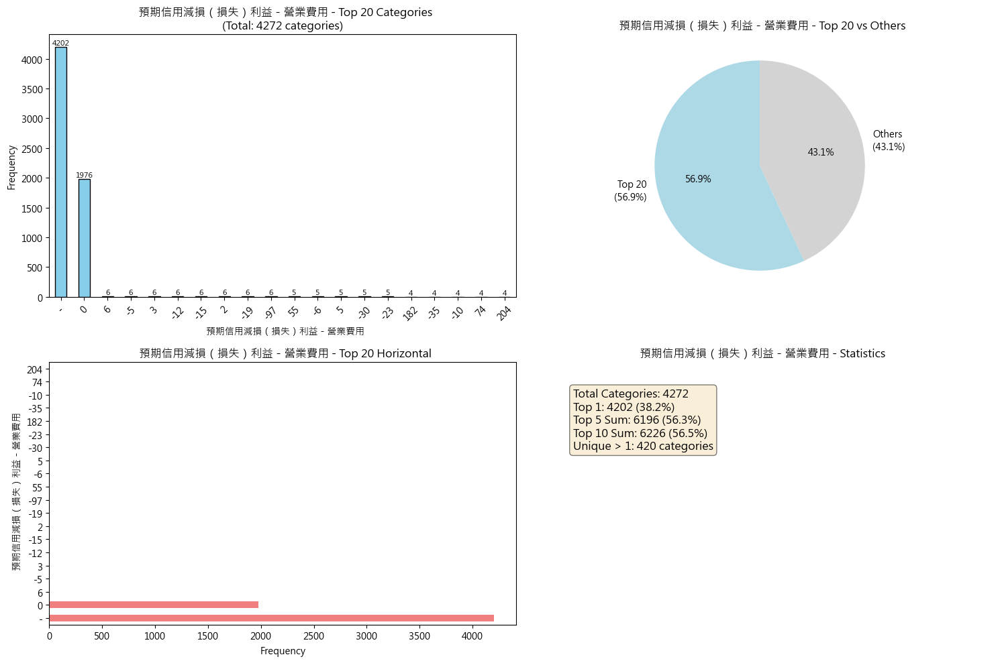


Detailed Statistics for   預期信用減損（損失）利益－營業費用:
  Most frequent value: '-' (count: 4202, 38.2%)
  Least frequent value: '16,265' (count: 1, 0.0%)
  Top 5 values cover: 56.3% of data
  Categories with count = 1: 3852

Variable 22: 營業利益
Total unique values: 10698
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業利益
-           295
78,839        2
312,313       2
608,491       2
-147,435      2
-80,923       2
26,198        2
406,303       2
195,137       2
-48,607       2
71,782        2
226,511       2
190,405       2
-41,685       2
1,459         2
Name: count, dtype: int64


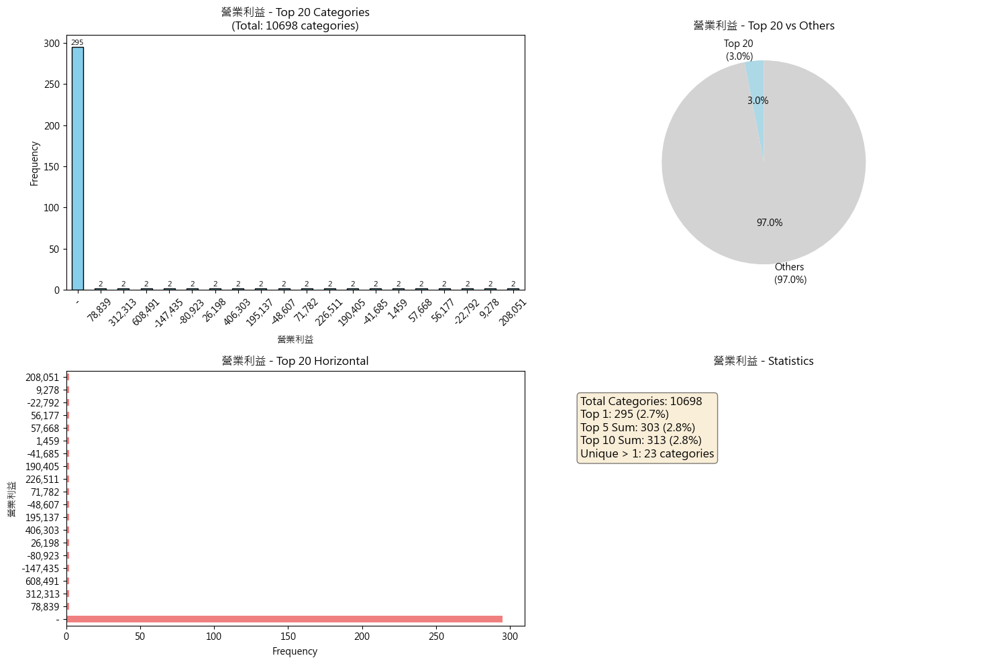


Detailed Statistics for 營業利益:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '1,748,558' (count: 1, 0.0%)
  Top 5 values cover: 2.8% of data
  Categories with count = 1: 10675

Variable 23: 財務成本
Total unique values: 9346
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
財務成本
0     384
-     329
1      12
3      11
4       8
6       8
5       8
2       7
18      7
35      6
12      6
32      6
84      6
9       5
43      5
Name: count, dtype: int64


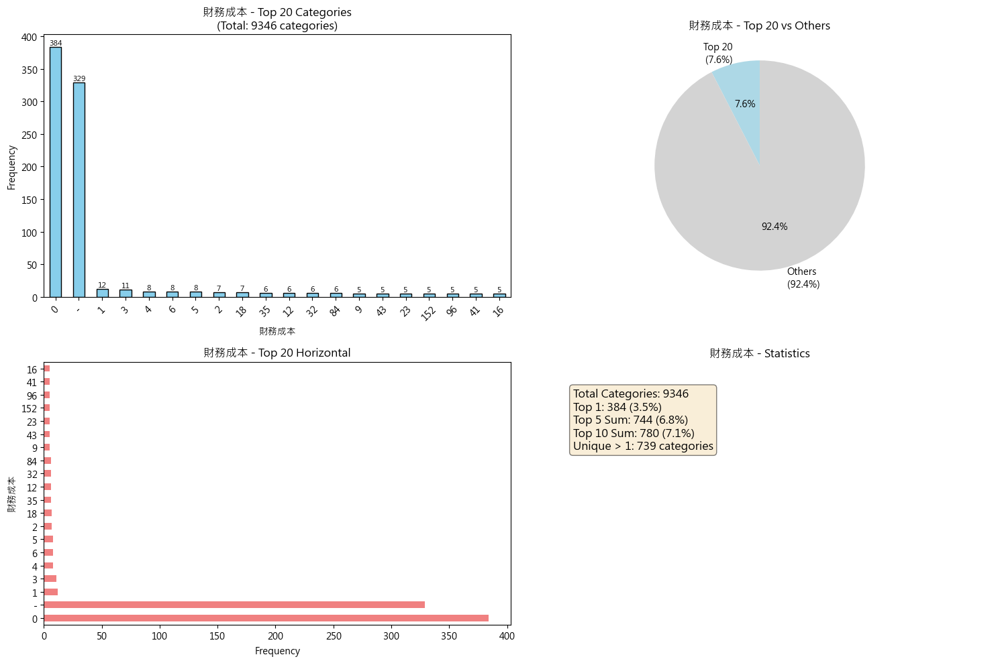


Detailed Statistics for 財務成本:
  Most frequent value: '0' (count: 384, 3.5%)
  Least frequent value: '101,628' (count: 1, 0.0%)
  Top 5 values cover: 6.8% of data
  Categories with count = 1: 8607

Variable 24: 稅前淨利
Total unique values: 10962
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
稅前淨利
-           20
603,707      2
362,600      2
-166,491     2
682,996      2
-96,499      2
443,766      2
191,805      2
172,221      2
133,841      2
113,097      2
15,889       2
202,756      2
413,017      2
-57,710      2
Name: count, dtype: int64


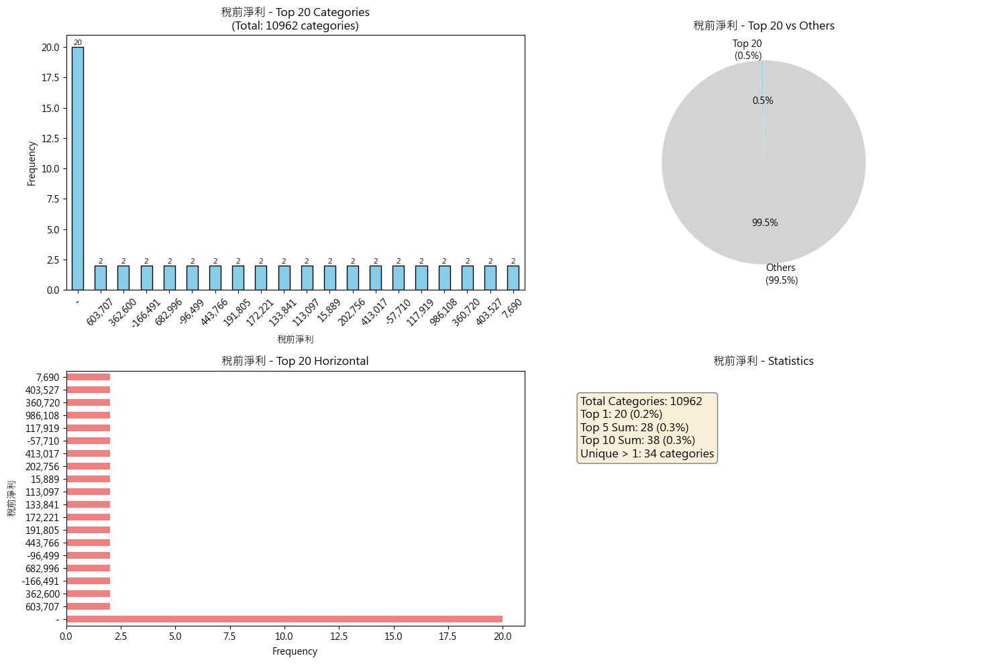


Detailed Statistics for 稅前淨利:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '1,911,220' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10928

Variable 25: 稅前息前淨利
Total unique values: 10932
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
稅前息前淨利
-           47
24,189       2
48,934       2
296,057      2
197,396      2
720,024      2
150,404      2
157,656      2
202,925      2
245,851      2
488,826      2
318,714      2
63,083       2
218,552      2
-130,925     2
Name: count, dtype: int64


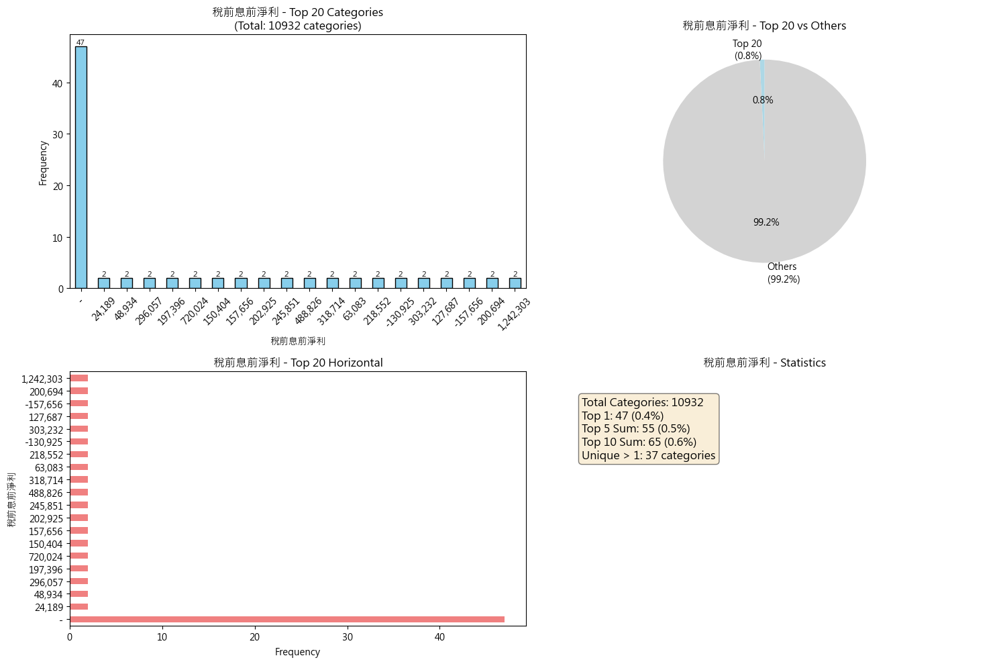


Detailed Statistics for 稅前息前淨利:
  Most frequent value: '-' (count: 47, 0.4%)
  Least frequent value: '2,012,848' (count: 1, 0.0%)
  Top 5 values cover: 0.5% of data
  Categories with count = 1: 10895

Variable 26: 來自營運之現金流量
Total unique values: 10965
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
來自營運之現金流量
-            21
70,828        2
662,295       2
455,094       2
117,948       2
443,204       2
1,097,238     2
141,930       2
183,225       2
32,418        2
33,515        2
-8,880        2
493,245       2
105,134       2
444,578       2
Name: count, dtype: int64


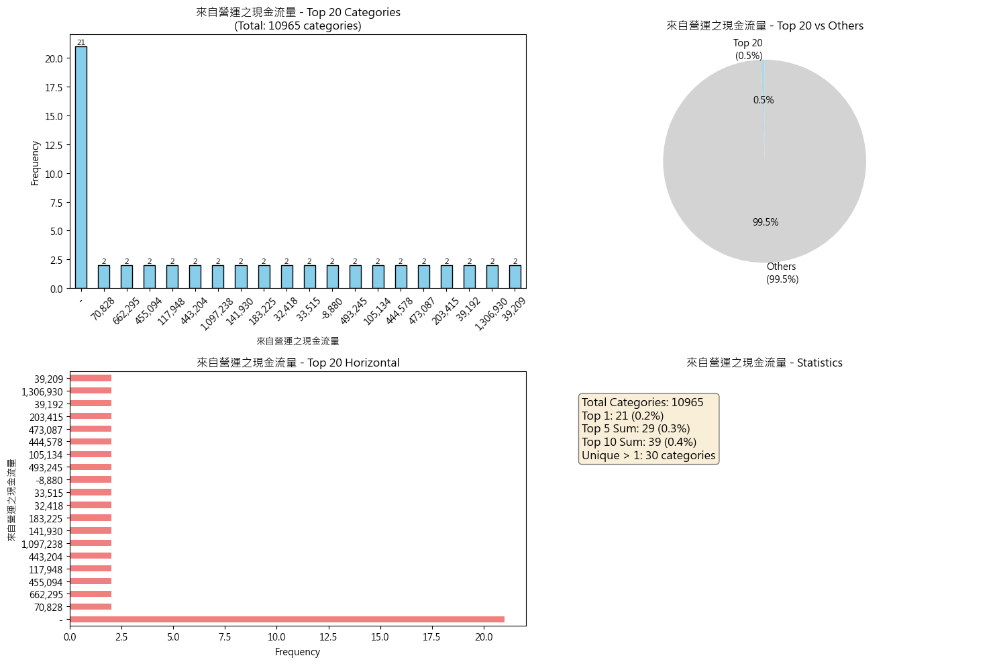


Detailed Statistics for 來自營運之現金流量:
  Most frequent value: '-' (count: 21, 0.2%)
  Least frequent value: '-756,887' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10935

Variable 27: 投資活動之現金流量
Total unique values: 10947
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
投資活動之現金流量
-           21
0            4
12,894       2
-93,449      2
-86,570      2
-87,811      2
-31,079      2
-186,975     2
-20,915      2
-37,928      2
-311,726     2
-53,792      2
-603,383     2
-30,047      2
-56,284      2
Name: count, dtype: int64


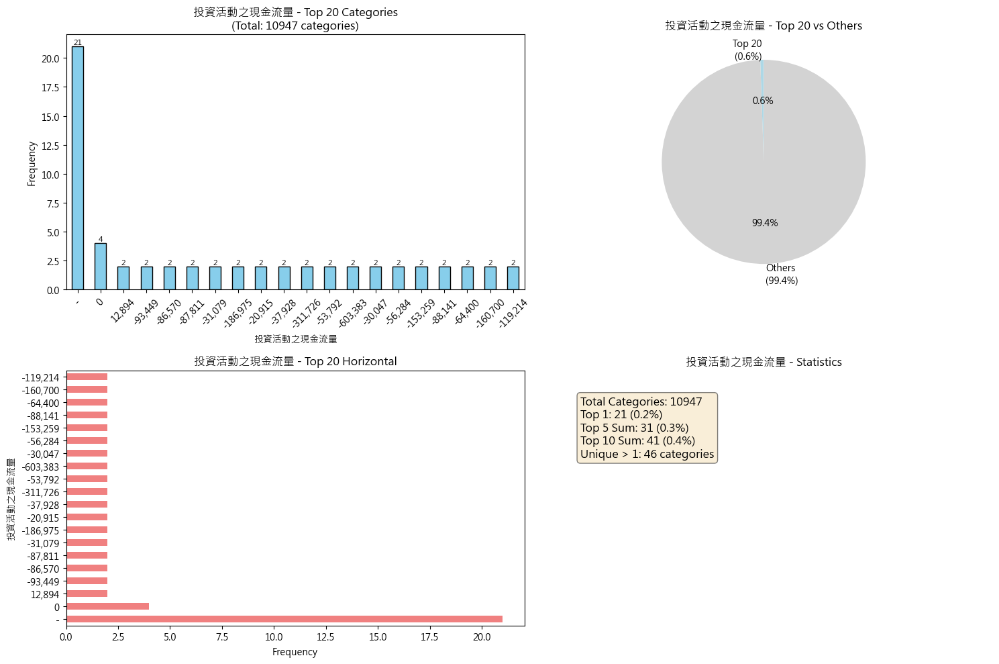


Detailed Statistics for 投資活動之現金流量:
  Most frequent value: '-' (count: 21, 0.2%)
  Least frequent value: '-5,242,873' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10901

Variable 28: 籌資活動之現金流量
Total unique values: 10918
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
籌資活動之現金流量
0           48
-           21
-100         2
15,043       2
4,593        2
6,000        2
63,110       2
-133,704     2
29           2
-708,648     2
304,720      2
-33,693      2
-140,292     2
-884,444     2
293,663      2
Name: count, dtype: int64


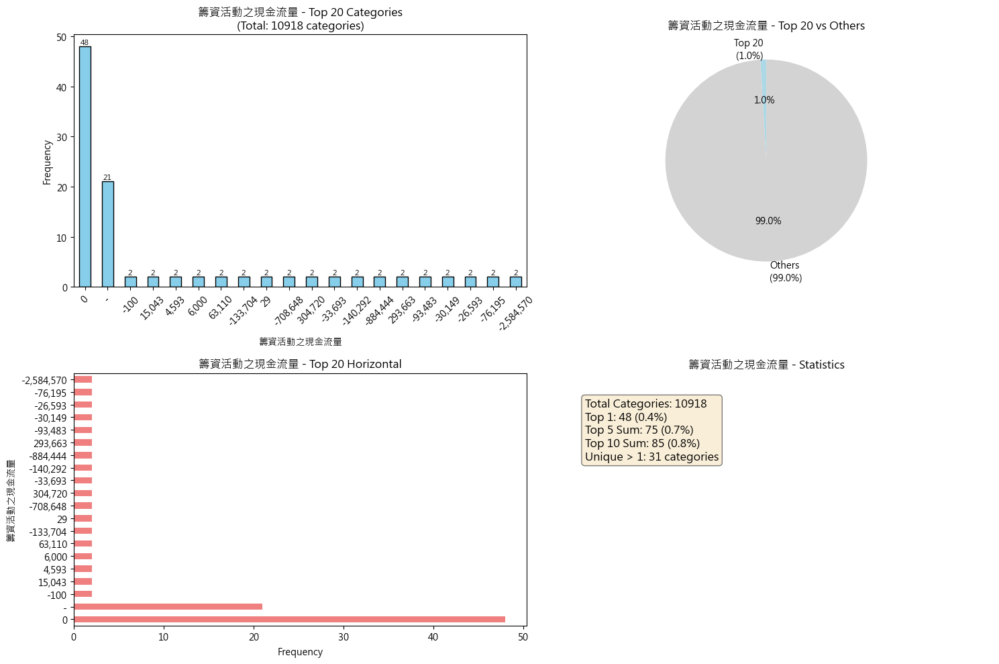


Detailed Statistics for 籌資活動之現金流量:
  Most frequent value: '0' (count: 48, 0.4%)
  Least frequent value: '5,966,004' (count: 1, 0.0%)
  Top 5 values cover: 0.7% of data
  Categories with count = 1: 10887

Variable 29: Tobins Q
Total unique values: 579
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
Tobins Q
0.82    161
0.8     136
0.87    130
0.77    128
0.76    128
0.72    126
0.71    125
0.81    125
0.86    124
0.73    124
0.85    122
0.7     120
0.68    119
0.9     118
0.75    118
Name: count, dtype: int64


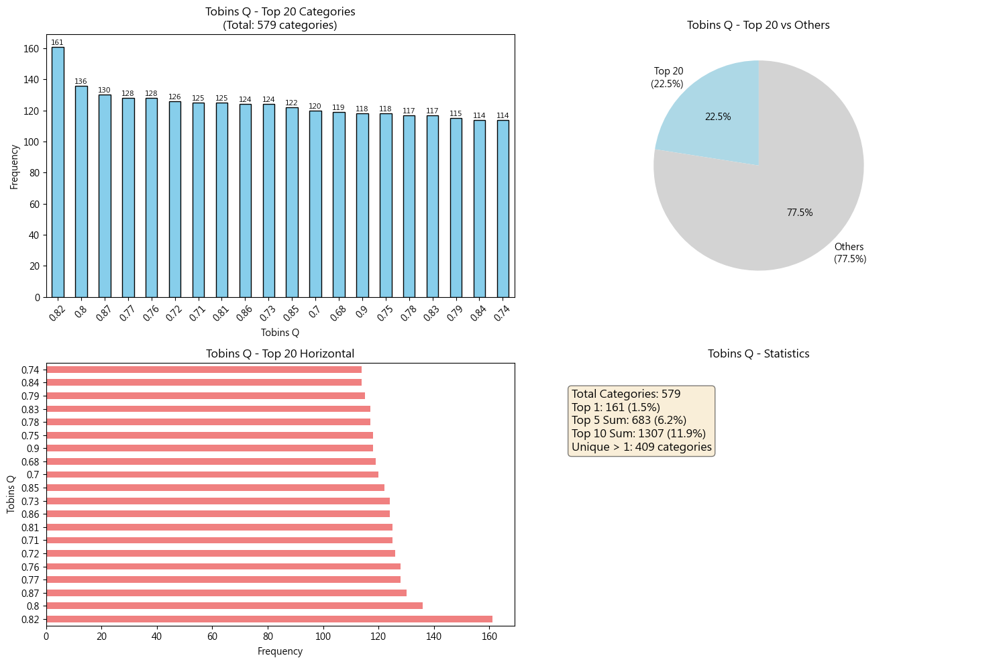


Detailed Statistics for Tobins Q:
  Most frequent value: '0.82' (count: 161, 1.5%)
  Least frequent value: '3.59' (count: 1, 0.0%)
  Top 5 values cover: 6.2% of data
  Categories with count = 1: 170

Variable 30: 財務槓桿度
Total unique values: 618
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
財務槓桿度
1       1702
-       1686
1.01     807
1.02     578
1.03     442
1.04     377
1.05     325
1.06     261
1.07     251
1.08     202
1.1      182
1.09     171
1.11     155
1.13     116
1.12     108
Name: count, dtype: int64


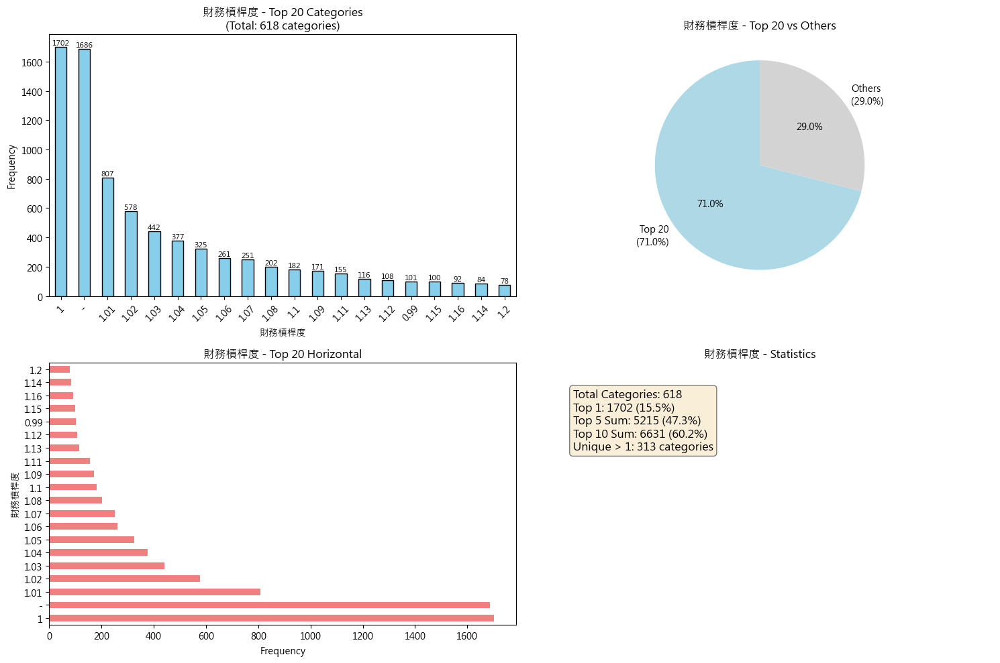


Detailed Statistics for 財務槓桿度:
  Most frequent value: '1' (count: 1702, 15.5%)
  Least frequent value: '-0.7' (count: 1, 0.0%)
  Top 5 values cover: 47.3% of data
  Categories with count = 1: 305

Variable 31: 營運槓桿度
Total unique values: 2174
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營運槓桿度
-       1813
1        199
1.16      59
1.2       57
1.18      55
1.24      53
1.13      49
1.3       47
1.12      46
1.23      46
1.09      43
1.17      43
1.25      42
1.11      42
1.1       42
Name: count, dtype: int64


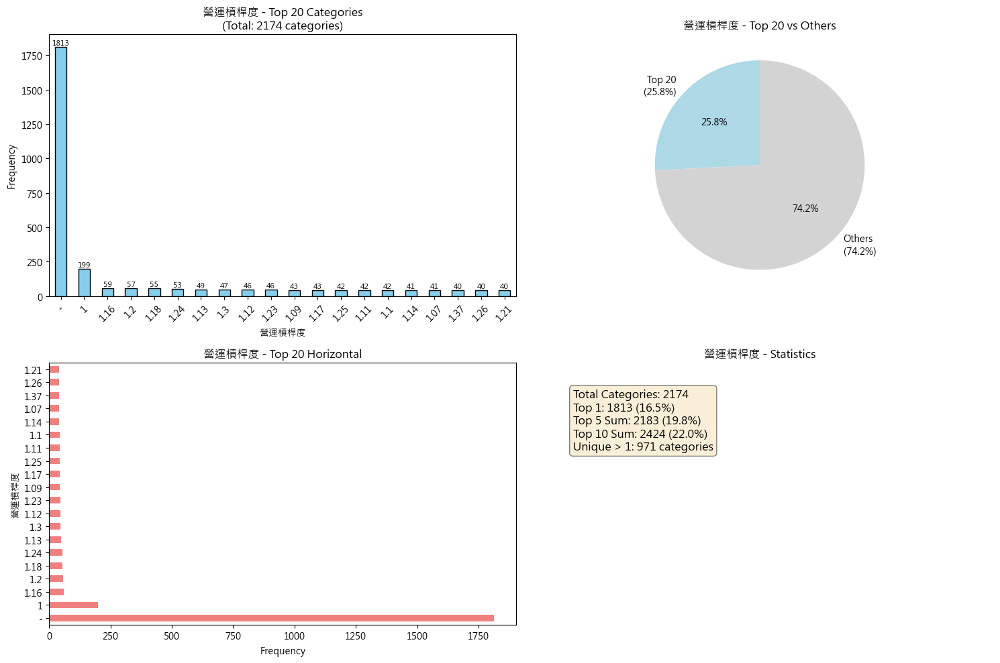


Detailed Statistics for 營運槓桿度:
  Most frequent value: '-' (count: 1813, 16.5%)
  Least frequent value: '17.92' (count: 1, 0.0%)
  Top 5 values cover: 19.8% of data
  Categories with count = 1: 1203

Variable 32: 利息保障倍數
Total unique values: 6887
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
利息保障倍數
-        680
6.4        9
6.13       9
2.91       9
4.14       8
4.74       8
3.82       8
2.59       8
1.5        8
0.02       8
2.18       7
10.58      7
13.85      7
2.15       7
12.91      7
Name: count, dtype: int64


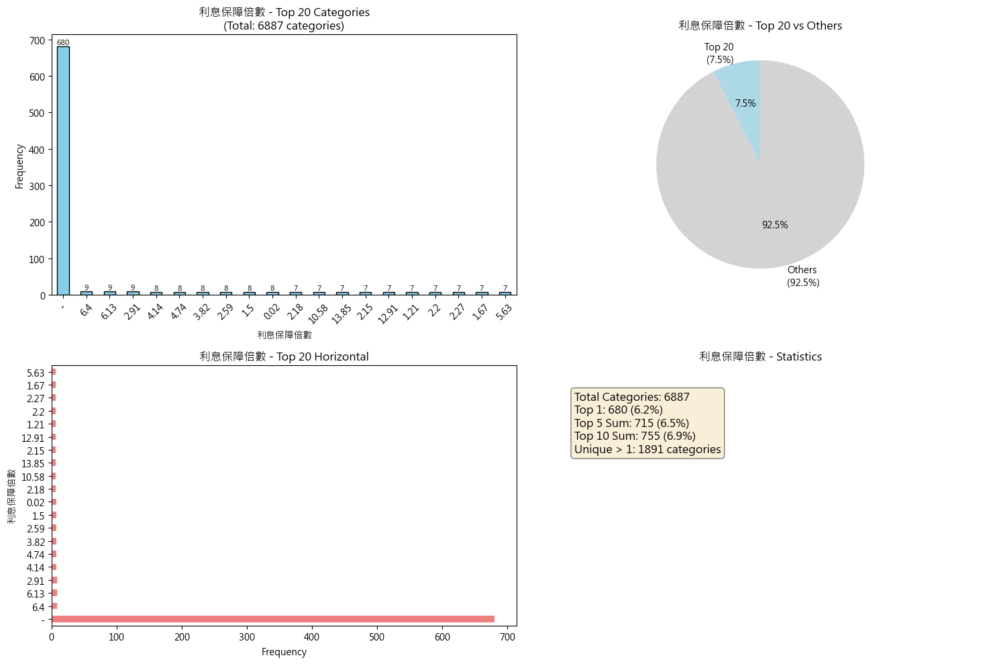


Detailed Statistics for 利息保障倍數:
  Most frequent value: '-' (count: 680, 6.2%)
  Least frequent value: '19.81' (count: 1, 0.0%)
  Top 5 values cover: 6.5% of data
  Categories with count = 1: 4996

Variable 33: ROA－綜合損益
Total unique values: 3073
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
ROA－綜合損益
-       101
2.41     17
4.62     17
0.64     16
0.6      16
1.29     15
0.73     15
2.92     15
5.05     15
0.69     15
3.34     14
0.95     14
2.91     14
3.57     14
1.73     14
Name: count, dtype: int64


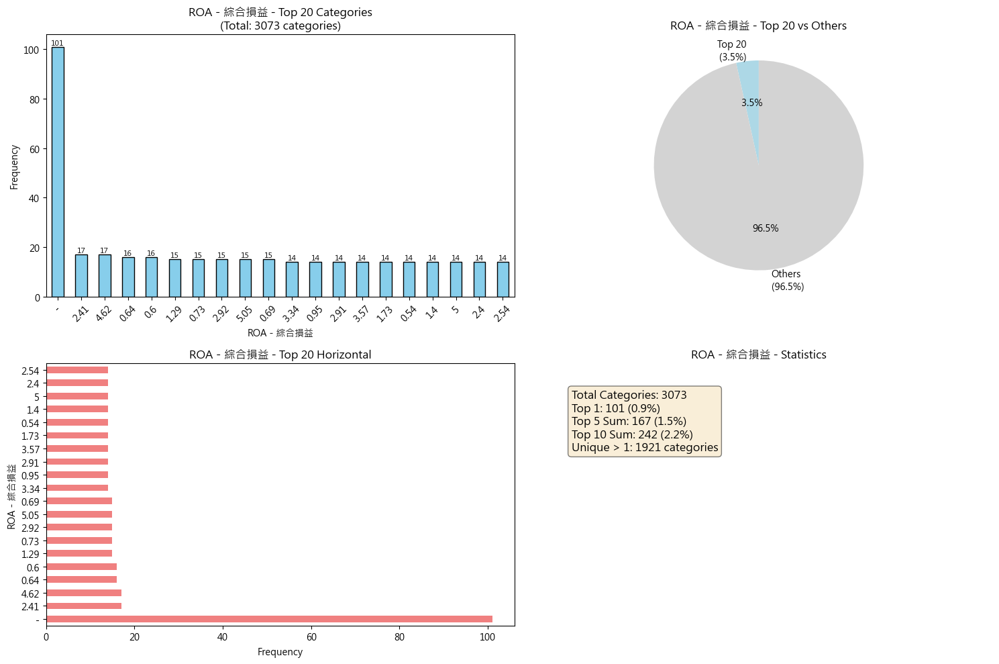


Detailed Statistics for ROA－綜合損益:
  Most frequent value: '-' (count: 101, 0.9%)
  Least frequent value: '-3.54' (count: 1, 0.0%)
  Top 5 values cover: 1.5% of data
  Categories with count = 1: 1152

Variable 34: ROE－綜合損益
Total unique values: 4404
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
ROE－綜合損益
-        101
7.55      13
0.12      12
6.48      11
4.93      11
8.21      11
11.26     11
3.07      11
3.43      10
6.35      10
11.43     10
3.39      10
4.5       10
8.97      10
11.72      9
Name: count, dtype: int64


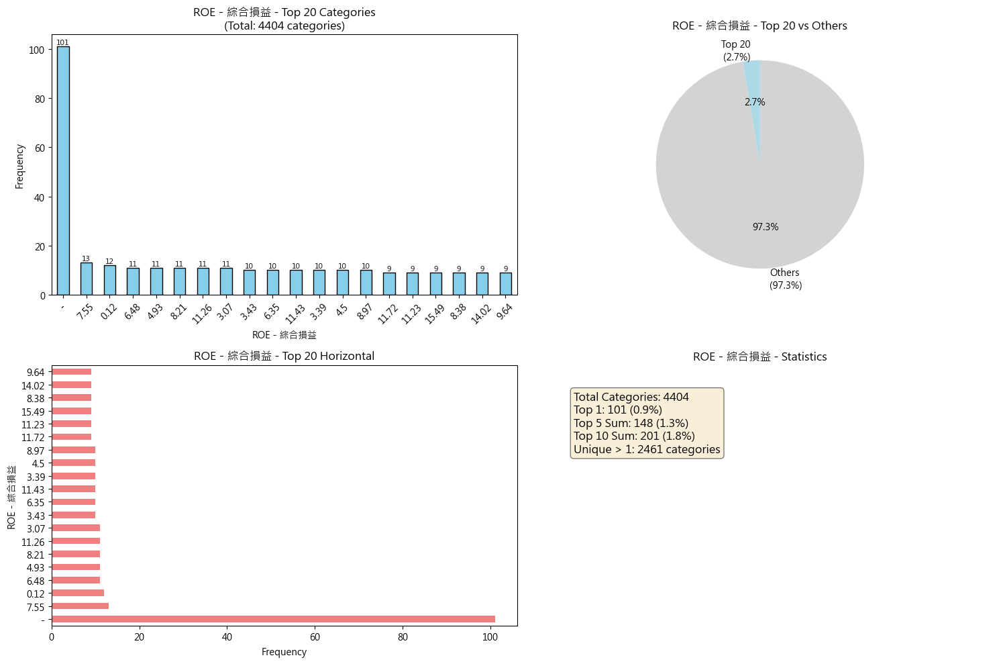


Detailed Statistics for ROE－綜合損益:
  Most frequent value: '-' (count: 101, 0.9%)
  Least frequent value: '-7.42' (count: 1, 0.0%)
  Top 5 values cover: 1.3% of data
  Categories with count = 1: 1943

Variable 35: 現金流量允當比
Total unique values: 8515
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
現金流量允當比
-         605
104.33      6
95.63       5
8.99        5
75.33       5
116.44      5
73.34       4
134.54      4
110.52      4
85.64       4
90.48       4
57.93       4
75.07       4
92.09       4
67.65       4
Name: count, dtype: int64


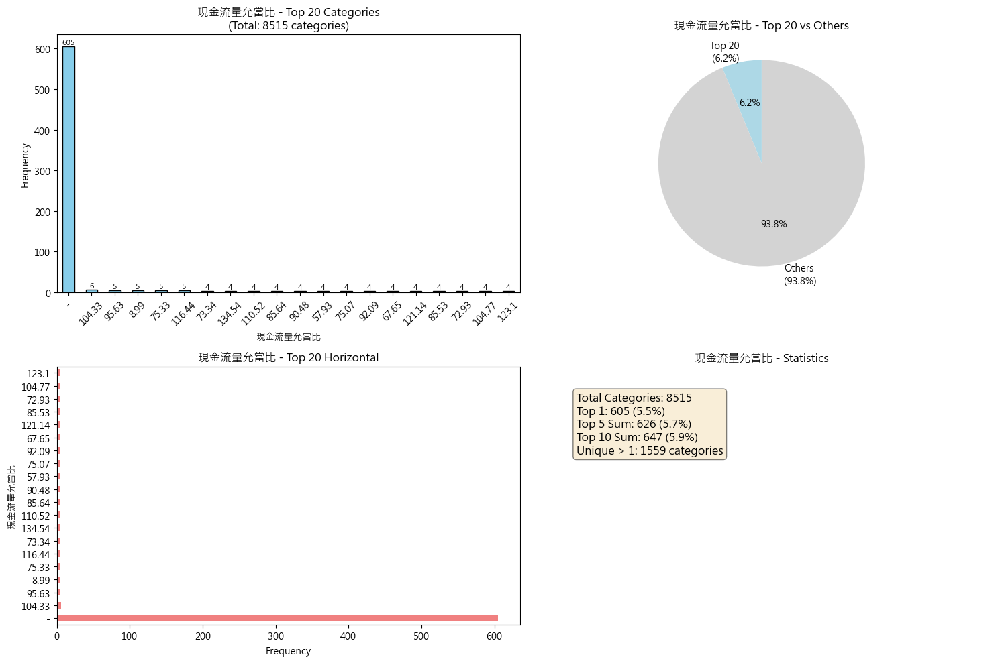


Detailed Statistics for 現金流量允當比:
  Most frequent value: '-' (count: 605, 5.5%)
  Least frequent value: '7.64' (count: 1, 0.0%)
  Top 5 values cover: 5.7% of data
  Categories with count = 1: 6956

Variable 36: 現金再投資比
Total unique values: 3618
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
現金再投資比
-       561
4.28     16
1.69     14
1.71     14
2.79     13
2.95     13
3.74     13
3.31     13
2.68     12
1.42     12
4.32     12
3.45     12
2.34     12
2.32     12
3.62     12
Name: count, dtype: int64


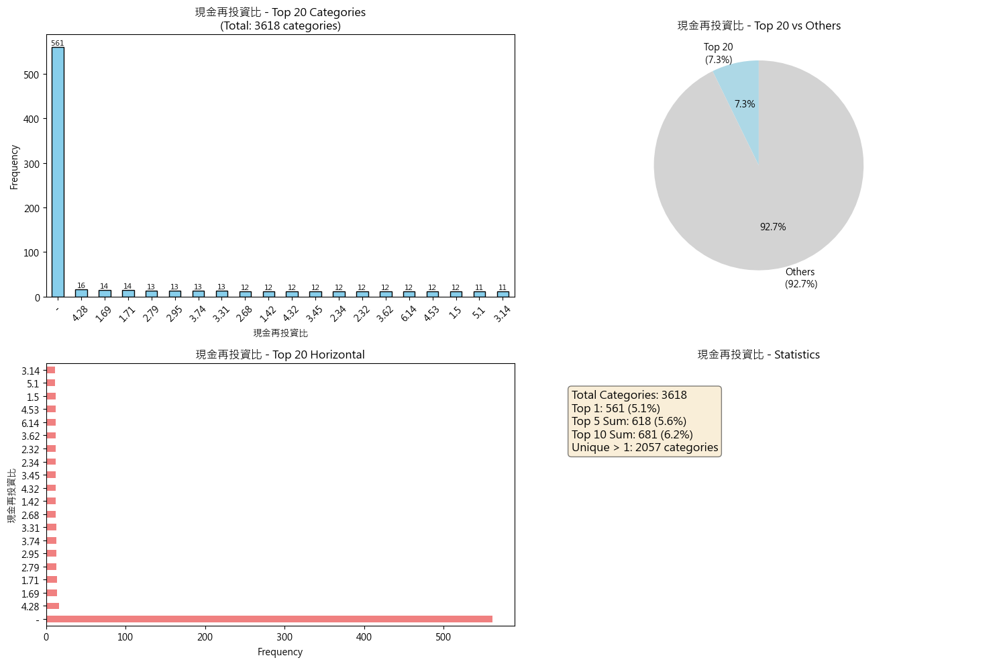


Detailed Statistics for 現金再投資比:
  Most frequent value: '-' (count: 561, 5.1%)
  Least frequent value: '-7.04' (count: 1, 0.0%)
  Top 5 values cover: 5.6% of data
  Categories with count = 1: 1561

Variable 37: 流動比率
Total unique values: 9119
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
流動比率
-         341
236.32      5
139.25      4
224.11      4
153.45      4
109.15      4
166.44      4
135.79      4
182.16      4
173.68      4
156.19      4
139.3       4
138.34      4
124.69      4
100.51      4
Name: count, dtype: int64


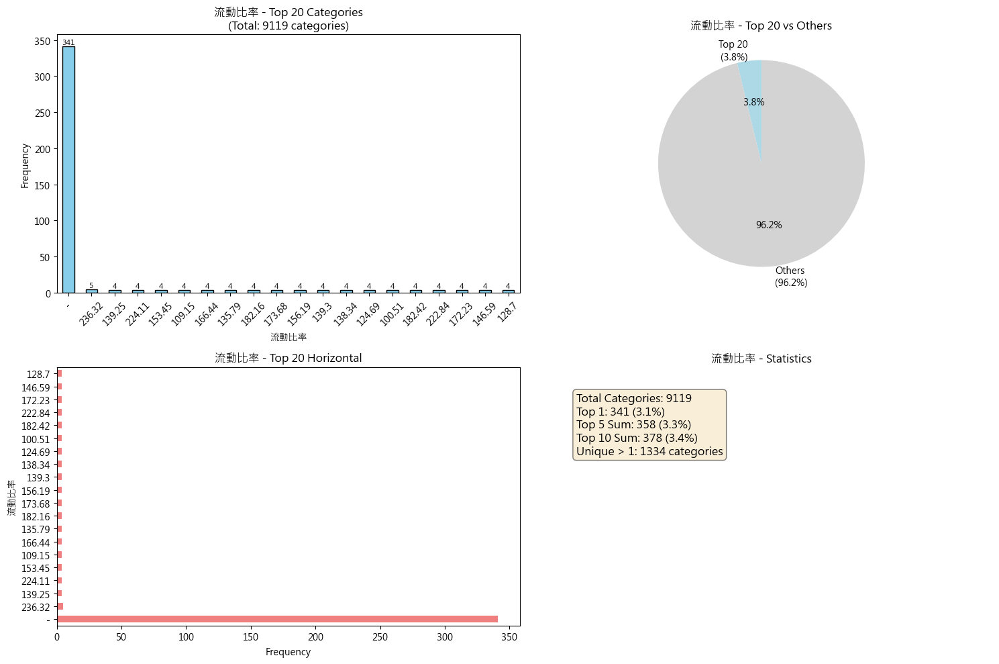


Detailed Statistics for 流動比率:
  Most frequent value: '-' (count: 341, 3.1%)
  Least frequent value: '149.48' (count: 1, 0.0%)
  Top 5 values cover: 3.3% of data
  Categories with count = 1: 7785

Variable 38: 速動比率
Total unique values: 9024
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
速動比率
-         342
82.36       6
93.85       5
67.19       5
96.19       5
129.72      4
80.67       4
92.66       4
93.99       4
116.02      4
114.1       4
93.39       4
126.61      4
91.49       4
134.92      4
Name: count, dtype: int64


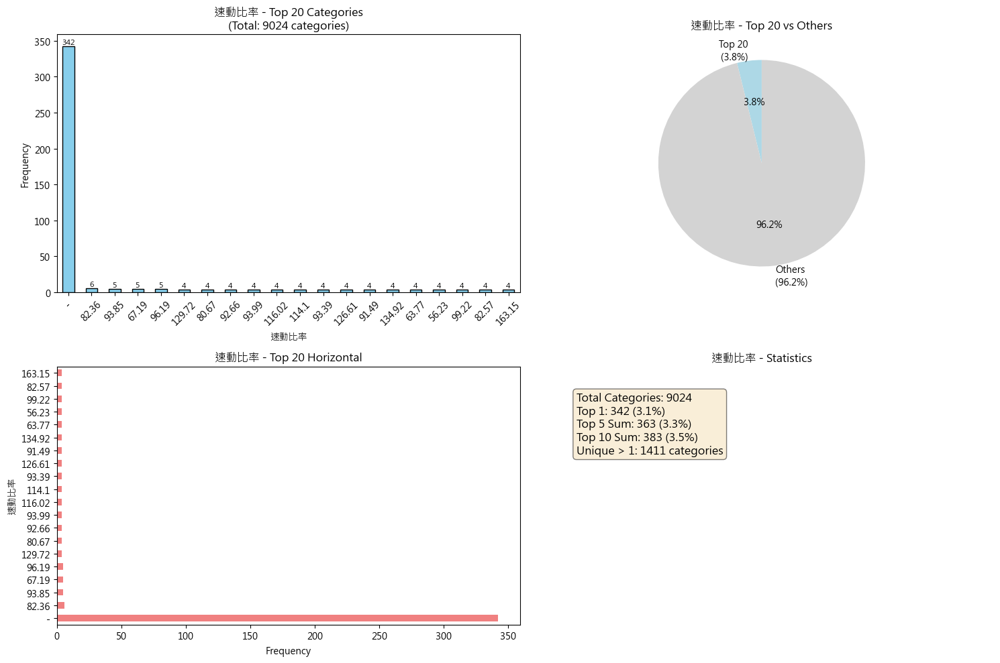


Detailed Statistics for 速動比率:
  Most frequent value: '-' (count: 342, 3.1%)
  Least frequent value: '46.61' (count: 1, 0.0%)
  Top 5 values cover: 3.3% of data
  Categories with count = 1: 7613

Variable 39: 利息支出率
Total unique values: 4634
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
利息支出率
0       398
-       218
0.01     60
0.02     49
0.03     41
0.05     38
0.06     33
0.04     33
0.16     32
0.07     30
0.13     29
0.1      29
0.14     29
0.2      29
0.12     28
Name: count, dtype: int64


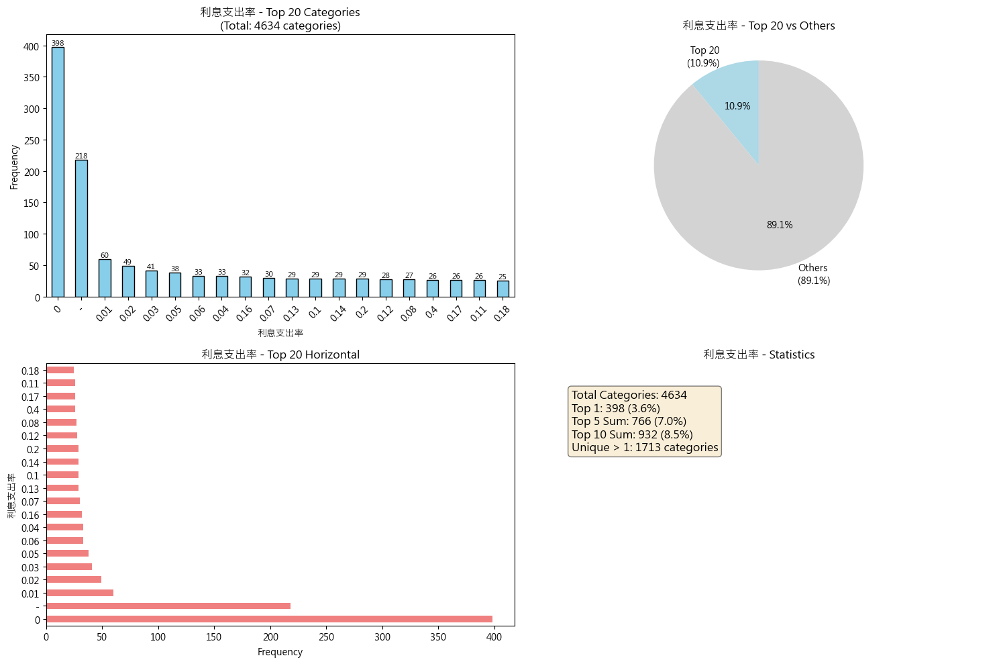


Detailed Statistics for 利息支出率:
  Most frequent value: '0' (count: 398, 3.6%)
  Least frequent value: '78.03' (count: 1, 0.0%)
  Top 5 values cover: 7.0% of data
  Categories with count = 1: 2921

Variable 40: 利息支出率(B)
Total unique values: 1022
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
利息支出率(B)
0       1027
-        384
0.01     304
0.02     196
0.03     171
0.04     164
0.06     152
0.12     132
0.05     125
0.09     121
0.07     119
0.1      119
0.15     116
0.13     114
0.14     109
Name: count, dtype: int64


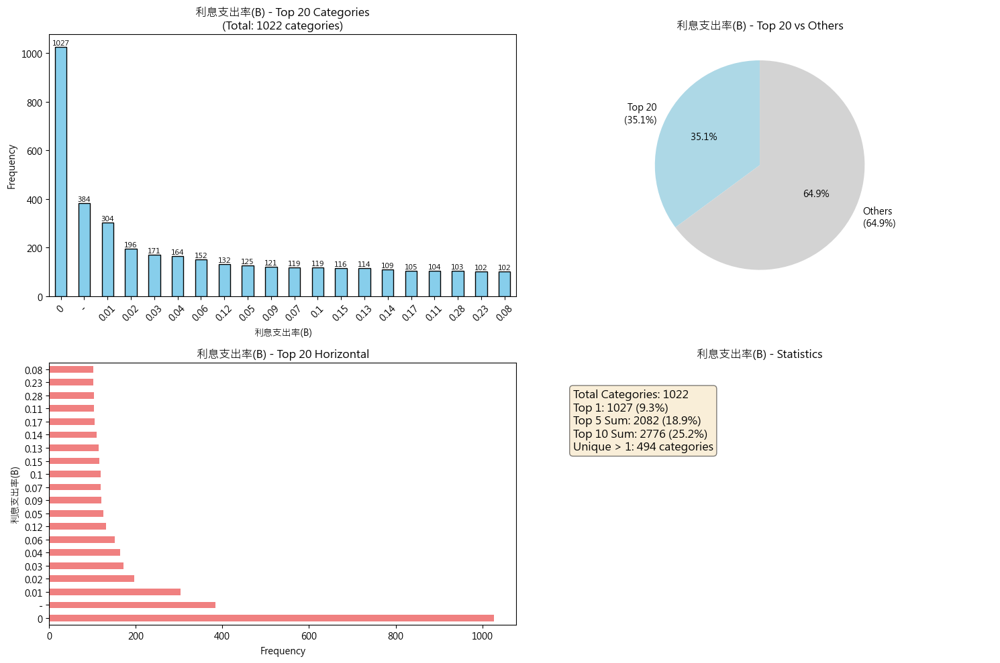


Detailed Statistics for 利息支出率(B):
  Most frequent value: '0' (count: 1027, 9.3%)
  Least frequent value: '7.31' (count: 1, 0.0%)
  Top 5 values cover: 18.9% of data
  Categories with count = 1: 528

Variable 41: 總負債/總淨值
Total unique values: 8638
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
總負債/總淨值
87.29    7
69.7     6
15.18    5
55.85    5
102.3    5
46.48    5
71.95    5
61.89    5
38.88    5
35.39    5
38.79    5
89.49    5
46.19    4
46.85    4
61.64    4
Name: count, dtype: int64


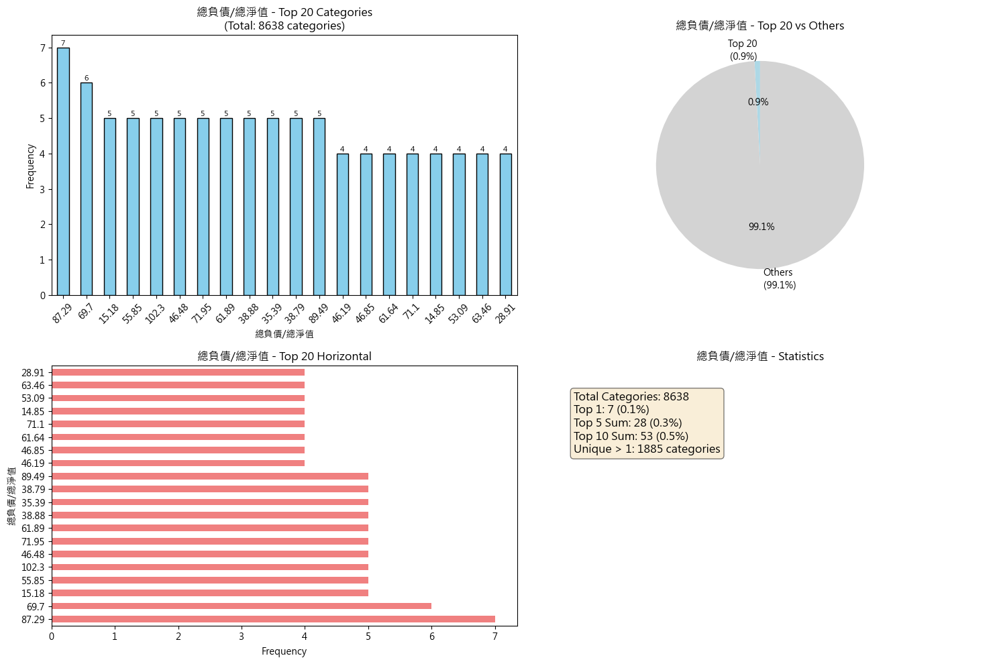


Detailed Statistics for 總負債/總淨值:
  Most frequent value: '87.29' (count: 7, 0.1%)
  Least frequent value: '166.51' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 6753

Variable 42: 長期資金適合率(A)
Total unique values: 9847
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
長期資金適合率(A)
-         344
171.24      5
191.16      4
176.6       4
159.16      4
183.18      4
214.66      3
182.11      3
196.08      3
230.46      3
131.02      3
319.53      3
154.22      3
183.21      3
249.5       3
Name: count, dtype: int64


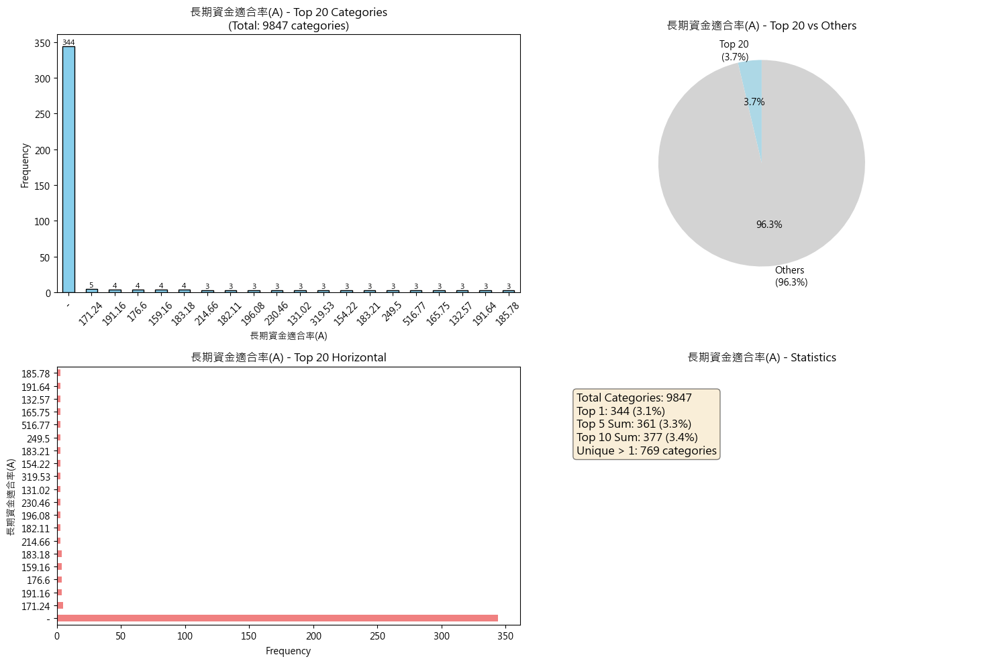


Detailed Statistics for 長期資金適合率(A):
  Most frequent value: '-' (count: 344, 3.1%)
  Least frequent value: '140.95' (count: 1, 0.0%)
  Top 5 values cover: 3.3% of data
  Categories with count = 1: 9078

Variable 43: 長短期借款
Total unique values: 9141
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
長短期借款
0          1440
100,000      29
50,000       24
200,000      24
35,000       14
150,000      14
30,000       14
60,000       13
40,000       13
20,000       11
500,000      10
300,000      10
600,000       9
220,000       8
450,000       8
Name: count, dtype: int64


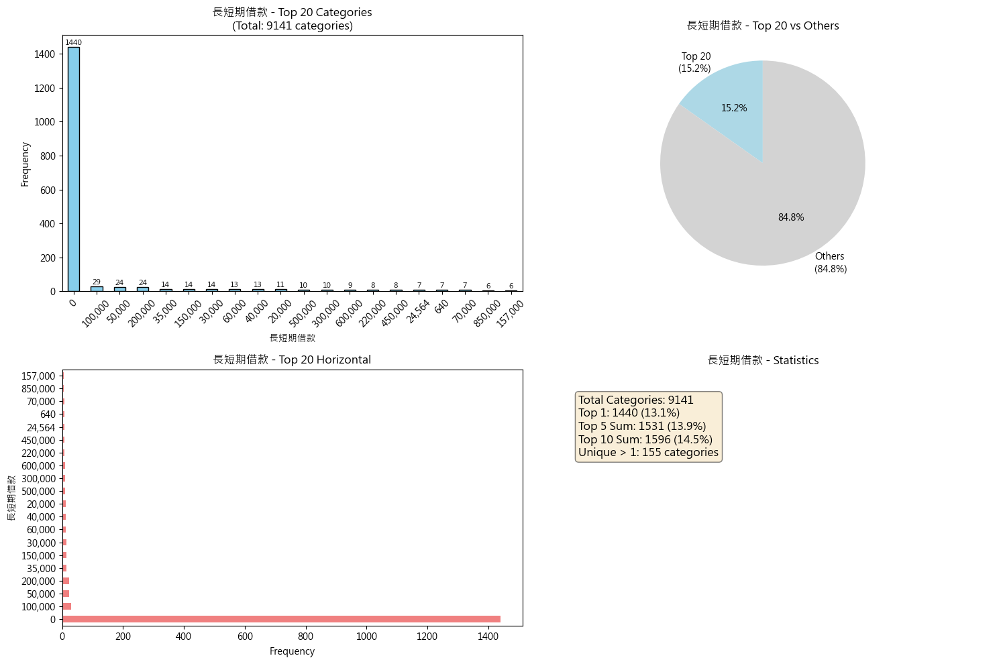


Detailed Statistics for 長短期借款:
  Most frequent value: '0' (count: 1440, 13.1%)
  Least frequent value: '9,154,078' (count: 1, 0.0%)
  Top 5 values cover: 13.9% of data
  Categories with count = 1: 8986

Variable 44: 淨負債
Total unique values: 10630
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
淨負債
-             375
690,216         2
327,430         2
817,483         2
371,173         2
292,281         2
3,150,635       2
-847,048        2
-274,507        2
-162,647        2
-81,429         2
787,422         1
-140,372        1
536,787         1
86,938,867      1
Name: count, dtype: int64


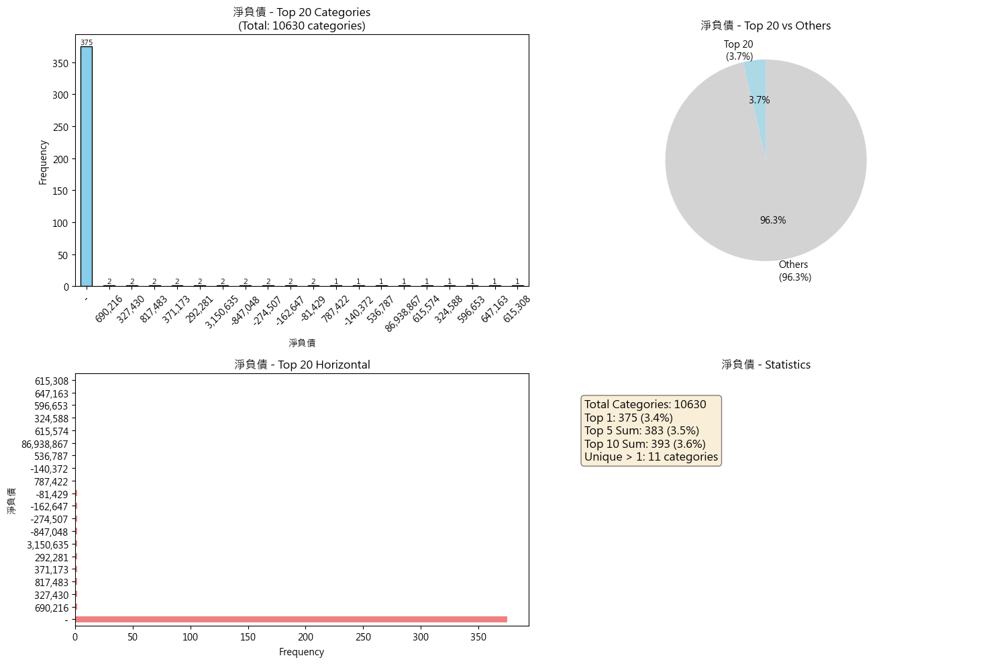


Detailed Statistics for 淨負債:
  Most frequent value: '-' (count: 375, 3.4%)
  Least frequent value: '6,797,863' (count: 1, 0.0%)
  Top 5 values cover: 3.5% of data
  Categories with count = 1: 10619

Variable 45: 借款依存度
Total unique values: 6505
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
借款依存度
0        1378
-         342
0.01       10
0.09        9
0.17        7
3.44        7
0.67        7
19.89       7
0.53        6
0.02        6
26.64       6
0.06        6
0.28        6
0.07        6
0.05        6
Name: count, dtype: int64


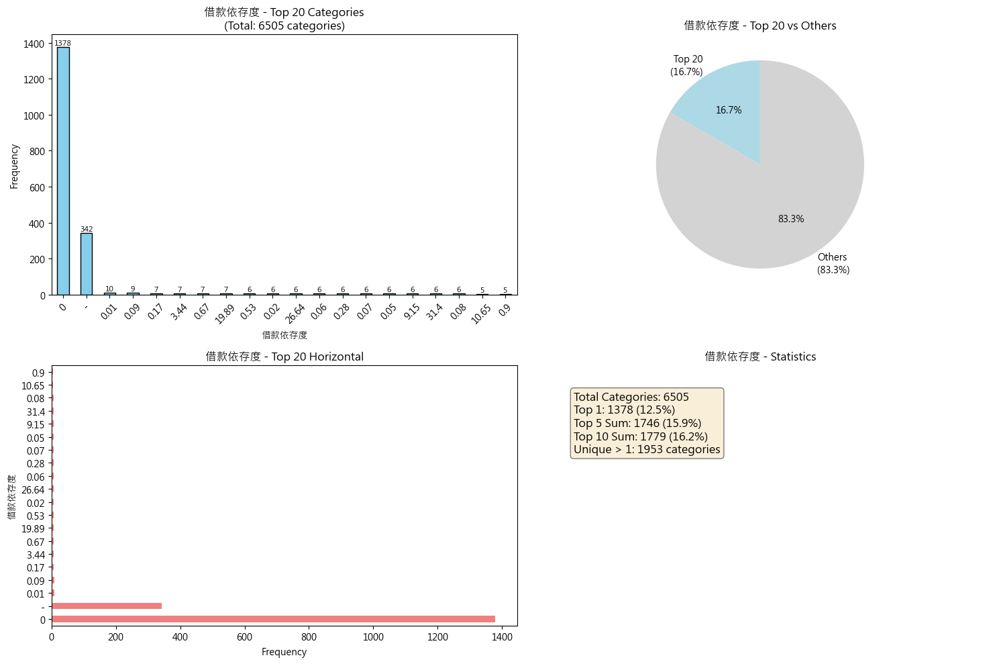


Detailed Statistics for 借款依存度:
  Most frequent value: '0' (count: 1378, 12.5%)
  Least frequent value: '101.7' (count: 1, 0.0%)
  Top 5 values cover: 15.9% of data
  Categories with count = 1: 4552

Variable 46: 或有負債/淨值
Total unique values: 466
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
或有負債/淨值
0       9987
-        371
0.02      13
0.01       8
0.3        7
0.08       6
0.26       6
0.5        6
0.34       5
0.13       5
0.23       4
0.17       4
0.4        4
0.28       4
0.39       4
Name: count, dtype: int64


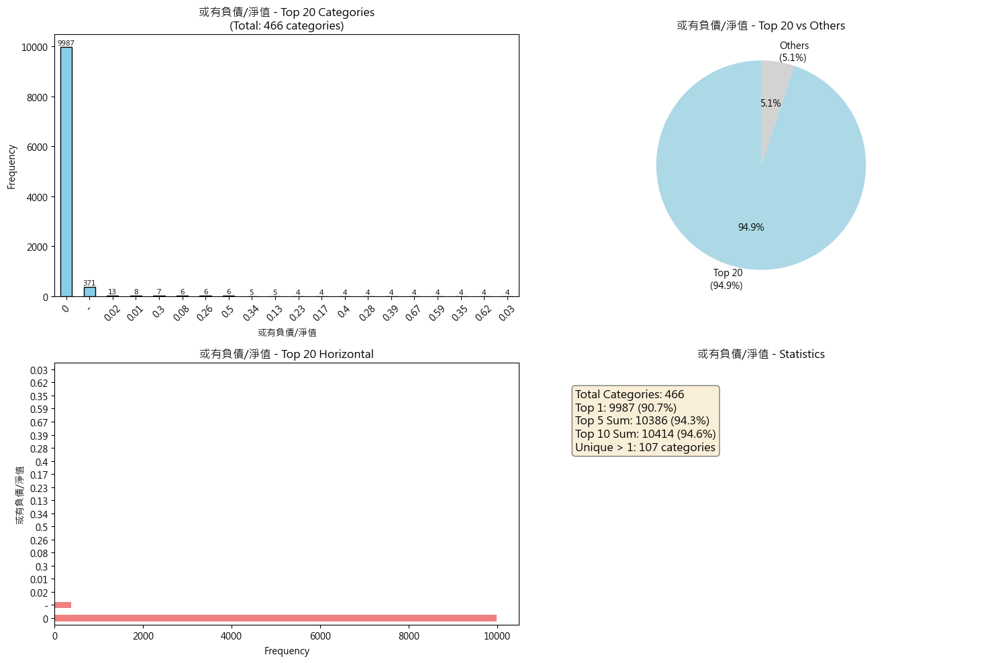


Detailed Statistics for 或有負債/淨值:
  Most frequent value: '0' (count: 9987, 90.7%)
  Least frequent value: '20.38' (count: 1, 0.0%)
  Top 5 values cover: 94.3% of data
  Categories with count = 1: 359

Variable 47: 營業利益 /實收資本比
Total unique values: 7207
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業利益 /實收資本比
-        295
12.5       7
4.36       7
1.06       7
0.56       6
10.32      6
1.98       6
0.76       6
2.11       6
18.29      6
3.44       6
4.75       6
8.65       6
0.97       6
8.49       6
Name: count, dtype: int64


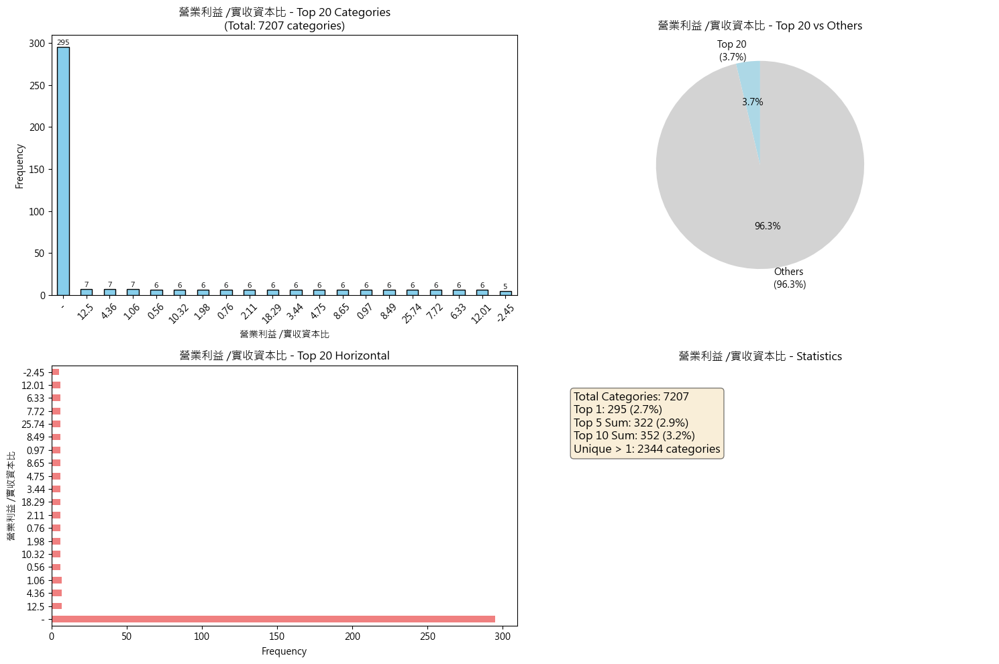


Detailed Statistics for 營業利益 /實收資本比:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '115.66' (count: 1, 0.0%)
  Top 5 values cover: 2.9% of data
  Categories with count = 1: 4863

Variable 48: 稅前純益 /實收資本
Total unique values: 7477
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
稅前純益 /實收資本
-        20
-2.85     7
27.91     7
13.15     7
24.12     6
9.56      6
2.88      6
25.76     6
5.18      6
16.95     6
14.91     6
13.25     6
17.83     6
23.02     6
18.5      6
Name: count, dtype: int64


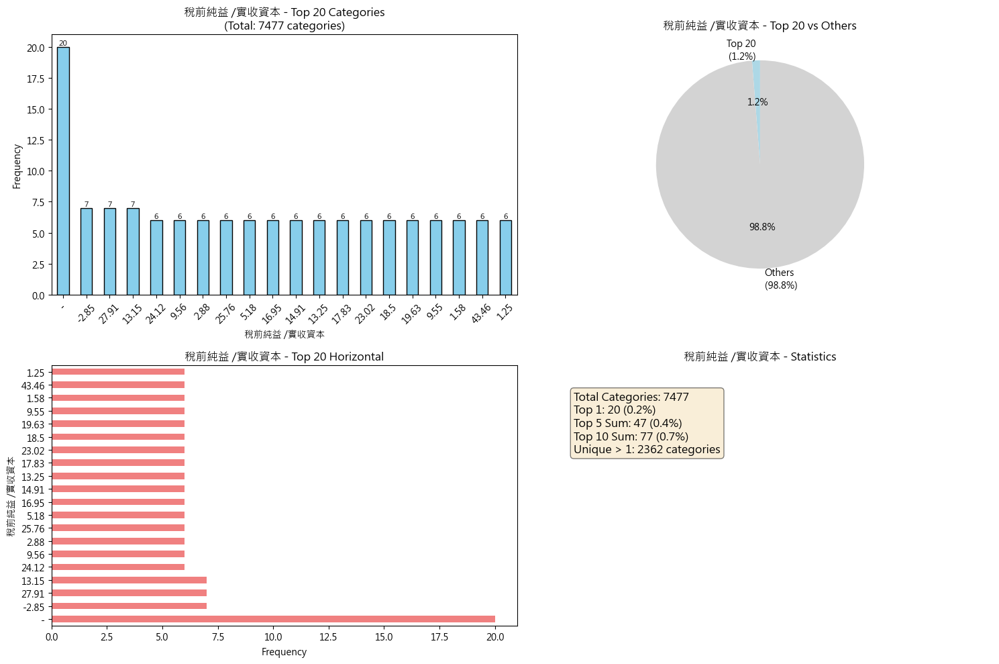


Detailed Statistics for 稅前純益 /實收資本:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '82.64' (count: 1, 0.0%)
  Top 5 values cover: 0.4% of data
  Categories with count = 1: 5115

Variable 49: 內部保留比率
Total unique values: 5476
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
內部保留比率
-        1783
100       994
10         26
40.16       8
0           8
10.46       8
17.75       8
27.49       7
19.67       6
50.19       6
15.14       6
40          5
51.18       5
54.26       5
10.2        5
Name: count, dtype: int64


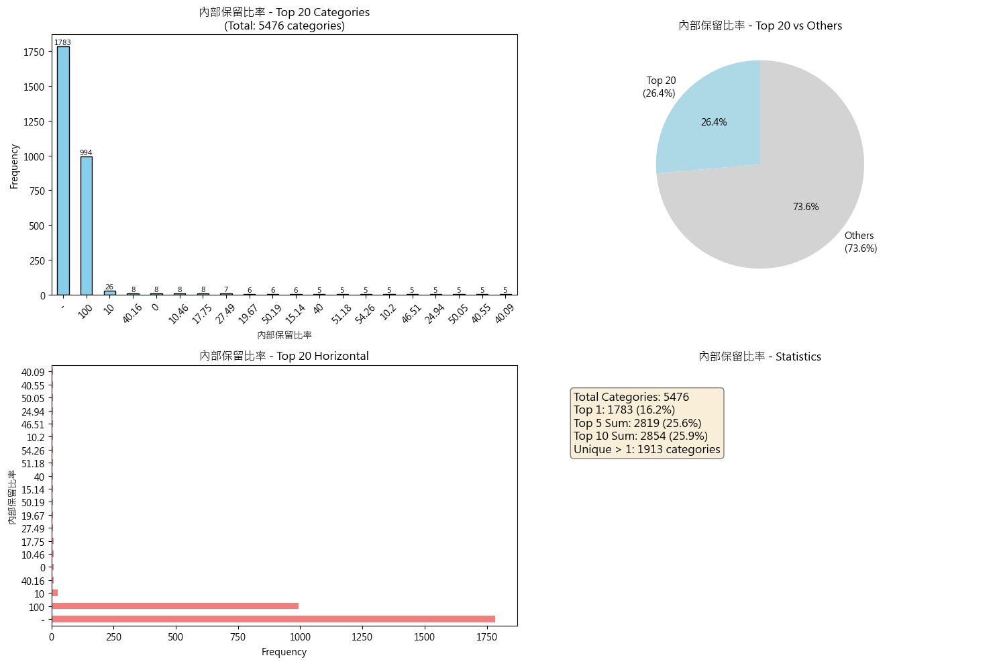


Detailed Statistics for 內部保留比率:
  Most frequent value: '-' (count: 1783, 16.2%)
  Least frequent value: '68.43' (count: 1, 0.0%)
  Top 5 values cover: 25.6% of data
  Categories with count = 1: 3563

Variable 50: 股利支付率
Total unique values: 5555
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
股利支付率
0        2494
-         218
90         27
89.54       8
59.84       8
82.25       8
100         8
60          7
72.51       7
49.95       6
74.86       6
84.86       6
80.33       6
49.81       6
73.26       5
Name: count, dtype: int64


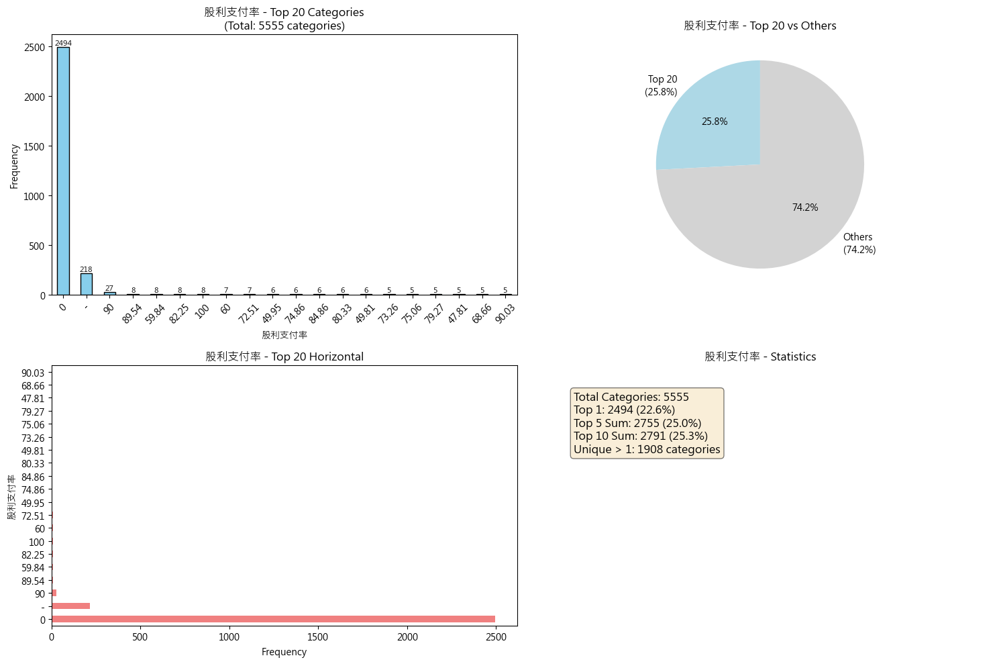


Detailed Statistics for 股利支付率:
  Most frequent value: '0' (count: 2494, 22.6%)
  Least frequent value: '31.57' (count: 1, 0.0%)
  Top 5 values cover: 25.0% of data
  Categories with count = 1: 3647

Variable 51: tcri
Total unique values: 7
Total non-null values: 6624
Missing values: 4390

Top 15 most frequent values:
tcri
6    2161
5    2054
7    1389
8     667
9     292
D      59
C       2
Name: count, dtype: int64


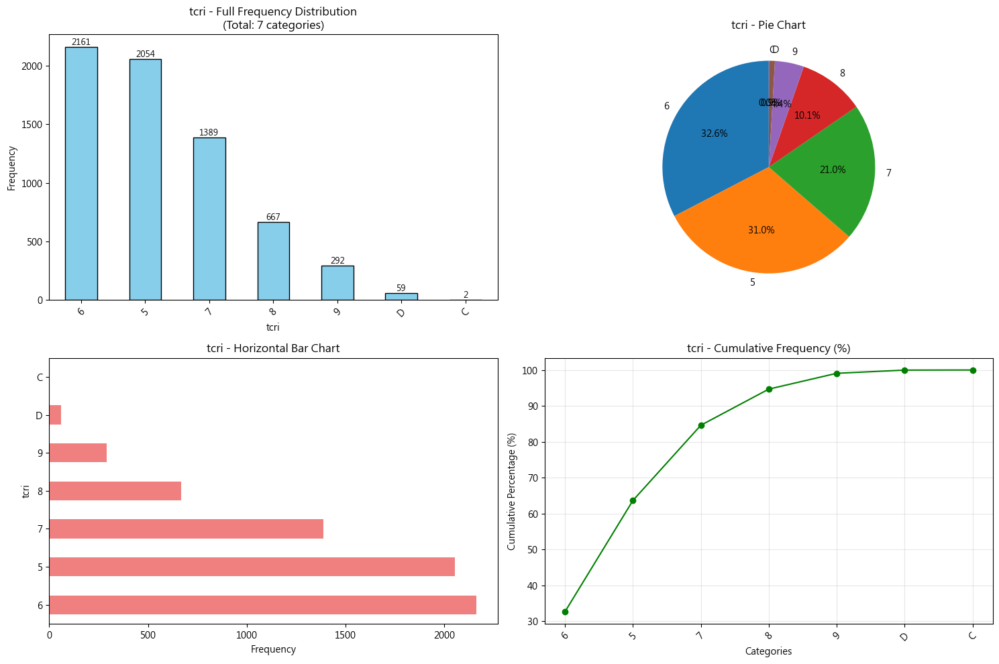


Detailed Statistics for tcri:
  Most frequent value: '6' (count: 2161, 32.6%)
  Least frequent value: 'C' (count: 2, 0.0%)
  Top 5 values cover: 99.1% of data
  Categories with count = 1: 0

CATEGORICAL VARIABLES ANALYSIS COMPLETED


In [18]:
print("\n" + "="*50)
print("3. CATEGORICAL VARIABLES FREQUENCY - COMPLETE VISUALIZATION")
print("="*50)

# 獲取所有類別型變數
categorical_vars = merged_data.select_dtypes(include=['object']).columns.tolist()

if categorical_vars:
    print(f"Found {len(categorical_vars)} categorical variables:")
    print(categorical_vars)
    
    # 為每個類別變數創建頻率圖表
    for i, col in enumerate(categorical_vars):
        print(f"\n{'='*30}")
        print(f"Variable {i+1}: {col}")
        print(f"{'='*30}")
        
        # 計算頻率
        freq = merged_data[col].value_counts()
        total_unique = len(freq)
        
        print(f"Total unique values: {total_unique}")
        print(f"Total non-null values: {merged_data[col].notna().sum()}")
        print(f"Missing values: {merged_data[col].isna().sum()}")
        
        # 顯示前15個最頻繁的值
        print(f"\nTop 15 most frequent values:")
        print(freq.head(15))
        
        # 創建圖表
        plt.figure(figsize=(15, 10))
        
        if total_unique <= 15:
            # 如果類別數少於等於15，顯示完整條形圖
            plt.subplot(2, 2, 1)
            bars = freq.plot(kind='bar', color='skyblue', edgecolor='black')
            plt.title(f'{col} - Full Frequency Distribution\n(Total: {total_unique} categories)')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.xticks(rotation=45)
            
            # 在條形上添加數值標籤
            for idx, value in enumerate(freq):
                plt.text(idx, value, str(value), ha='center', va='bottom', fontsize=9)
            
            # 餅圖
            plt.subplot(2, 2, 2)
            # 只顯示前10個，其他歸為"Other"
            if total_unique > 10:
                top_10 = freq.head(10)
                other_sum = freq[10:].sum()
                pie_data = pd.concat([top_10, pd.Series([other_sum], index=['Other'])])
                plt.pie(pie_data, labels=pie_data.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'{col} - Pie Chart (Top 10 + Other)')
            else:
                plt.pie(freq, labels=freq.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'{col} - Pie Chart')
            
            # 水平條形圖
            plt.subplot(2, 2, 3)
            freq.plot(kind='barh', color='lightcoral')
            plt.title(f'{col} - Horizontal Bar Chart')
            plt.xlabel('Frequency')
            plt.ylabel(col)
            
            # 累積頻率圖
            plt.subplot(2, 2, 4)
            cumulative_freq = freq.cumsum() / freq.sum() * 100
            cumulative_freq.plot(kind='line', marker='o', color='green')
            plt.title(f'{col} - Cumulative Frequency (%)')
            plt.xlabel('Categories')
            plt.ylabel('Cumulative Percentage (%)')
            plt.grid(True, alpha=0.3)
            plt.xticks(rotation=45)
            
        else:
            # 如果類別數很多，只顯示前20個
            top_20 = freq.head(20)
            plt.subplot(2, 2, 1)
            bars = top_20.plot(kind='bar', color='skyblue', edgecolor='black')
            plt.title(f'{col} - Top 20 Categories\n(Total: {total_unique} categories)')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.xticks(rotation=45)
            
            # 在條形上添加數值標籤
            for idx, value in enumerate(top_20):
                plt.text(idx, value, str(value), ha='center', va='bottom', fontsize=8)
            
            # 顯示前20個佔總體的比例
            plt.subplot(2, 2, 2)
            top_20_percentage = (top_20.sum() / freq.sum()) * 100
            others_percentage = 100 - top_20_percentage
            
            pie_data = pd.Series([top_20_percentage, others_percentage], 
                               index=[f'Top 20\n({top_20_percentage:.1f}%)', 
                                      f'Others\n({others_percentage:.1f}%)'])
            plt.pie(pie_data, labels=pie_data.index, autopct='%1.1f%%', startangle=90,
                   colors=['lightblue', 'lightgray'])
            plt.title(f'{col} - Top 20 vs Others')
            
            # 前20個的水平條形圖
            plt.subplot(2, 2, 3)
            top_20.plot(kind='barh', color='lightcoral')
            plt.title(f'{col} - Top 20 Horizontal')
            plt.xlabel('Frequency')
            plt.ylabel(col)
            
            # 類別數量統計
            plt.subplot(2, 2, 4)
            value_counts_info = [
                f'Total Categories: {total_unique}',
                f'Top 1: {freq.iloc[0]} ({freq.iloc[0]/freq.sum()*100:.1f}%)',
                f'Top 5 Sum: {freq.head(5).sum()} ({freq.head(5).sum()/freq.sum()*100:.1f}%)',
                f'Top 10 Sum: {freq.head(10).sum()} ({freq.head(10).sum()/freq.sum()*100:.1f}%)',
                f'Unique > 1: {(freq > 1).sum()} categories'
            ]
            
            plt.text(0.1, 0.9, '\n'.join(value_counts_info), 
                    fontsize=12, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            plt.xlim(0, 1)
            plt.ylim(0, 1)
            plt.axis('off')
            plt.title(f'{col} - Statistics')
        
        plt.tight_layout()
        plt.show()
        
        # 顯示該變數的詳細統計
        print(f"\nDetailed Statistics for {col}:")
        print(f"  Most frequent value: '{freq.index[0]}' (count: {freq.iloc[0]}, {freq.iloc[0]/freq.sum()*100:.1f}%)")
        print(f"  Least frequent value: '{freq.index[-1]}' (count: {freq.iloc[-1]}, {freq.iloc[-1]/freq.sum()*100:.1f}%)")
        print(f"  Top 5 values cover: {freq.head(5).sum()/freq.sum()*100:.1f}% of data")
        print(f"  Categories with count = 1: {(freq == 1).sum()}")
        
else:
    print("No categorical variables found in the dataset.")

print(f"\n{'='*50}")
print("CATEGORICAL VARIABLES ANALYSIS COMPLETED")
print(f"{'='*50}")


COMPARATIVE ANALYSIS OF ALL CATEGORICAL VARIABLES


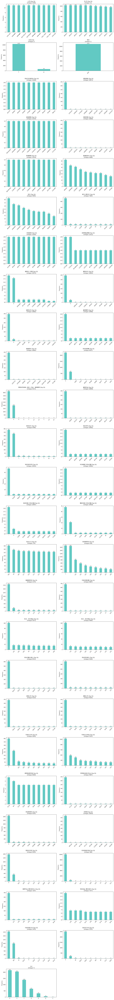


Summary Table of All Categorical Variables:
           Variable  Unique_Values  Missing_Values Most_Frequent  Most_Freq_Count Most_Freq_Pct Top3_Coverage
                 公司           1030               0       1101 台泥               11          0.1%          0.3%
                年/月             11               0       2024/12             1029          9.3%         28.0%
            合併(Y/N)              2               0             Y            10378         94.2%        100.0%
                 幣別              1               0           NTD            11014        100.0%        100.0%
            現金及約當現金          11000               0       101,579                2          0.0%          0.1%
               流動資產          10672               0             -              341          3.1%          3.1%
               資產總額          11014               0   593,413,647                1          0.0%          0.0%
               流動負債          10668               0             -           

In [19]:
# 額外：所有類別變數的綜合比較圖
if categorical_vars and len(categorical_vars) > 1:
    print(f"\n{'='*50}")
    print("COMPARATIVE ANALYSIS OF ALL CATEGORICAL VARIABLES")
    print(f"{'='*50}")
    
    # 創建綜合比較圖
    n_vars = len(categorical_vars)
    n_cols = 2
    n_rows = (n_vars + n_cols - 1) // n_cols
    
    plt.figure(figsize=(15, 5 * n_rows))
    
    for i, col in enumerate(categorical_vars):
        plt.subplot(n_rows, n_cols, i + 1)
        freq = merged_data[col].value_counts()
        
        # 只顯示前10個（如果類別太多）
        if len(freq) > 10:
            plot_data = freq.head(10)
            title_suffix = " (Top 10)"
        else:
            plot_data = freq
            title_suffix = ""
        
        plot_data.plot(kind='bar', color='lightseagreen', alpha=0.7)
        plt.title(f'{col}{title_suffix}\n(Unique: {len(freq)})')
        plt.xlabel('')
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)
        
        # 添加數值標籤
        for idx, value in enumerate(plot_data):
            plt.text(idx, value, str(value), ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    # 顯示所有類別變數的摘要表格
    print("\nSummary Table of All Categorical Variables:")
    summary_data = []
    for col in categorical_vars:
        freq = merged_data[col].value_counts()
        summary_data.append({
            'Variable': col,
            'Unique_Values': len(freq),
            'Missing_Values': merged_data[col].isna().sum(),
            'Most_Frequent': freq.index[0],
            'Most_Freq_Count': freq.iloc[0],
            'Most_Freq_Pct': f"{freq.iloc[0]/len(merged_data)*100:.1f}%",
            'Top3_Coverage': f"{freq.head(3).sum()/len(merged_data)*100:.1f}%"
        })
    
    summary_df = pd.DataFrame(summary_data)
    print(summary_df.to_string(index=False))